In [2]:
# load librairies
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import os
from os.path import join
import seaborn as sns
import scipy
import json


from functions import utils, io

# 1. Load subjects data #

In [3]:
included_subjects = [
    #'preop001 mSST',  # preop group hasn't really be recorded, let's discard for now

    # 'C001 mSST', 'C002 mSST', # pilot participants
    'C003 mSST', 'C004 mSST', 'C006 mSST', 'C007 mSST','C008 mSST','C009 mSST', 'C010 mSST', 'C011 mSST', 'C012 mSST',
    'sub006 DBS ON mSST', 'sub006 DBS OFF mSST', 
    #'sub007 DBS OFF mSST', # no ON session
    'sub008 DBS ON mSST', 'sub008 DBS OFF mSST', 
    'sub009 DBS ON mSST', 'sub009 DBS OFF mSST', 
    'sub011 DBS OFF mSST', 'sub011 DBS ON mSST', 
    #'sub012 DBS ON mSST', # no OFF session, file crashed
    #'sub013 DBS OFF mSST', # no ON session
    #'sub014 DBS ON mSST', # no OFF session
    'sub015 DBS OFF mSST', 'sub015 DBS ON mSST', 
    'sub017 DBS ON mSST',  'sub017 DBS OFF mSST', 
    'sub019 DBS ON mSST', 'sub019 DBS OFF mSST', 
    #'sub020 DBS ON mSST', # no OFF session
    'sub021 DBS OFF mSST', 'sub021 DBS ON mSST', 
    #'sub022 DBS ON mSST', # no OFF session
    'sub023 DBS OFF mSST', 'sub023 DBS ON mSST',
    'sub024 DBS ON mSST', 'sub024 DBS OFF mSST',
    'sub025 DBS ON mSST', 'sub025 DBS OFF mSST',
    'sub027 DBS ON mSST', 'sub027 DBS OFF mSST',
    'sub028 DBS OFF mSST', 'sub028 DBS ON mSST',
    'sub029 DBS ON mSST', 'sub029 DBS OFF mSST',
    #'sub030 DBS ON mSST', 'sub030 DBS OFF mSST', # didn't finish OFF session, symptoms too strong
    #'sub031 DBS OFF mSST', # didn't finish ON session, too tired, didn't want to continue
    'sub032 DBS ON mSST', 'sub032 DBS OFF mSST',
    'sub033 DBS ON mSST', 'sub033 DBS OFF mSST'
    ]

excluded_subjects = []

In [4]:
onedrive_path = utils._get_onedrive_path()
working_path = os.path.dirname(os.getcwd())
results_path = join(working_path, "results")
behav_results_saving_path = join(results_path, "behav_results")
if not os.path.isdir(behav_results_saving_path):
    os.makedirs(behav_results_saving_path)

In [5]:
data = io.load_behav_data(included_subjects, onedrive_path)

C003 mSST
C004 mSST
C006 mSST
C007 mSST
C008 mSST
C009 mSST
C010 mSST
C011 mSST
C012 mSST
sub006 DBS ON mSST
sub006 DBS OFF mSST
sub008 DBS ON mSST
sub008 DBS OFF mSST
sub009 DBS ON mSST
sub009 DBS OFF mSST
sub011 DBS OFF mSST
sub011 DBS ON mSST
sub015 DBS OFF mSST
sub015 DBS ON mSST
sub017 DBS ON mSST
sub017 DBS OFF mSST
sub019 DBS ON mSST
sub019 DBS OFF mSST
sub021 DBS OFF mSST
sub021 DBS ON mSST
sub023 DBS OFF mSST
sub023 DBS ON mSST
sub024 DBS ON mSST
sub024 DBS OFF mSST
sub025 DBS ON mSST
sub025 DBS OFF mSST
sub027 DBS ON mSST
sub027 DBS OFF mSST
sub028 DBS OFF mSST
sub028 DBS ON mSST
sub029 DBS ON mSST
sub029 DBS OFF mSST
sub032 DBS ON mSST
sub032 DBS OFF mSST
sub033 DBS ON mSST
sub033 DBS OFF mSST


In [6]:
color_dict = {
    'dbs_off': '#20a39e', 
    'dbs_on': '#ef5b5b', 
    'control': '#ffba49', 
    'preop': '#8E7DBE'
    }

# 2. Extract main statistics and values for each subject and compile in a dictionnary #

In [7]:
stats = utils.extract_stats(data)

results_dict = {}
# create subdictionnaries for each subject:
for subject in included_subjects:
    results_dict[subject] = {}

In [8]:
# If no file was found, create a new JSON file
filename = "stats.json"
file_path = os.path.join(results_path, filename)
#if not os.path.isfile(file_path):
#    with open(file_path, "w", encoding="utf-8") as file:
#            json.dump({}, file, indent=4)

# Save the updated or new JSON file
with open(file_path, "w", encoding="utf-8") as file:
    json.dump(stats, file, indent=4)


In [9]:
# Initialize empty dictionaries
stats_OFF = {}
stats_ON = {}
stats_CONTROL = {}
stats_PREOP = {}

# Loop through the original dictionary and filter into sub-dictionaries
for key, value in stats.items():
    if "OFF" in key:
        stats_OFF[key] = value
    elif "ON" in key:
        stats_ON[key] = value
    elif "C" in key:
        stats_CONTROL[key] = value
    elif "preop" in key:
        stats_PREOP[key] = value

# 3. Test the independence assumption of the horse race model #

"""

Action initiation and action inhibition are two independent processes --> assumption of independence.

The independence assumption predicts that 
the RT for unsuccessful STOP trials should be faster than GO trials 
the RT for unsuccessful STOP trials should increase with SSD

“To accept the assumption with confidence, however, we need to show that the data are inconsistent with alternatives to independence.”
(Logan et al., 1984).


“The first major alternative to independence is the possibility that the stopping process and the primary-task process race against each other but share limited resources, so that the two processes cannot function at the same time without interfering with one another.”
“The primary-task process would be operating with less resources on stop-signal trials than on no-signal trials, so signal-respond reaction times should be substantially longer than no-signal reaction times. 

-->  (a) If (u)GS RT > GO RT , the independence assumption is violated.

Also, the sooner the stop signal occurred, the sooner the primary task would have to operate with reduced resources, and so signal-respond reaction times should be longer the earlier the delay (i.e., signal-respond reaction times should decrease with stop-signal delay).”

-->  (b) If (u)GS RT with small SSD > (u)GS RT with long SSD, the independence assumption is violated


Also important, 

(c) the omission rate on GO trials should be lower than 15%, otherwise it becomes difficult to know whether the "successful STOP trials" were really successful STOPS and not just "NOT GOING". So, success rate for GO, GC, and GF trials should be at least 75%, and success rate on GStop trials should not deviate substantially from 50%.

"""

## 3.a. test: (a) If (u)GS RT > GO RT , the independence assumption is violated ##

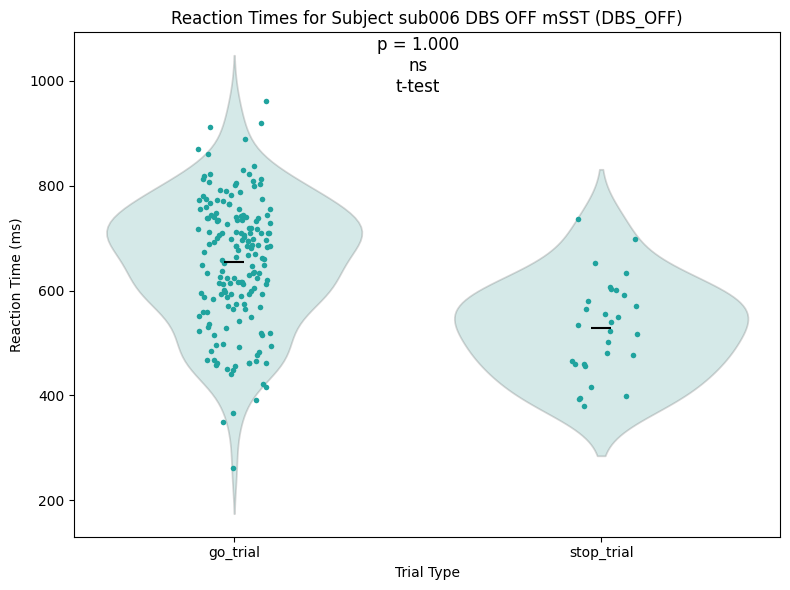

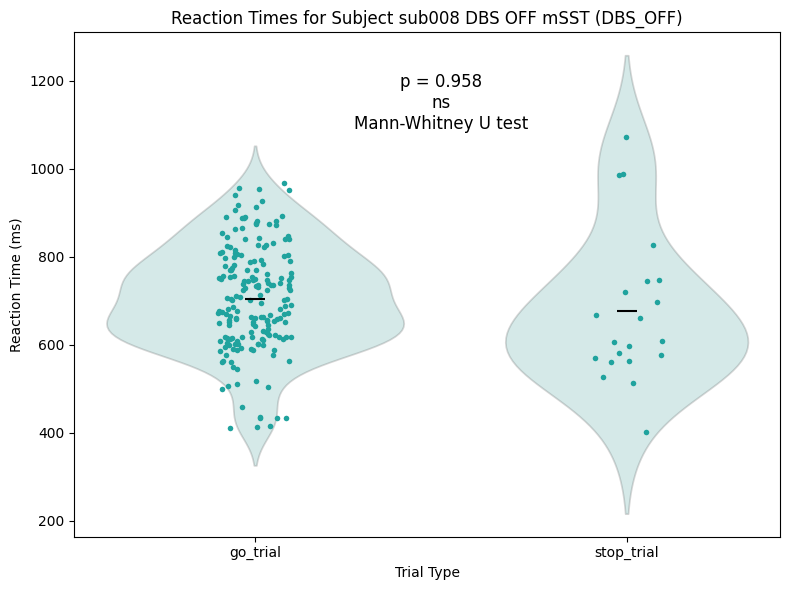

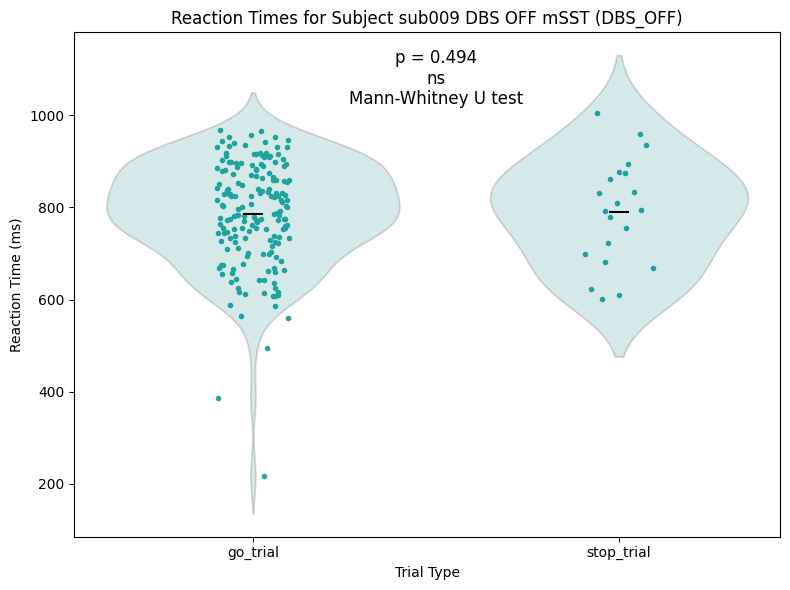

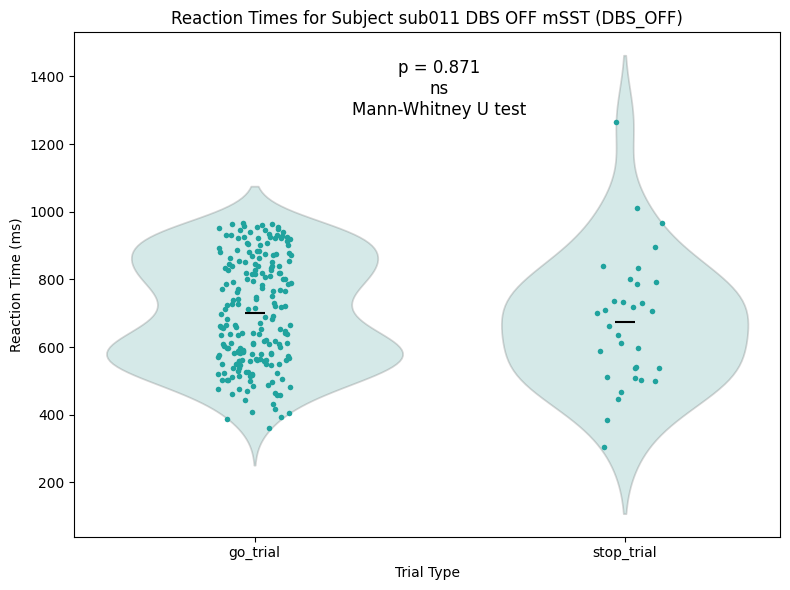

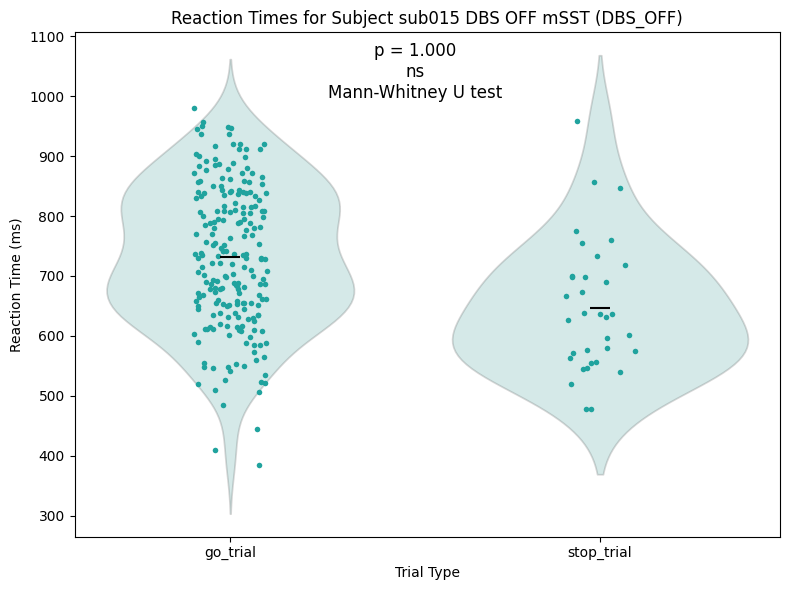

...

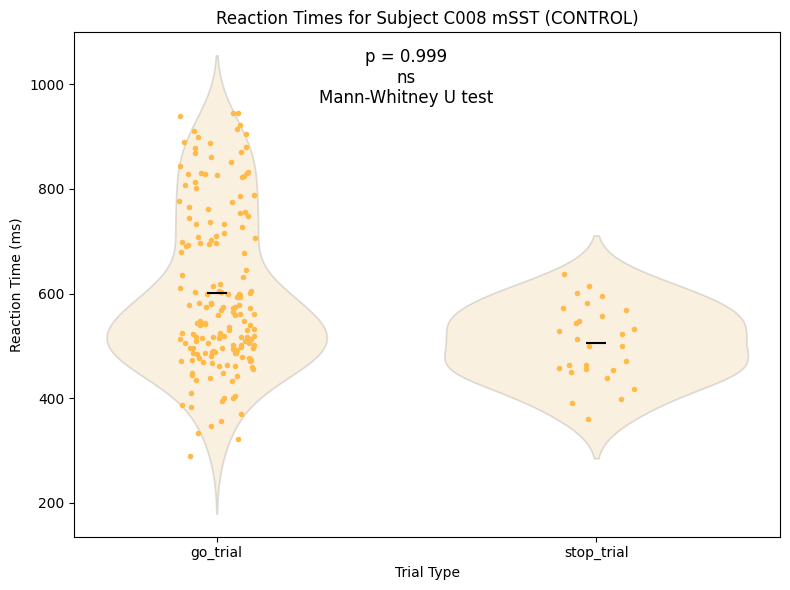

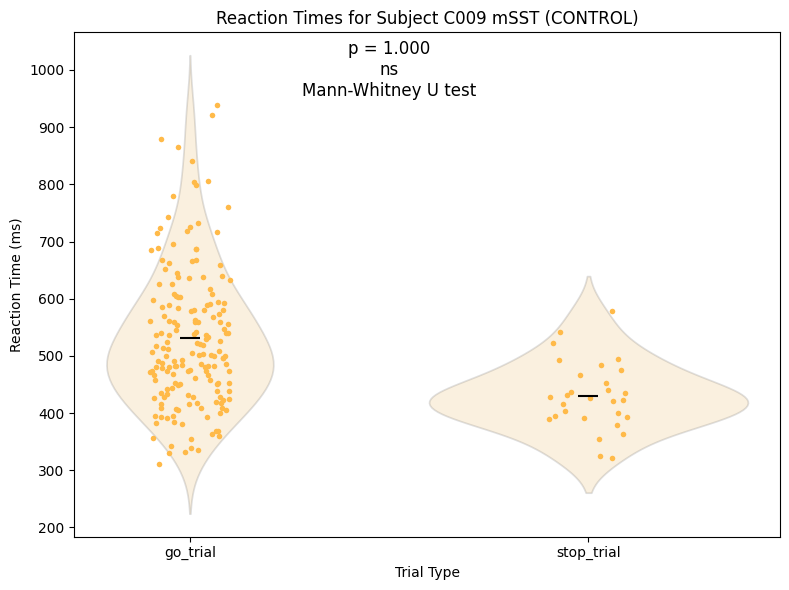

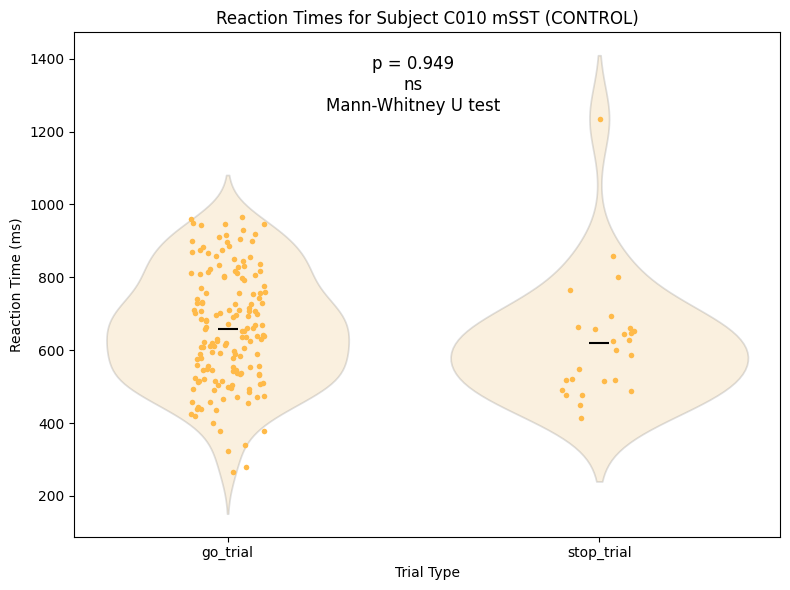

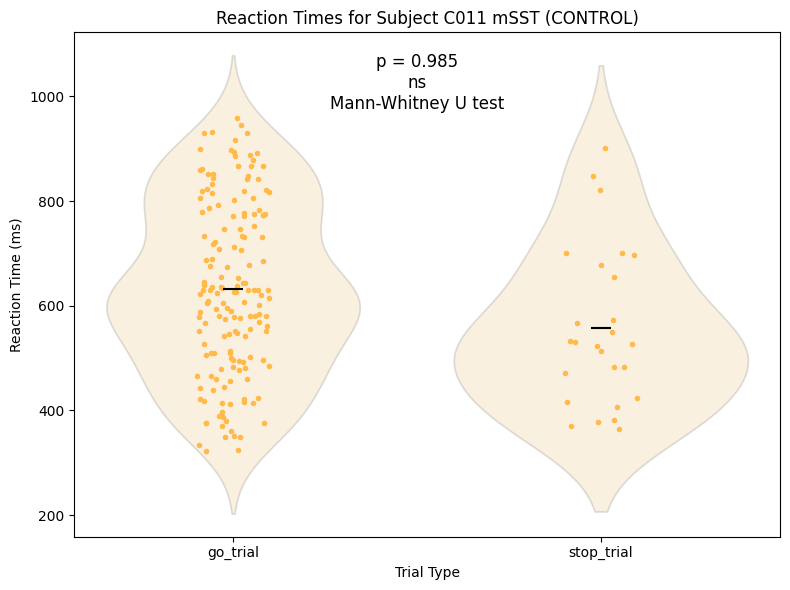

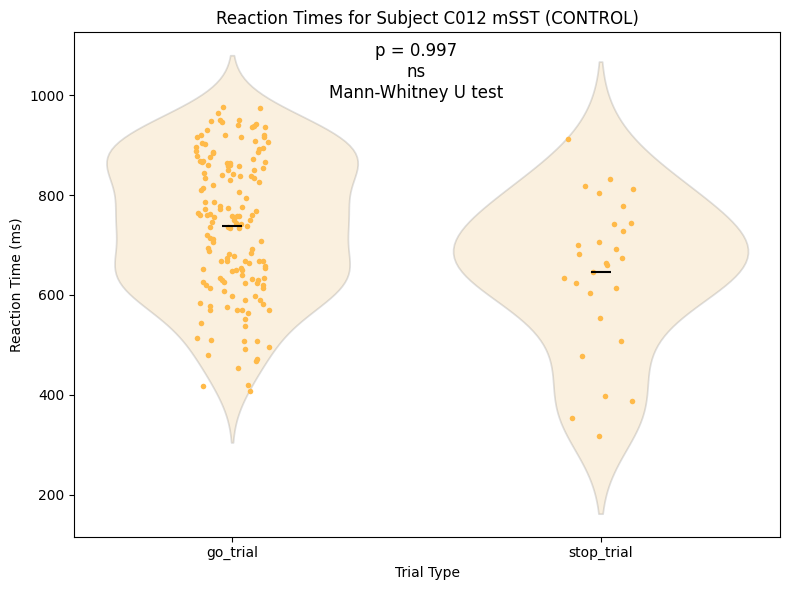

Excel file saved as 'p_values_independance_test.xlsx'.


In [10]:
# Define trial types to include only Go trials and Stop trials
trial_types = ['go_trial', 'stop_trial']
p_value_dict = {}
normal_go_count = 0
normal_stop_count = 0

# Loop through the filtered dictionaries (e.g., stats_OFF, stats_ON, etc.)
for condition, condition_stats in [('dbs_off', stats_OFF), 
                                   ('dbs_on', stats_ON), 
                                   ('control', stats_CONTROL), 
                                   ('preop', stats_PREOP)]:
    for subject_id, subject_data in condition_stats.items():
        # Gather data for the selected trial types into a DataFrame
        data = []
        for trial_type in trial_types:
            if f"{trial_type} RTs (ms)" in subject_data:  # Ensure the trial type key exists
                data.extend([(trial_type, val) for val in subject_data[f"{trial_type} RTs (ms)"]])

        df = pd.DataFrame(data, columns=['Trial Type', 'Reaction Time'])

        # Extract reaction times for statistical comparison
        go_data = df[df['Trial Type'] == 'go_trial']['Reaction Time']
        stop_data = df[df['Trial Type'] == 'stop_trial']['Reaction Time']

        # Test for normality:
        normal_go = scipy.stats.shapiro(go_data)[1] > 0.05 if len(go_data) >= 3 else False
        normal_go_count += 1 if normal_go else 0
        normal_stop = scipy.stats.shapiro(stop_data)[1] > 0.05 if len(stop_data) >= 3 else False
        normal_stop_count += 1 if normal_stop else 0

        # Perform Independent t-test if normality is met; otherwise, fallback to Mann-Whitney
        if len(go_data) >= 3 and len(stop_data) >= 3:
            if normal_go and normal_stop:
                stat, p_value = scipy.stats.ttest_ind(stop_data, go_data, equal_var=False, alternative = 'greater')  # Welch's t-test
                test = 't-test'
            else:
                stat, p_value = scipy.stats.mannwhitneyu(stop_data, go_data, alternative='greater')
                test = 'Mann-Whitney U test'
        else:
            p_value = None  # Not enough data for test

        p_value_dict[f"{subject_id}_{test}"] = p_value
        results_dict[subject_id]['independance test used'] = test
        results_dict[subject_id]['p-value independance'] = p_value

        # Initialize the plot
        plt.figure(figsize=(8, 6))

        # Plot violins for the single condition using the custom palette
        sns.violinplot(data=df, x='Trial Type', y='Reaction Time', 
                       inner=None, color=color_dict[condition], alpha=0.2)  # Use condition color

        # Overlay data points with a strip plot
        sns.stripplot(data=df, x='Trial Type', y='Reaction Time', 
                      jitter=True, color=color_dict[condition], marker='o', size=4)

        # Calculate and plot means manually for each trial type
        for i, trial_type in enumerate(trial_types):
            condition_data = df[df['Trial Type'] == trial_type]
            mean_value = condition_data['Reaction Time'].mean()
            plt.scatter(x=i, y=mean_value, color='black', marker="_", s=200, label='Mean' if i == 0 else "", zorder=5)

        # Annotate statistical results
        if p_value is not None:
            annotation = "*" if p_value <= 0.05 else "ns"
            max_val = df['Reaction Time'].max()
            plt.text(0.5, max_val + 10, f"p = {p_value:.3f}\n{annotation}\n{test}", 
                     ha='center', va='bottom', color='black', fontsize=12)

        # Customize plot
        plt.xlabel('Trial Type')
        plt.ylabel('Reaction Time (ms)')
        plt.title(f'Reaction Times for Subject {subject_id} ({condition.upper()})')
        plt.tight_layout()
        plt.savefig(join(behav_results_saving_path, f"test_independance_{subject_id}_{condition}.png"))
        plt.show()

# Convert dictionary to DataFrame
df_p_value_dict = pd.DataFrame(list(p_value_dict.items()), columns=['Subject_test', 'P-Value'])

# Save to Excel
df_p_value_dict.to_excel(join(behav_results_saving_path,'p_values_independance_test.xlsx'), index=False)

print("Excel file saved as 'p_values_independance_test.xlsx'.")


### Replication of tests used in Hervault et al., 2021 ###
"every single participant had a shorter mean RT in failed–STOP trials than in GO trials. This was the case in both the pressing (t(39) = 8.42, p < .001, d =1.35) and the swiping type (t(39) = 13.72, p < .001, d = 2.0)"
Statistical test used:
t(39) → A paired t-test with 40 participants (degrees of freedom = 39).

t-value:
Pressing: t = 8.42
Swiping: t = 13.72

p < .001 → Very strong evidence against the null hypothesis.

Cohen’s d (effect size):
Pressing: d = 1.35 (large effect)
Swiping: d = 2.0 (very large effect)


Paired t-test results: t-statistic(40) = -12.77427953119975, p-value = 5.318115502193627e-16
[ 49.84295083 108.11763579  40.76441482 144.69822402  96.52900865
 100.29205126  37.69166287  74.0184939   93.13955879  46.73675682
 124.85419713  89.64382166  27.54004772  75.32269308  -4.93829466
  26.30357379  97.96941508  84.52579162  84.61846652  40.94570891
  98.83059602 107.55390695  27.05538388  45.4808262   28.98825679
  34.85865184  53.60567232  97.41846785  76.92272156  66.9059463
  36.33286725  51.01096416  19.50727973  71.40967246  59.8646979
  59.69075346 122.37967591  77.73458548  29.84627326  50.87283082
  60.42732164]
Negative differences found at indices: [14], corresponding subjects: ['sub009 DBS OFF mSST']
Excluded subjects: ['sub009 DBS OFF mSST', 'sub009 DBS ON mSST']
Cohen's d = 2.00


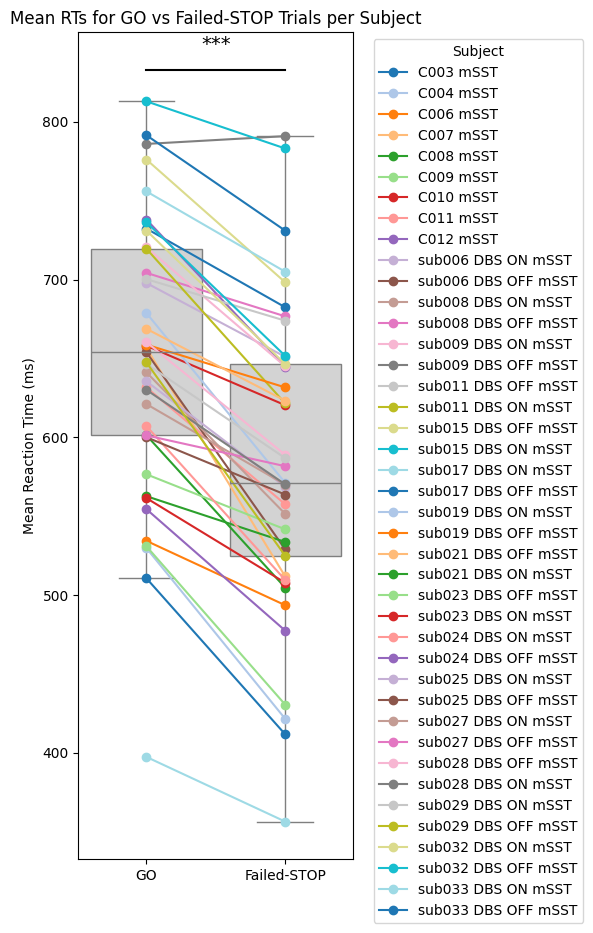

In [11]:
# paired t-test for Go and Stop trials accross all subjects
mean_RT_go = []
mean_RT_stop = []
subs = []
for sub in stats.keys():
    subs.append(sub)
    mean_RT_go.append(stats[sub]['go_trial mean RT (ms)'])
    mean_RT_stop.append(stats[sub]['stop_trial mean RT (ms)'])

# Perform the paired t-test
t_stat, p_value = scipy.stats.ttest_rel(mean_RT_stop, mean_RT_go, alternative='less')
print(f"Paired t-test results: t-statistic({len(subs)-1}) = {t_stat}, p-value = {p_value}")

# Convert to NumPy arrays if needed
go = np.array(mean_RT_go)
stop = np.array(mean_RT_stop)

# Calculate difference
diff = go - stop
print(diff)
# Look for negative values in diff and print the indexes
negative_indices = np.where(diff < 0)[0]
if len(negative_indices) > 0:
    print(f"Negative differences found at indices: {negative_indices}, corresponding subjects: {[subs[i] for i in negative_indices]}")
    excluded_subjects = [subs[i] for i in negative_indices]

# if another session is available for the excluded subjects, exclude these as well:
for excluded_sub in excluded_subjects:
    base_sub_id = excluded_sub.split(' ')[0]  # get the base subject ID without condition
    for sub in subs:
        if sub.startswith(base_sub_id) and sub not in excluded_subjects:
            excluded_subjects.append(sub)

print(f"Excluded subjects: {excluded_subjects}")
mean_diff = np.mean(diff)
sd_diff = np.std(diff, ddof=1)

# Cohen's d
cohens_d = mean_diff / sd_diff
print(f"Cohen's d = {cohens_d:.2f}")

# Determine significance level
if p_value < 0.001:
    stars = '***'
elif p_value < 0.01:
    stars = '**'
elif p_value < 0.05:
    stars = '*'
else:
    stars = 'ns'  # not significant

# Prepare long-format DataFrame
df_long = pd.DataFrame({
    'Subject': subs * 2,
    'Trial Type': ['GO'] * len(subs) + ['Failed-STOP'] * len(subs),
    'Mean RT (ms)': mean_RT_go + mean_RT_stop
})

plt.figure(figsize=(6, 10))

# First: draw the boxplot for GO and STOP trials
sns.boxplot(
    data=df_long,
    x='Trial Type',
    y='Mean RT (ms)',
    color='lightgray',
    fliersize=0  # hide individual outlier dots from the boxplot
)

# Then: overlay individual subject lines
palette = sns.color_palette('tab20', n_colors=len(subs))
subject_colors = dict(zip(subs, palette))

for subject in subs:
    go_rt = df_long[(df_long['Subject'] == subject) & (df_long['Trial Type'] == 'GO')]['Mean RT (ms)'].values[0]
    stop_rt = df_long[(df_long['Subject'] == subject) & (df_long['Trial Type'] == 'Failed-STOP')]['Mean RT (ms)'].values[0]
    plt.plot(['GO', 'Failed-STOP'], [go_rt, stop_rt], marker='o', color=subject_colors[subject], label=subject)

# Add the significance line and stars
y_max = df_long['Mean RT (ms)'].max()
line_height = y_max + 20
text_height = y_max + 30
plt.plot([0, 1], [line_height, line_height], color='black', linewidth=1.5)
plt.text(0.5, text_height, stars, ha='center', va='bottom', fontsize=14)
plt.legend(title='Subject', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Mean RTs for GO vs Failed-STOP Trials per Subject')
plt.ylabel('Mean Reaction Time (ms)')
plt.xlabel('')
plt.tight_layout()
plt.show()

Overall, participants had a shorter mean RT in unsuccessful STOP trials than in GO trials (t(37) = -12.019079826978508, p-value = 1.216029920189116e-14, d = 1.95). At the individual level, this didn't hold true for 1 subject (sub009 in DBS OFF) who was therefore removed from subsequent analysis.

## 3.b. test: (b) If (u)GS RT with small SSD > (u)GS RT with long SSD, the independence assumption is violated ##


C003 mSST


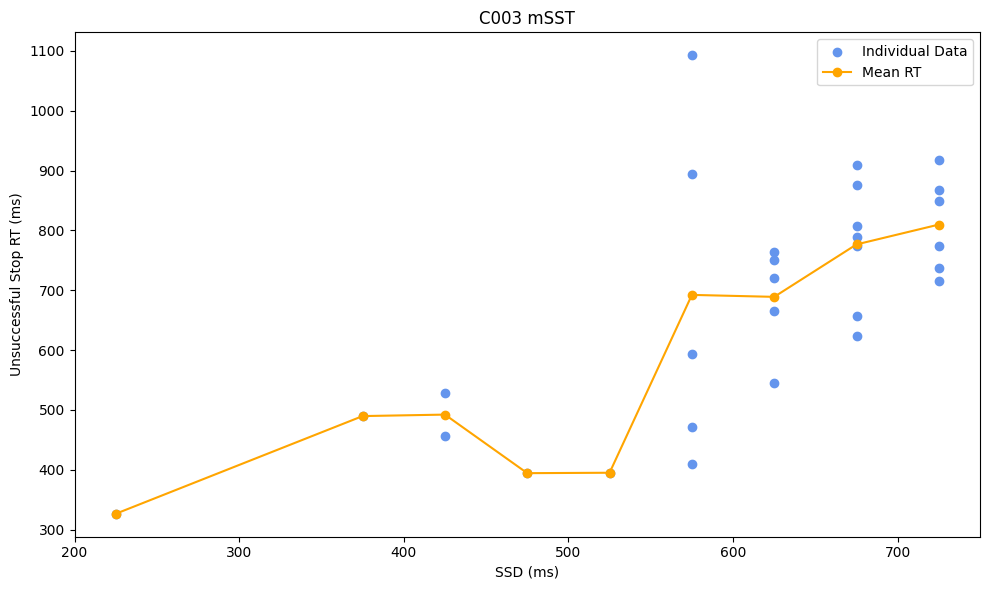

Data appears normally distributed (p = 0.19979801774024963 )
Data appears normally distributed (p = 0.7447578310966492 )
Mean RT (Small SSD): 593.5723750044417
Mean RT (Long SSD): 791.9256615434558
T-test p-value: 0.9984621583241703


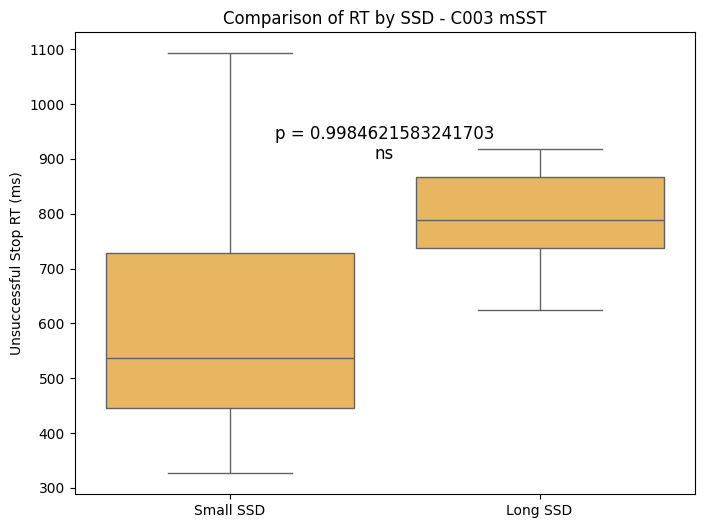

C004 mSST


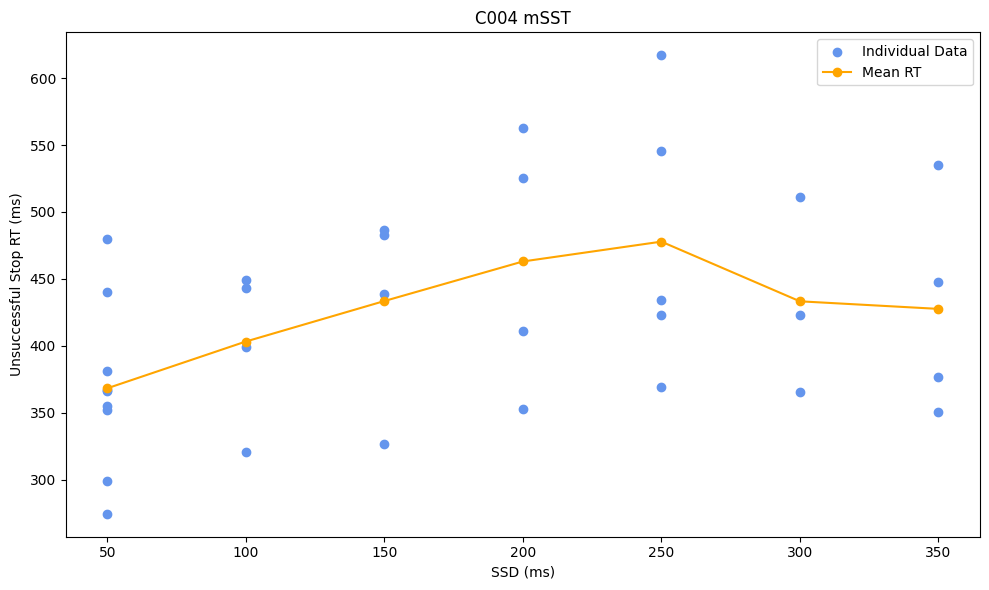

Data appears normally distributed (p = 0.3867240250110626 )
Data appears normally distributed (p = 0.15561923384666443 )
Mean RT (Small SSD): 391.86568235677174
Mean RT (Long SSD): 453.2370750057453
T-test p-value: 0.9655523969967634


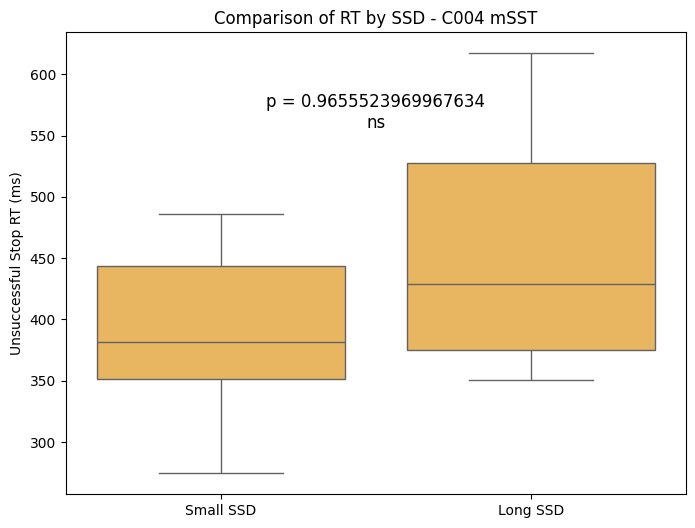

C006 mSST


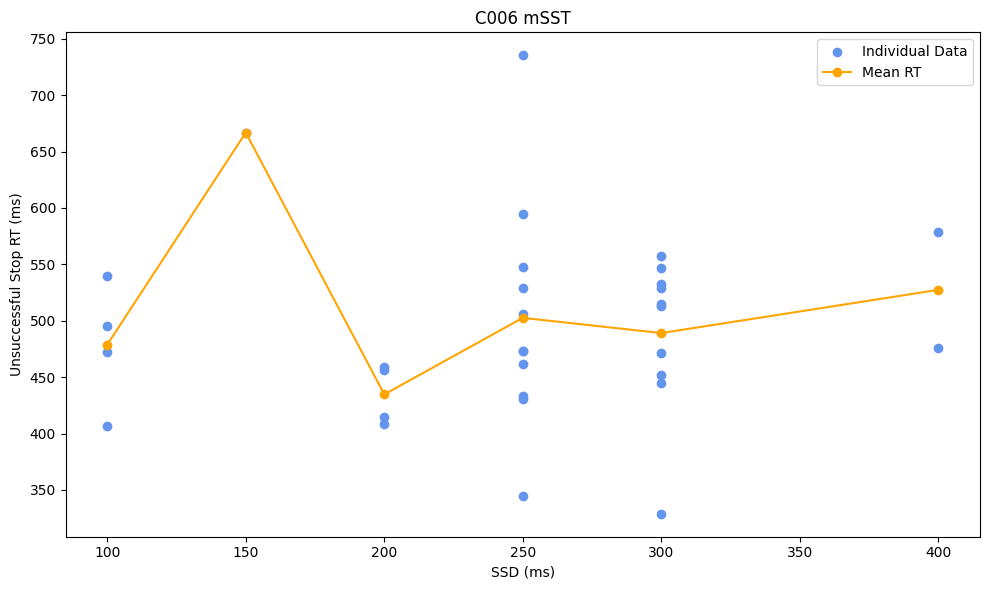

Data appears normally distributed (p = 0.0738212987780571 )
Data appears normally distributed (p = 0.1381334364414215 )
Mean RT (Small SSD): 492.4506649840623
Mean RT (Long SSD): 495.4668332745011
T-test p-value: 0.7986717773486776


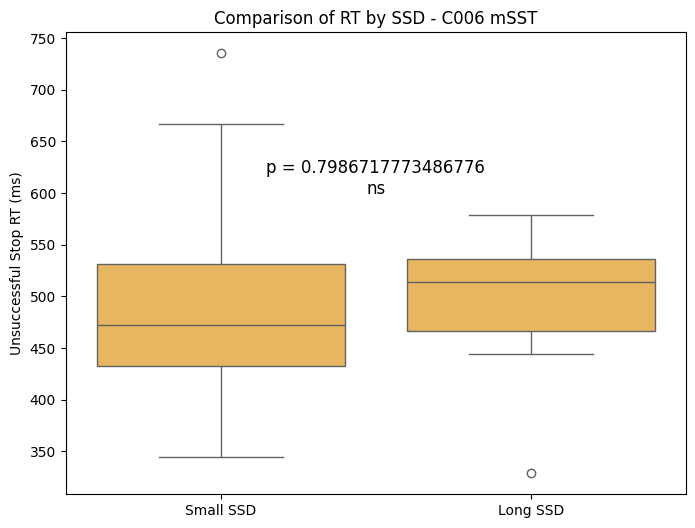

C007 mSST


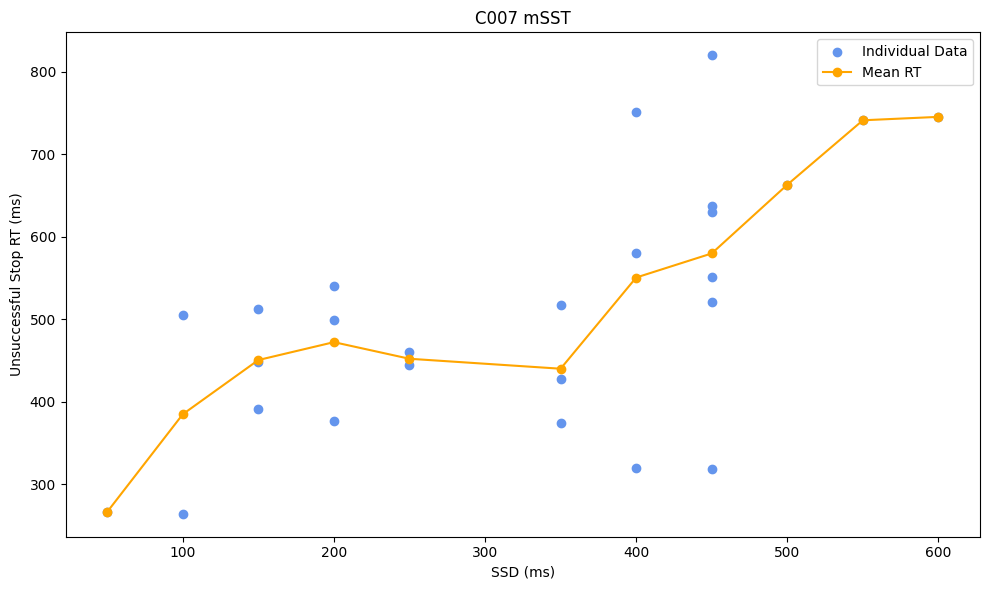

Data appears normally distributed (p = 0.13635587692260742 )
Data appears normally distributed (p = 0.20243559777736664 )
Mean RT (Small SSD): 430.6264644089554
Mean RT (Long SSD): 606.7641749978065
T-test p-value: 0.9988946068137659


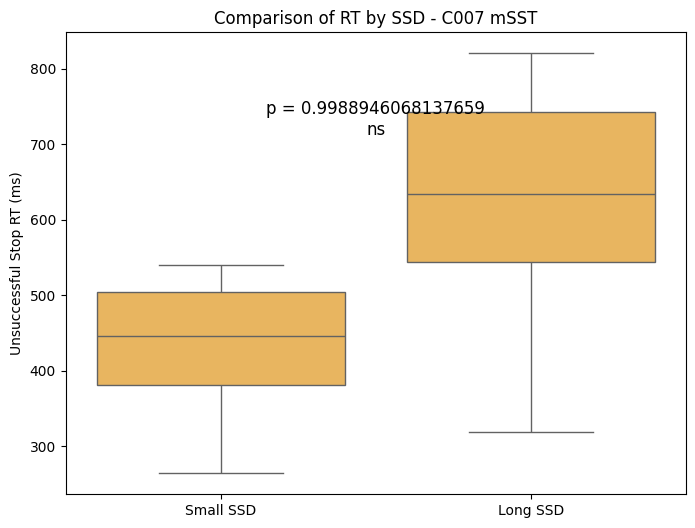

C008 mSST


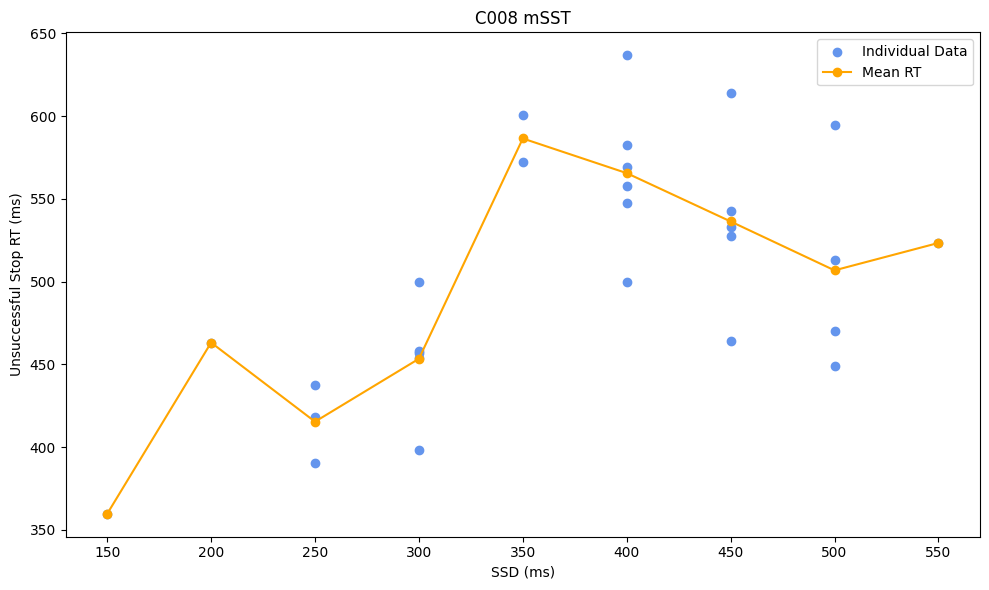

Data appears normally distributed (p = 0.5981351733207703 )
Data appears normally distributed (p = 0.573819100856781 )
Mean RT (Small SSD): 494.5168888920711
Mean RT (Long SSD): 523.1857299804688
T-test p-value: 0.8486935015706417


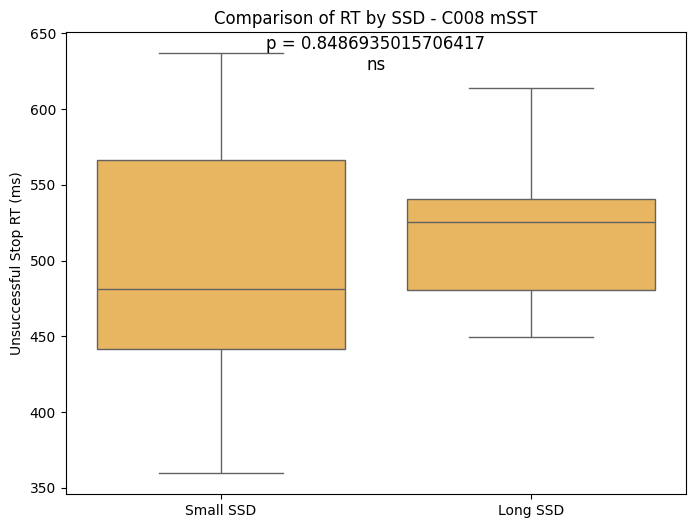

C009 mSST


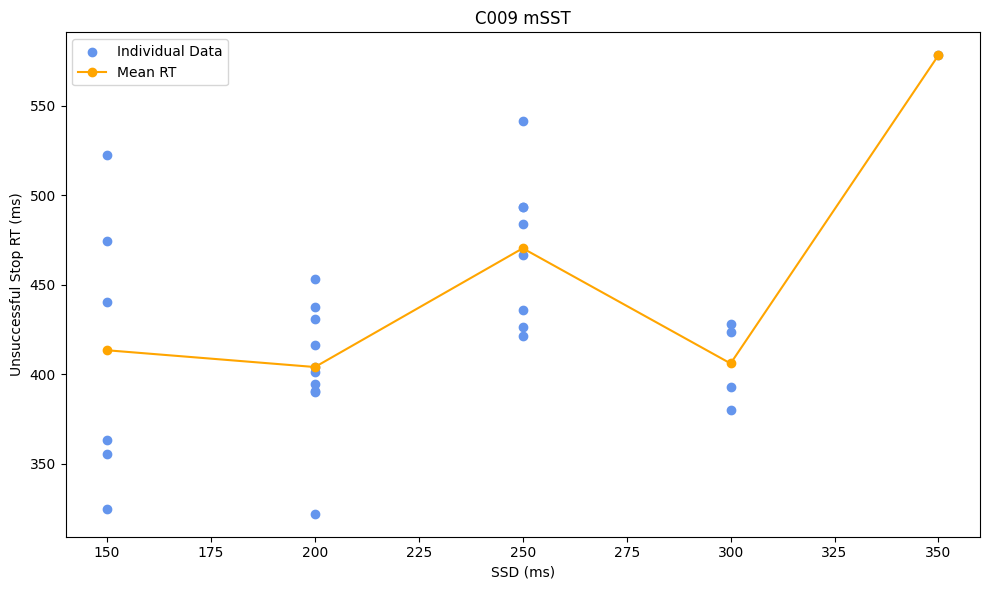

Data appears normally distributed (p = 0.9163967370986938 )
Data appears normally distributed (p = 0.4228549301624298 )
Mean RT (Small SSD): 407.5879752635956
Mean RT (Long SSD): 458.91497685359076
T-test p-value: 0.9832843781198427


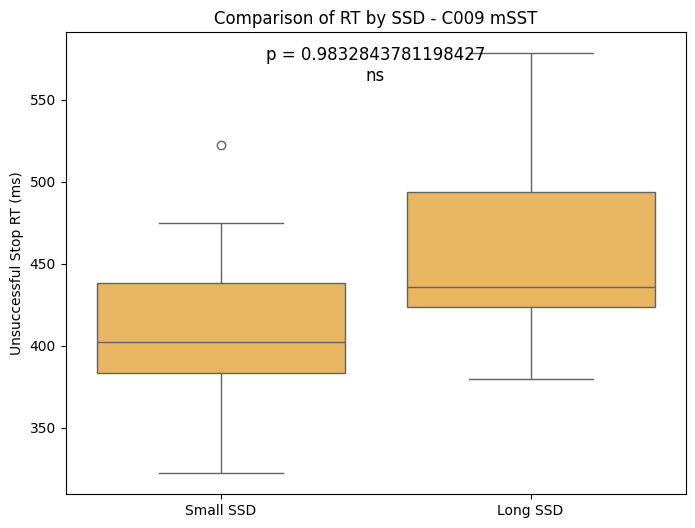

C010 mSST


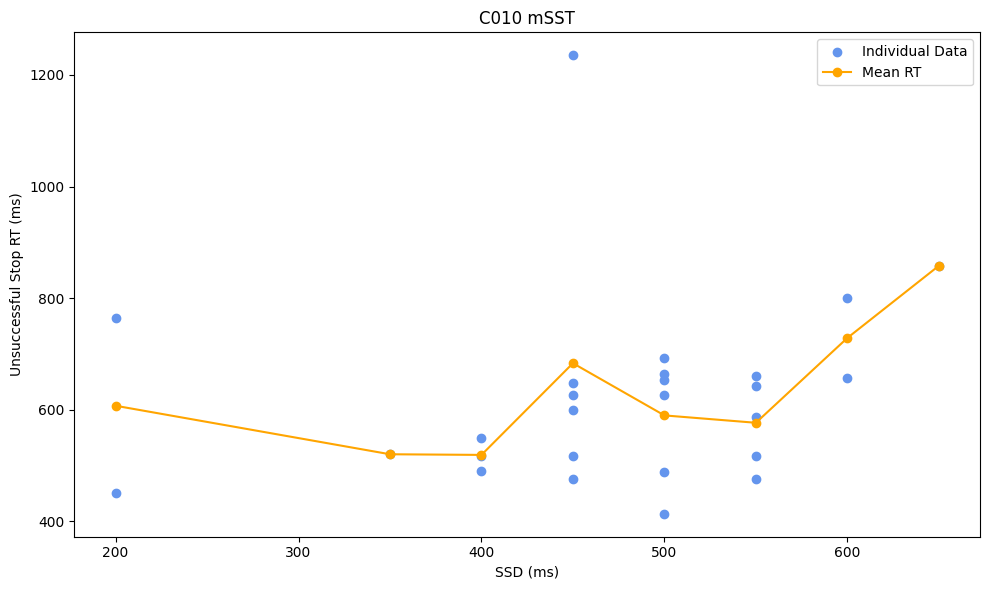

Data does NOT appear normal (p = 0.0002883578999899328 )
Data appears normally distributed (p = 0.6747182607650757 )
Mean RT (Small SSD): 607.3077445746296
Mean RT (Long SSD): 649.8459873255342
T-test p-value: 0.8695844201565026


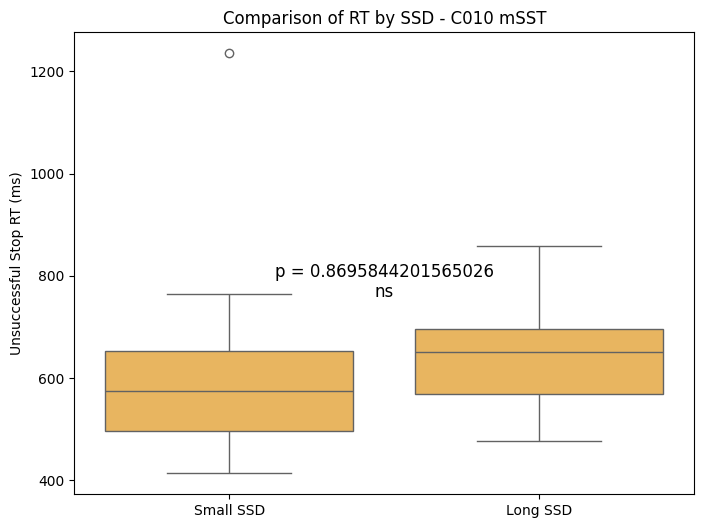

C011 mSST


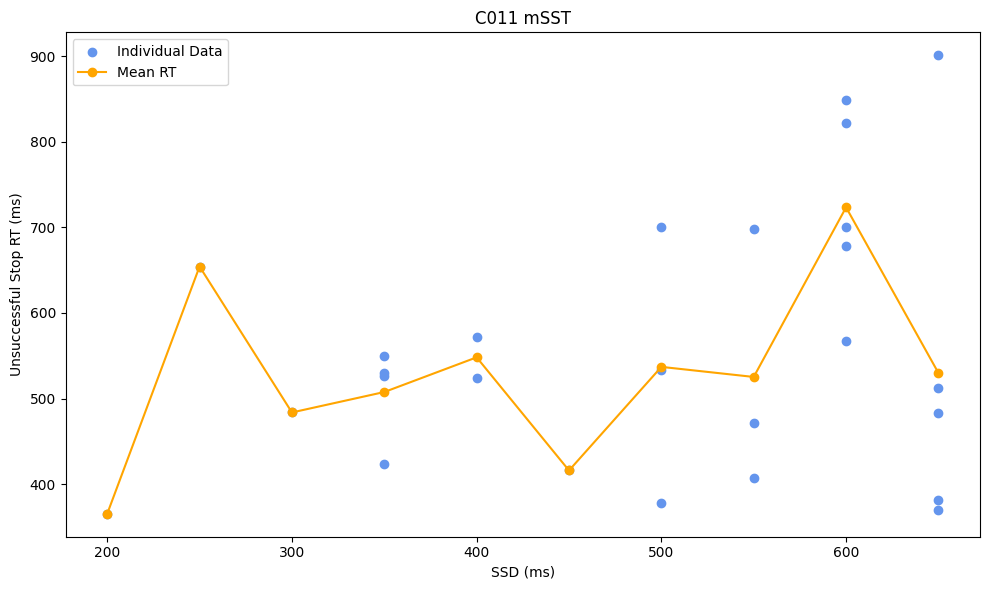

Data appears normally distributed (p = 0.5848131775856018 )
Data appears normally distributed (p = 0.29702138900756836 )
Mean RT (Small SSD): 512.0694847920767
Mean RT (Long SSD): 603.1805076994575
T-test p-value: 0.8474695889892234


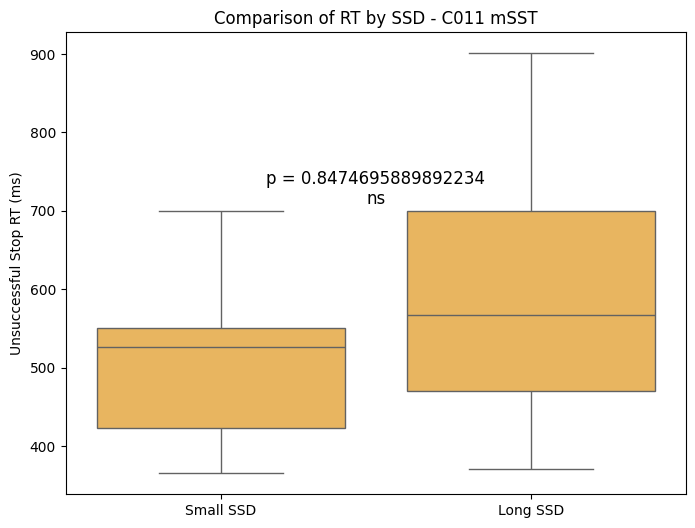

C012 mSST


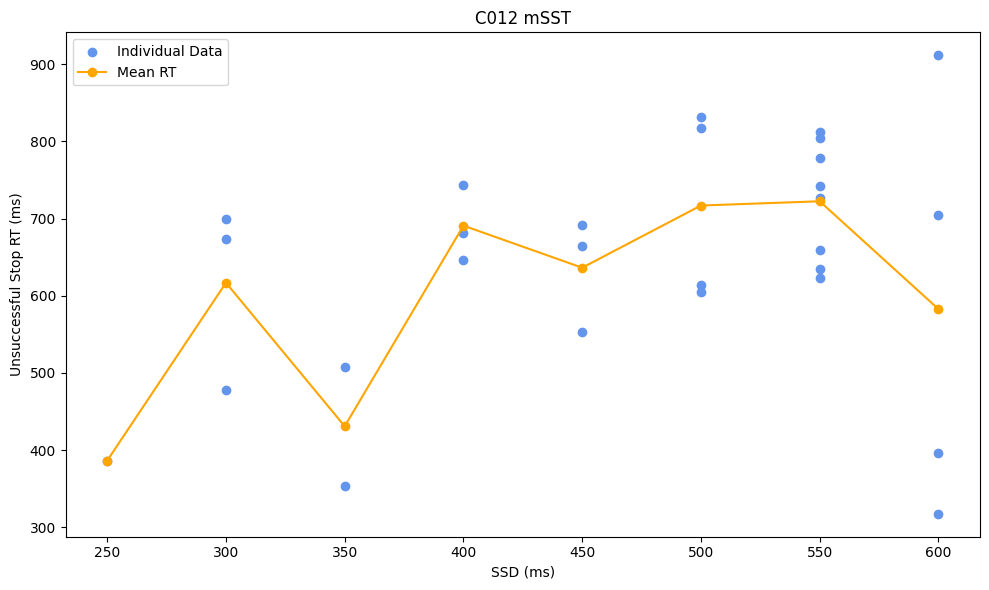

Data appears normally distributed (p = 0.5526871085166931 )
Data appears normally distributed (p = 0.16235992312431335 )
Mean RT (Small SSD): 621.7192187498313
Mean RT (Long SSD): 675.7907666666748
T-test p-value: 0.8817554192700583


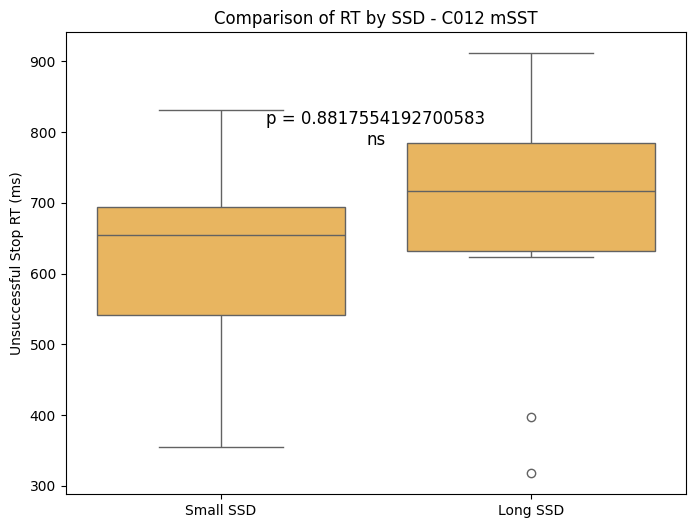

sub006 DBS ON mSST


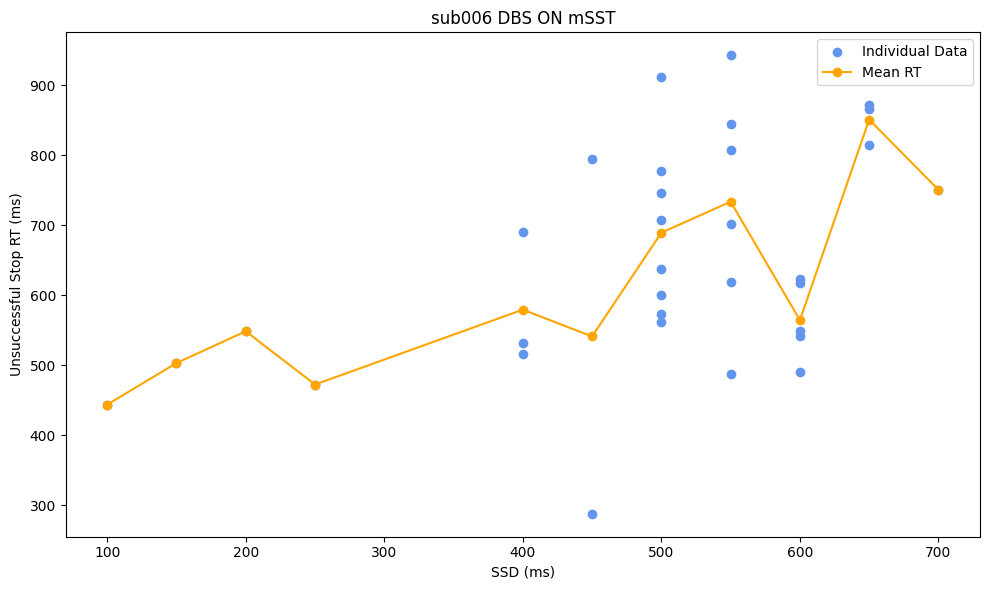

Data appears normally distributed (p = 0.9797029495239258 )
Data appears normally distributed (p = 0.2741410732269287 )
Mean RT (Small SSD): 606.1620175948037
Mean RT (Long SSD): 701.9816000014544
T-test p-value: 0.9553708813525691


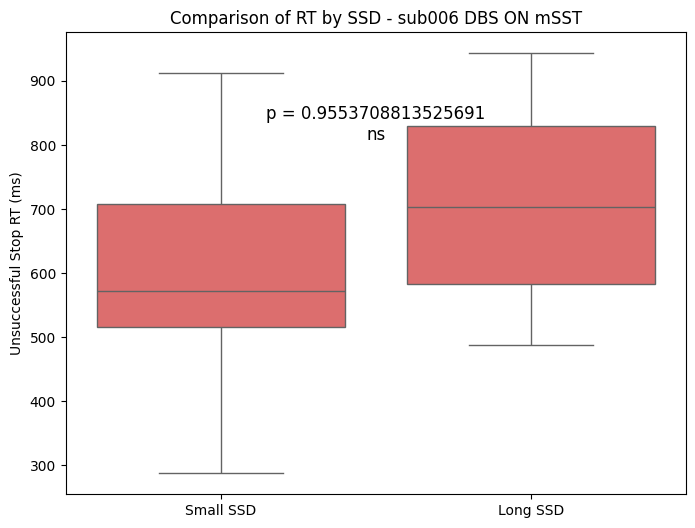

sub006 DBS OFF mSST


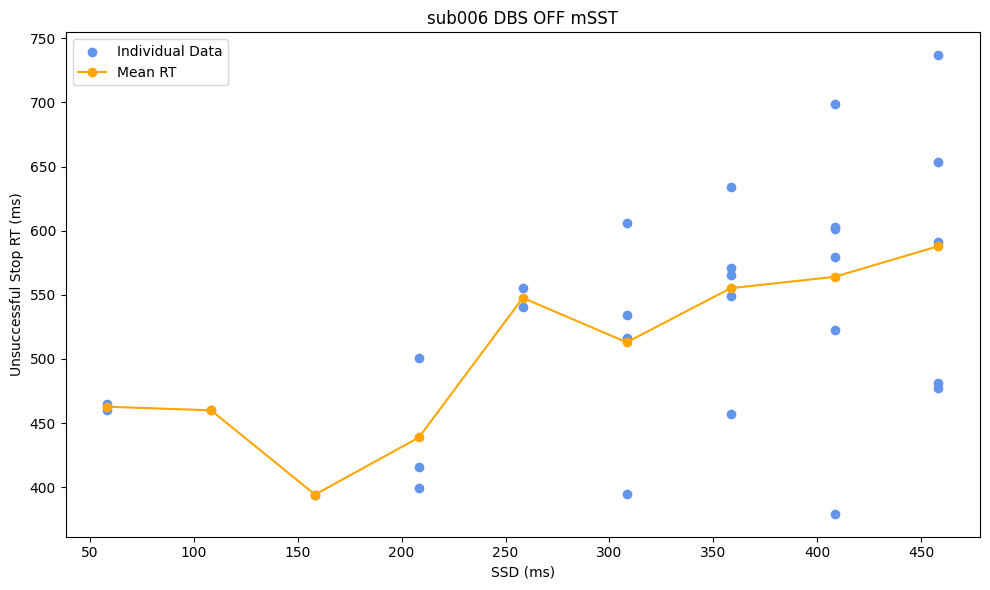

Data appears normally distributed (p = 0.40273430943489075 )
Data appears normally distributed (p = 0.9258810877799988 )
Mean RT (Small SSD): 501.05162222138864
Mean RT (Long SSD): 574.8969454487616
T-test p-value: 0.9795761650143571


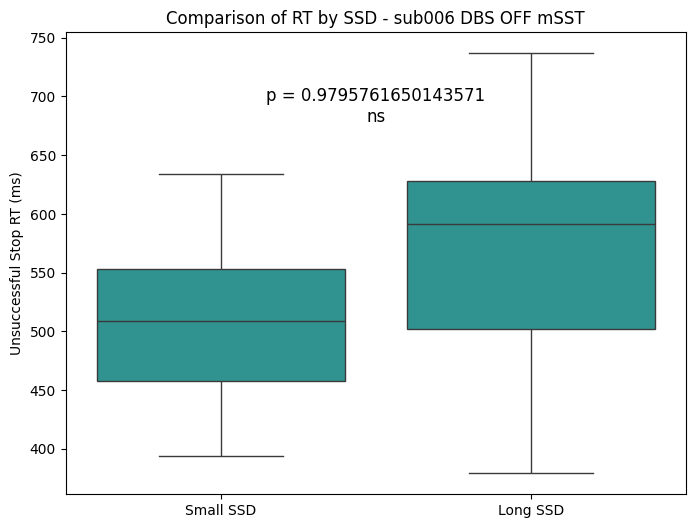

sub008 DBS ON mSST


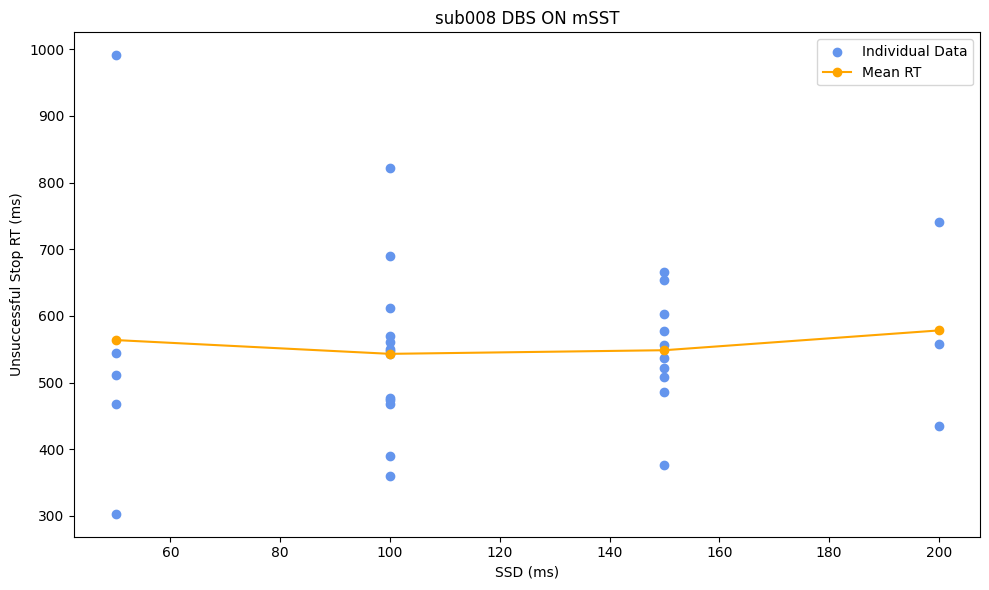

Data does NOT appear normal (p = 0.038152165710926056 )
Data appears normally distributed (p = 0.9993111491203308 )
Mean RT (Small SSD): 548.7807499400029
Mean RT (Long SSD): 555.328423049874
T-test p-value: 0.7455426753933077


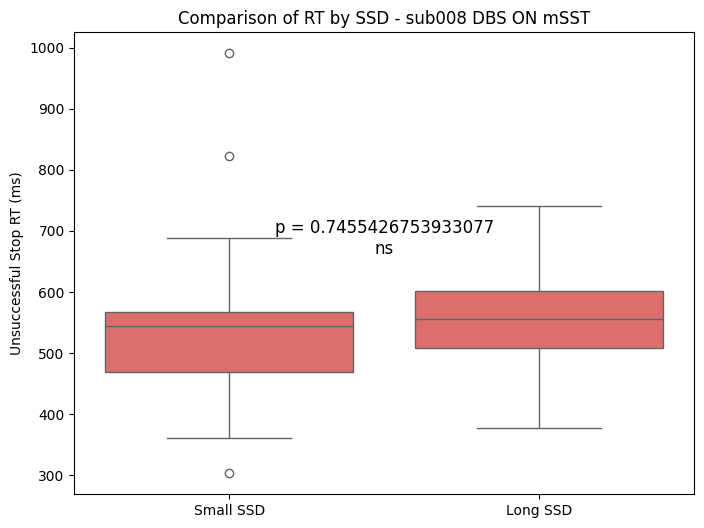

sub008 DBS OFF mSST


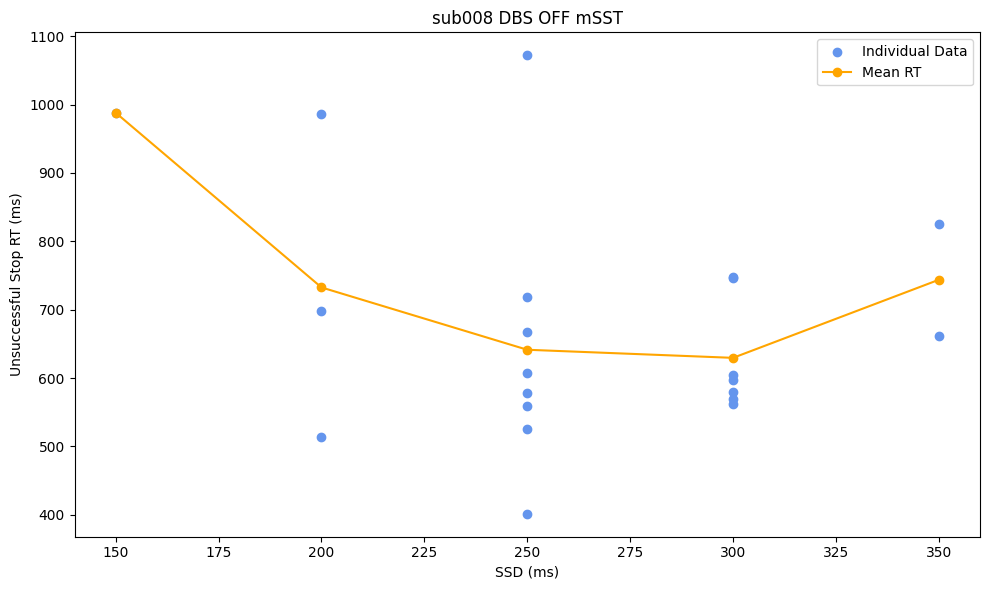

Data appears normally distributed (p = 0.14939525723457336 )
Data appears normally distributed (p = 0.10694950819015503 )
Mean RT (Small SSD): 693.0659916667992
Mean RT (Long SSD): 654.9222444445048
T-test p-value: 0.5705078519955201


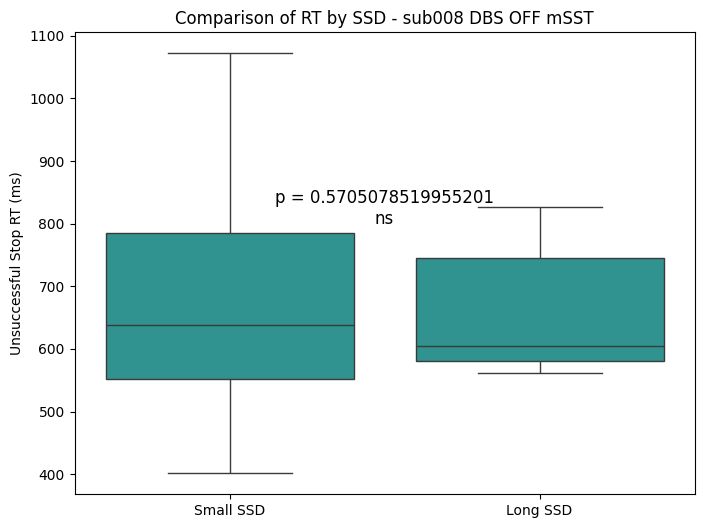

sub009 DBS ON mSST


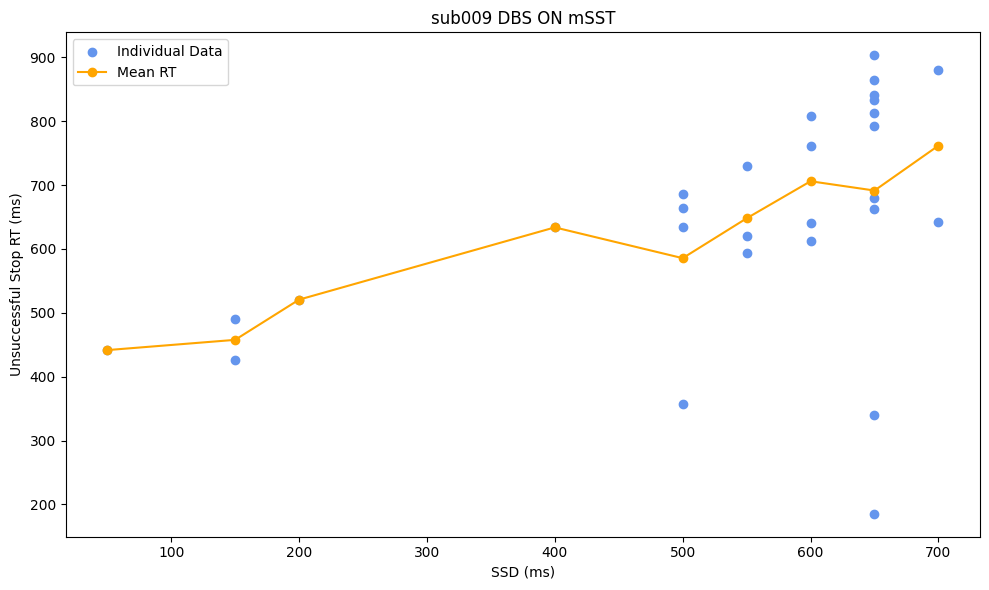

Data appears normally distributed (p = 0.7381322383880615 )
Data does NOT appear normal (p = 0.008755805902183056 )
Mean RT (Small SSD): 601.4003999807755
Mean RT (Long SSD): 703.2262916715505
T-test p-value: 0.9892185308626813


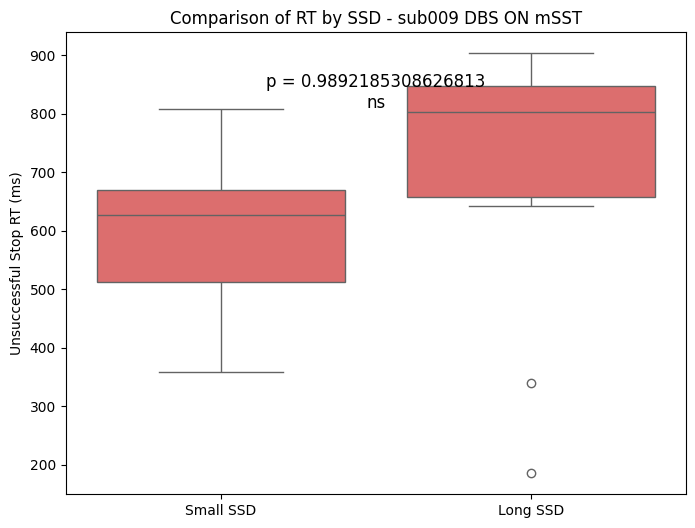

sub009 DBS OFF mSST


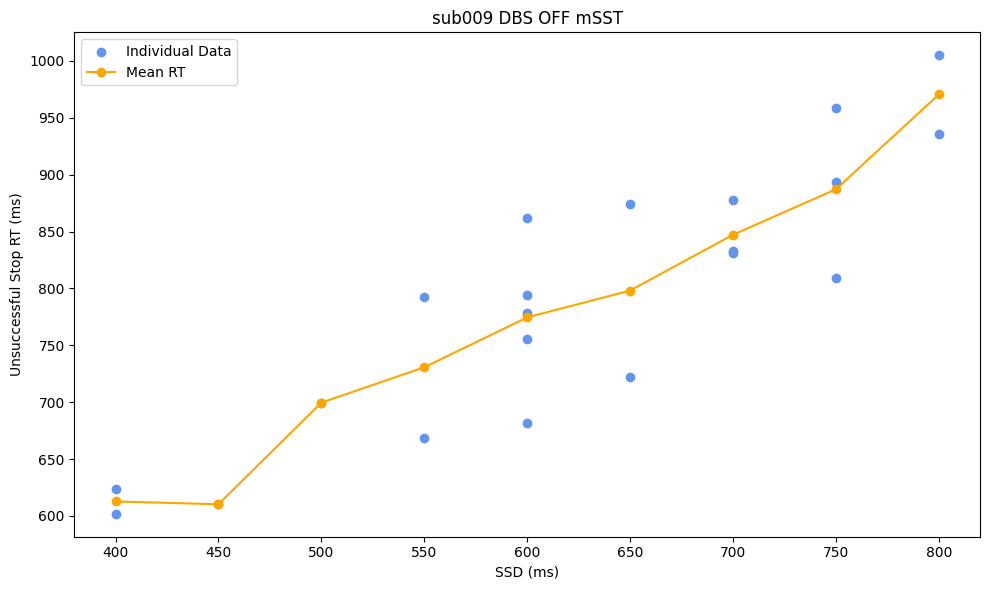

Data appears normally distributed (p = 0.5092883706092834 )
Data appears normally distributed (p = 0.9788644909858704 )
Mean RT (Small SSD): 715.3942818033763
Mean RT (Long SSD): 874.0414200001396
T-test p-value: 0.9995883634816353


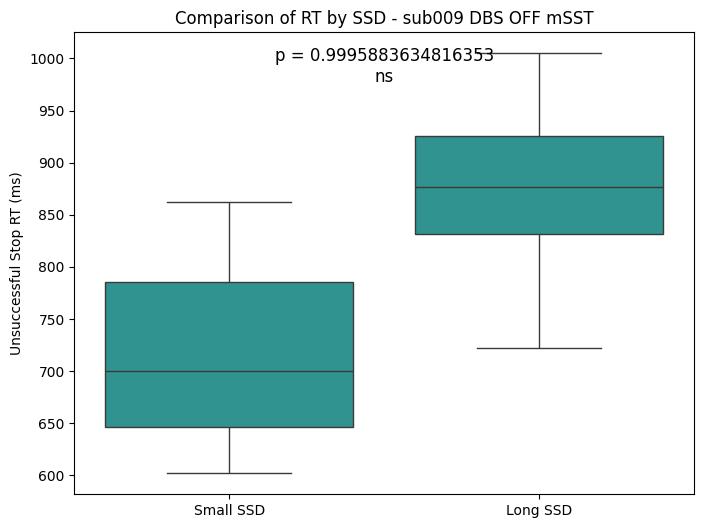

sub011 DBS OFF mSST


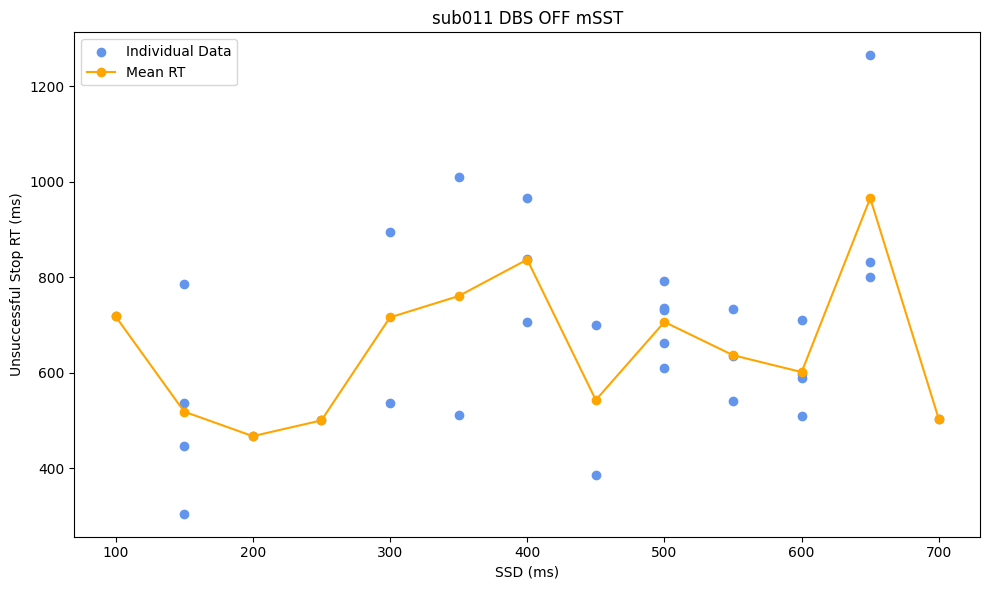

Data appears normally distributed (p = 0.553215742111206 )
Data does NOT appear normal (p = 0.004261152818799019 )
Mean RT (Small SSD): 644.6616750035901
Mean RT (Long SSD): 703.265018753882
T-test p-value: 0.8317408628039198


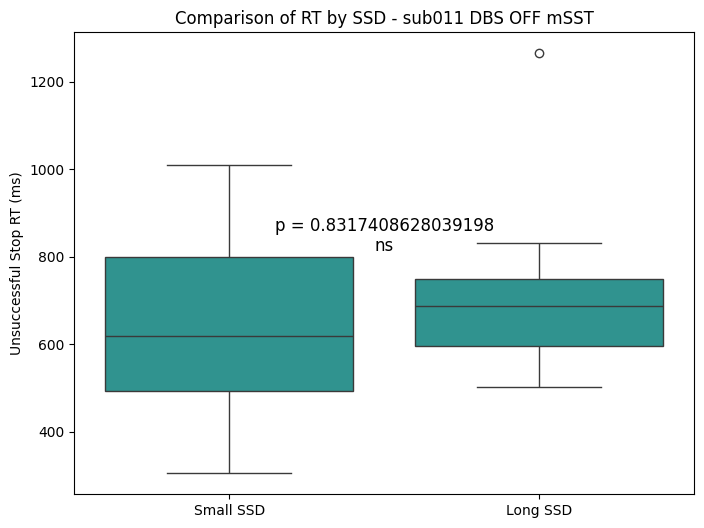

sub011 DBS ON mSST


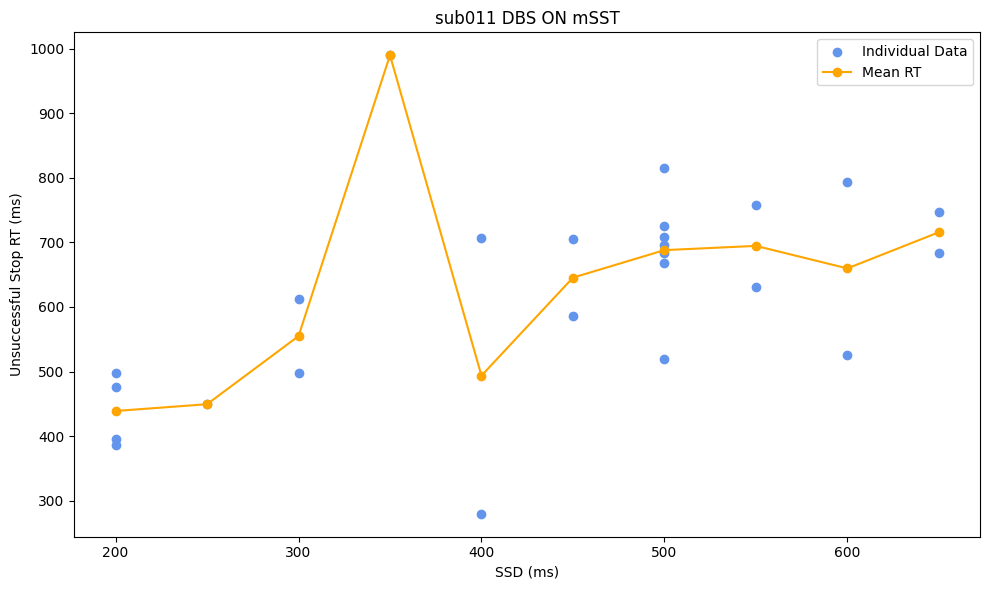

Data appears normally distributed (p = 0.7531858682632446 )
Data appears normally distributed (p = 0.5618695616722107 )
Mean RT (Small SSD): 599.9362263093261
Mean RT (Long SSD): 690.0175333333513
T-test p-value: 0.9394240542066626


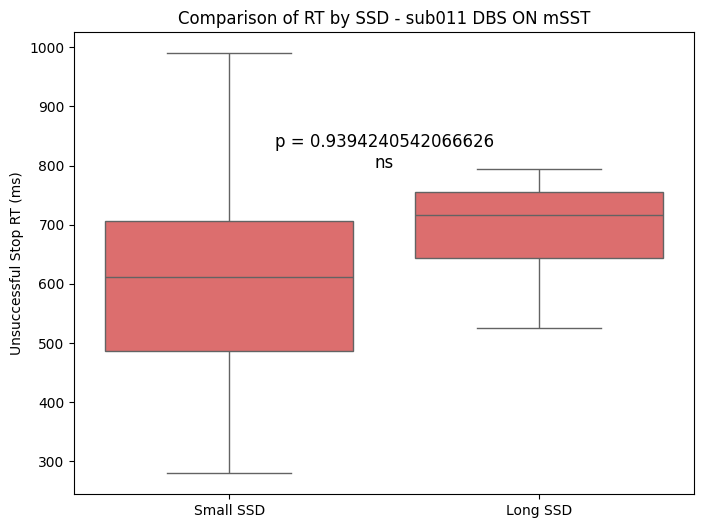

sub015 DBS OFF mSST


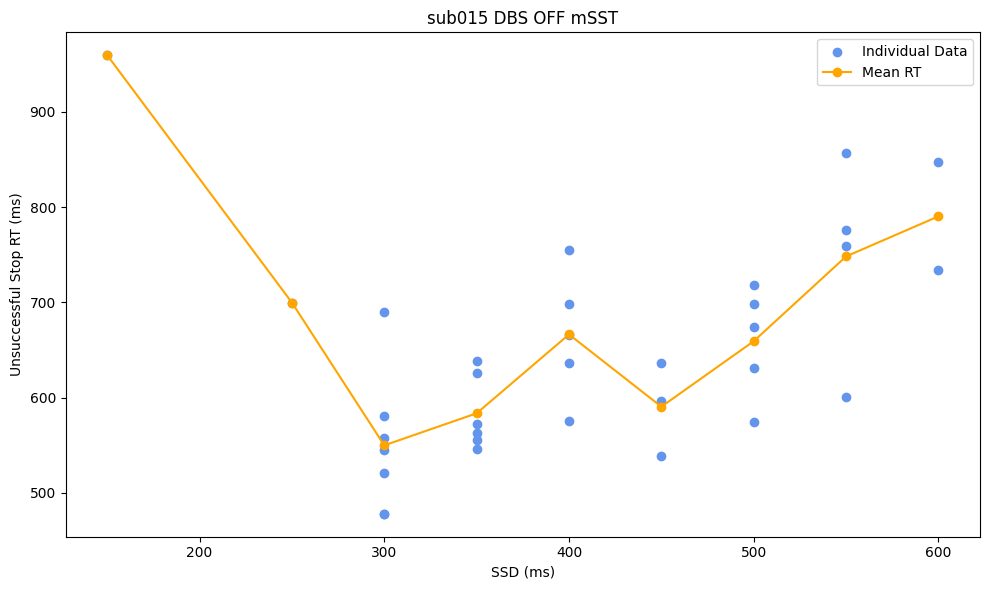

Data does NOT appear normal (p = 0.0126520786434412 )
Data appears normally distributed (p = 0.7466606497764587 )
Mean RT (Small SSD): 617.0393750013318
Mean RT (Long SSD): 688.6456214456952
T-test p-value: 0.985630359037418


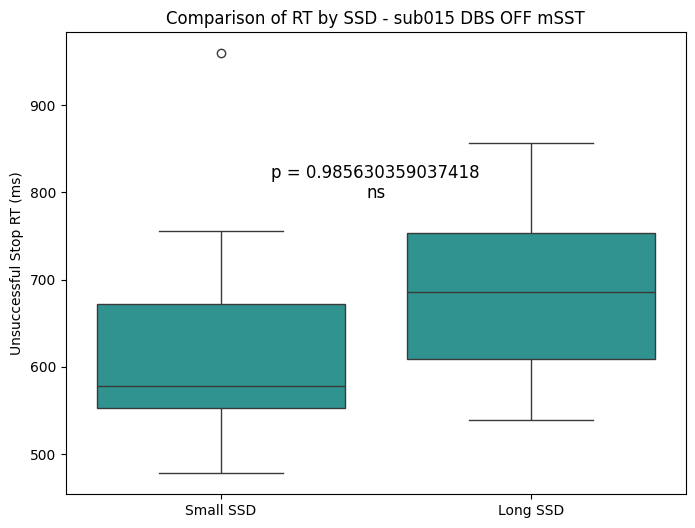

sub015 DBS ON mSST


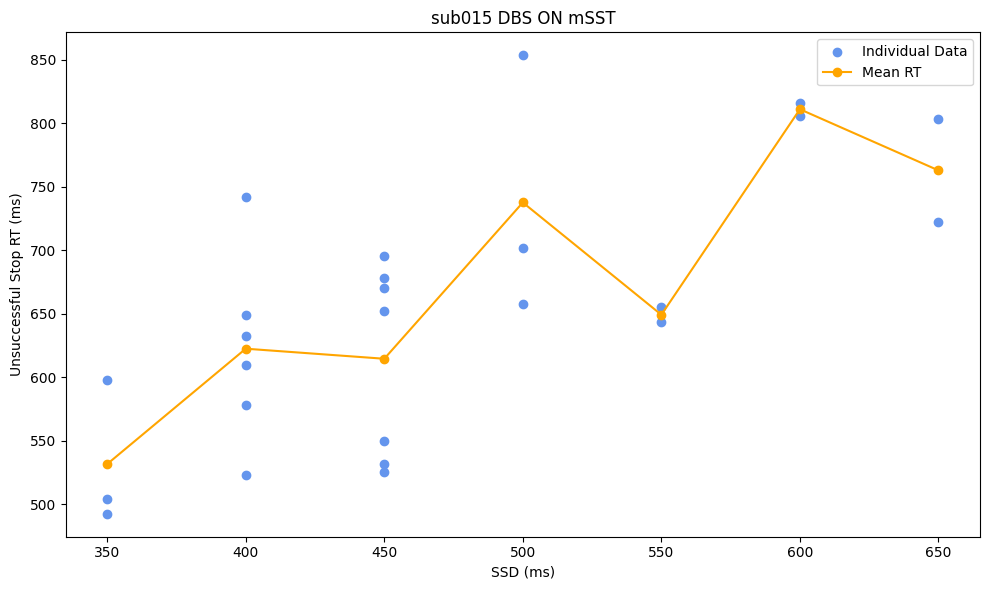

Data appears normally distributed (p = 0.5478806495666504 )
Data appears normally distributed (p = 0.18335504829883575 )
Mean RT (Small SSD): 602.0895687470329
Mean RT (Long SSD): 739.8979222117406
T-test p-value: 0.9993097146869618


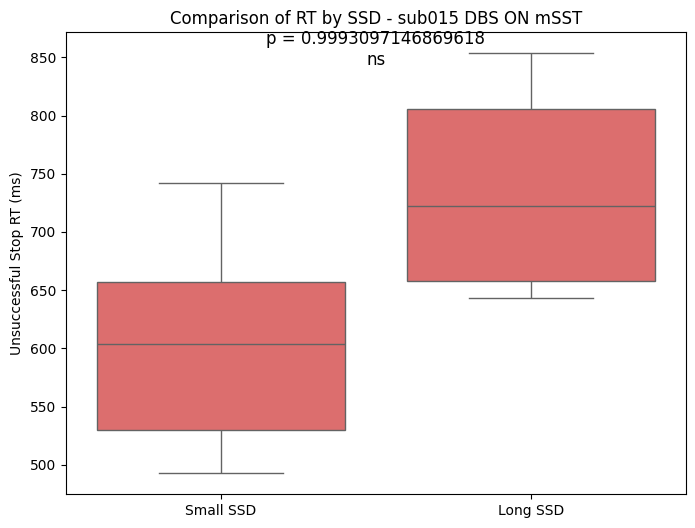

sub017 DBS ON mSST


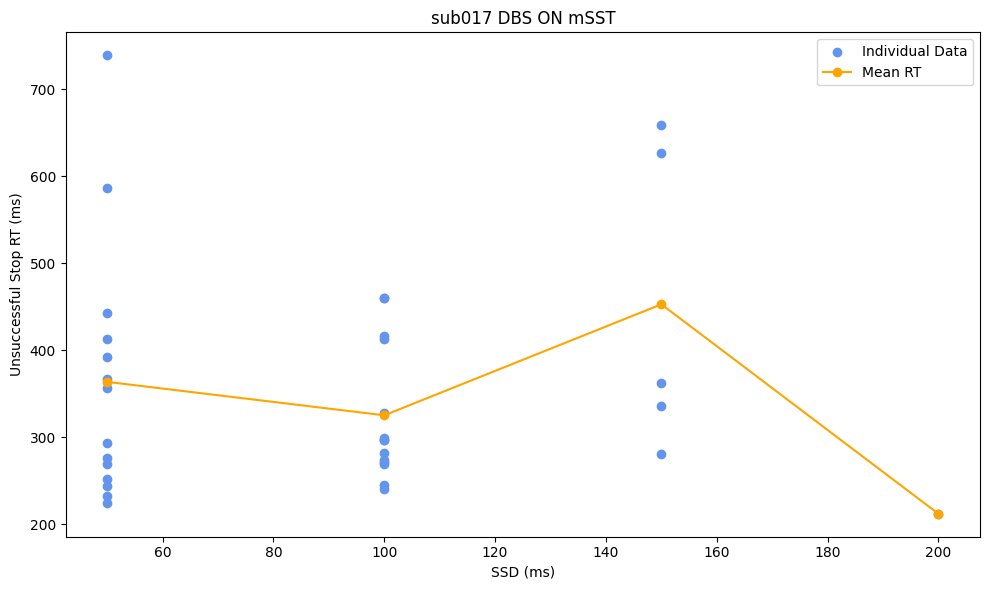

Data does NOT appear normal (p = 0.0002913798962254077 )
Data appears normally distributed (p = 0.21615807712078094 )
Mean RT (Small SSD): 344.3650785567505
Mean RT (Long SSD): 412.61911667728174
T-test p-value: 0.7670309553693053


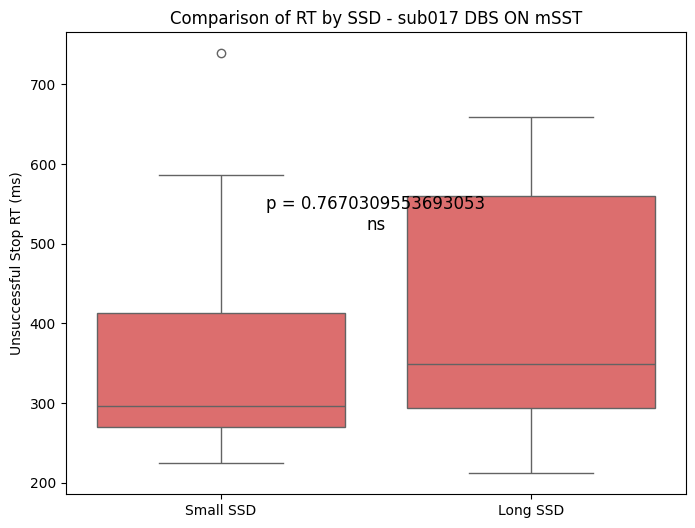

sub017 DBS OFF mSST


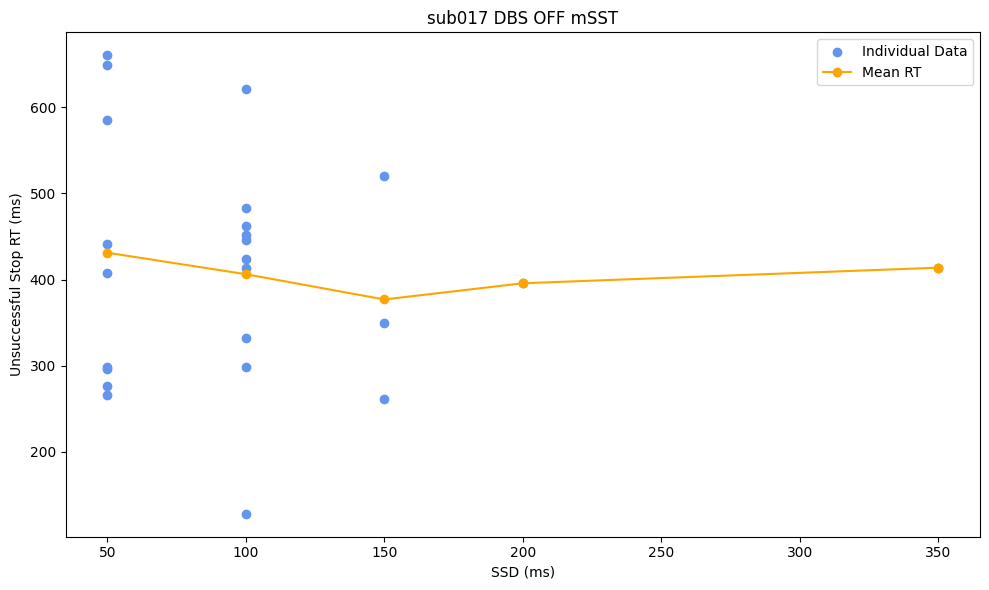

Data appears normally distributed (p = 0.48106876015663147 )
Data appears normally distributed (p = 0.9595522284507751 )
Mean RT (Small SSD): 418.02845260520513
Mean RT (Long SSD): 388.04637999273837
T-test p-value: 0.2904197252023339


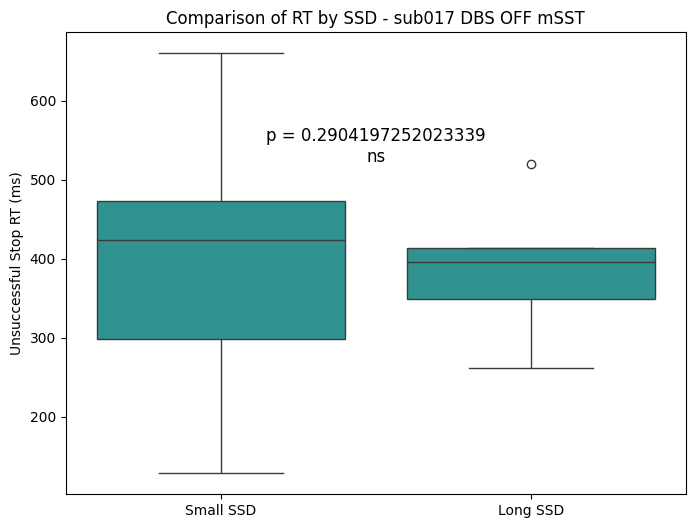

sub019 DBS ON mSST


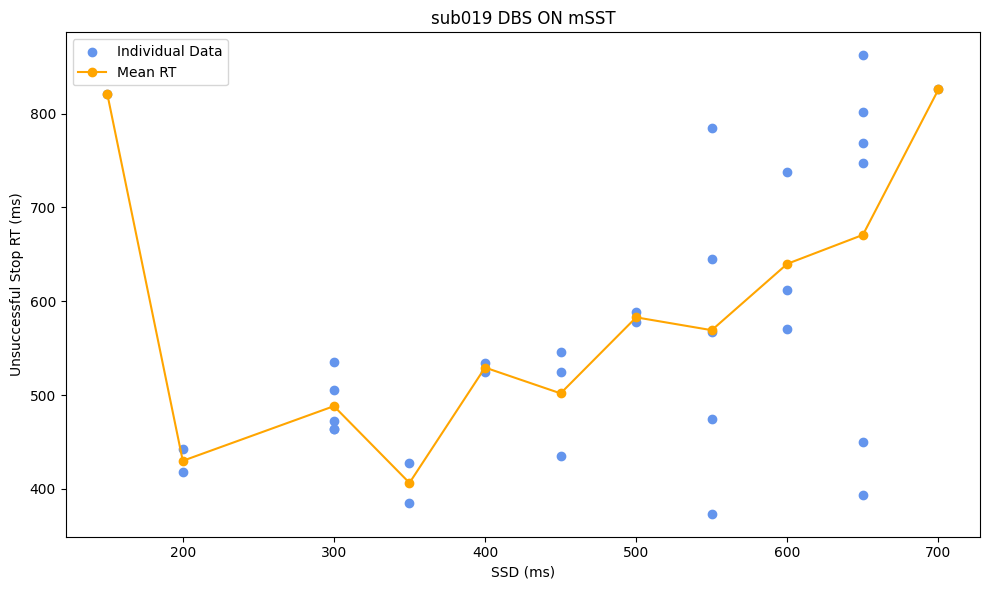

Data does NOT appear normal (p = 0.0049368697218596935 )
Data appears normally distributed (p = 0.2306753695011139 )
Mean RT (Small SSD): 509.64374117114966
Mean RT (Long SSD): 641.0232266644016
T-test p-value: 0.989375408626558


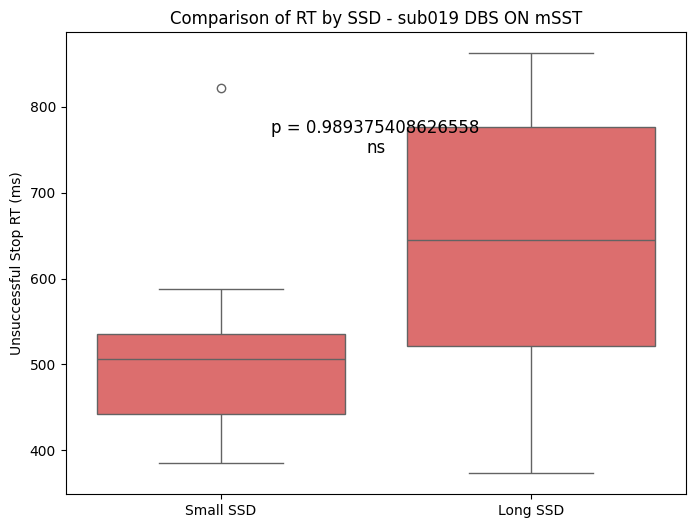

sub019 DBS OFF mSST


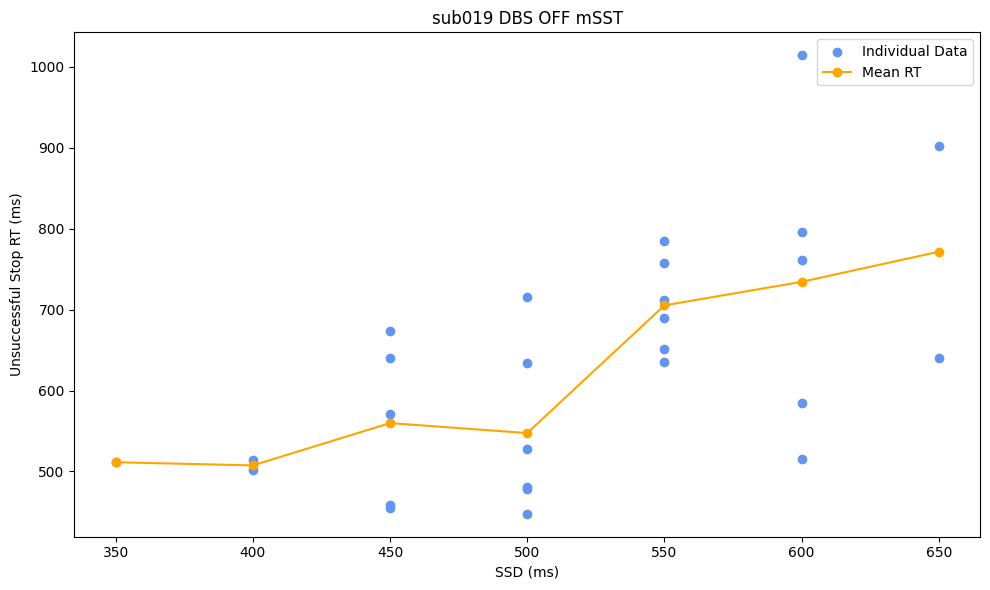

Data appears normally distributed (p = 0.06604038923978806 )
Data appears normally distributed (p = 0.8268541693687439 )
Mean RT (Small SSD): 543.559671362995
Mean RT (Long SSD): 726.5505769755691
T-test p-value: 0.9997394027374218


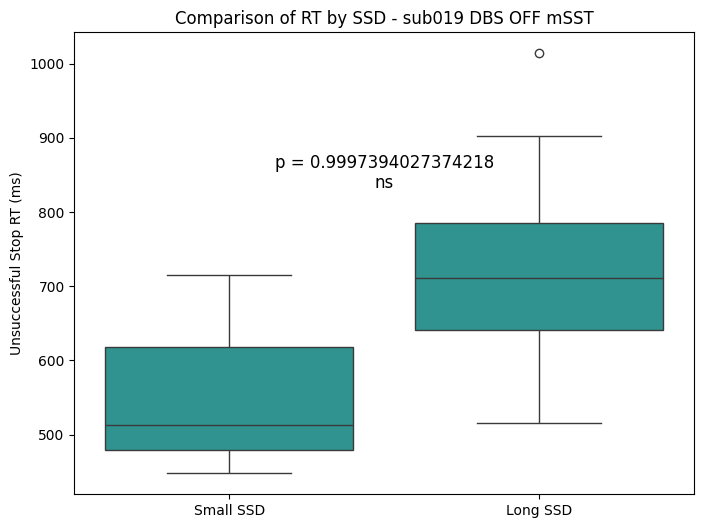

sub021 DBS OFF mSST


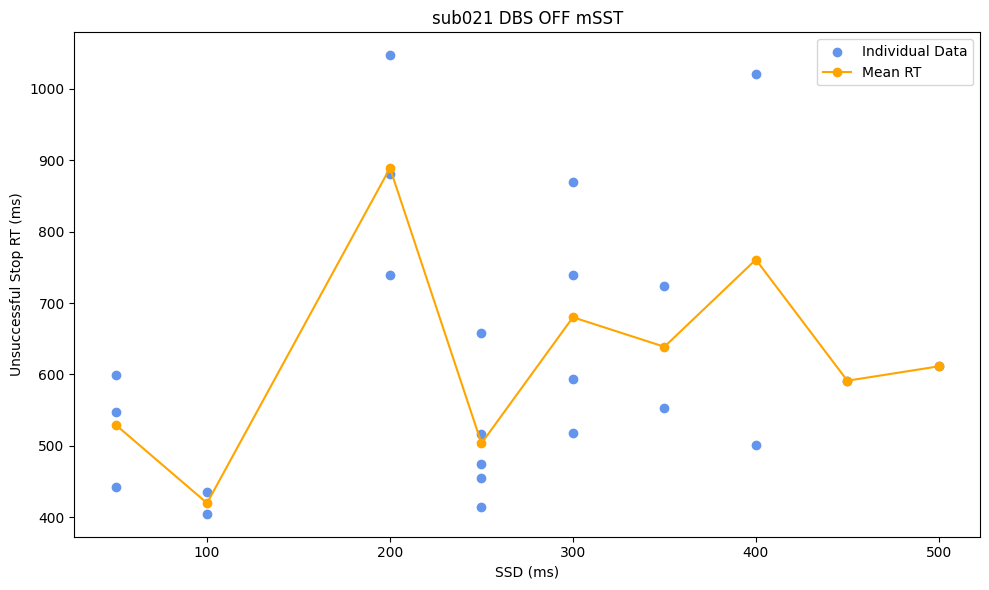

Data does NOT appear normal (p = 0.022702326998114586 )
Data appears normally distributed (p = 0.13898135721683502 )
Mean RT (Small SSD): 585.6319230873711
Mean RT (Long SSD): 672.2384899621829
T-test p-value: 0.9431115936098444


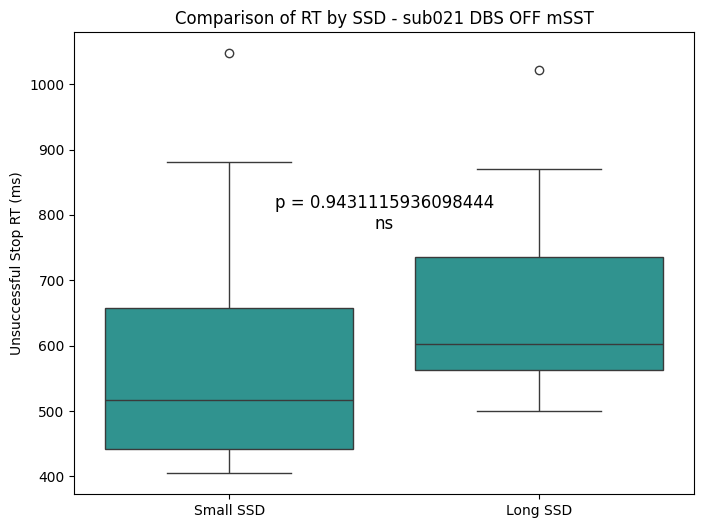

sub021 DBS ON mSST


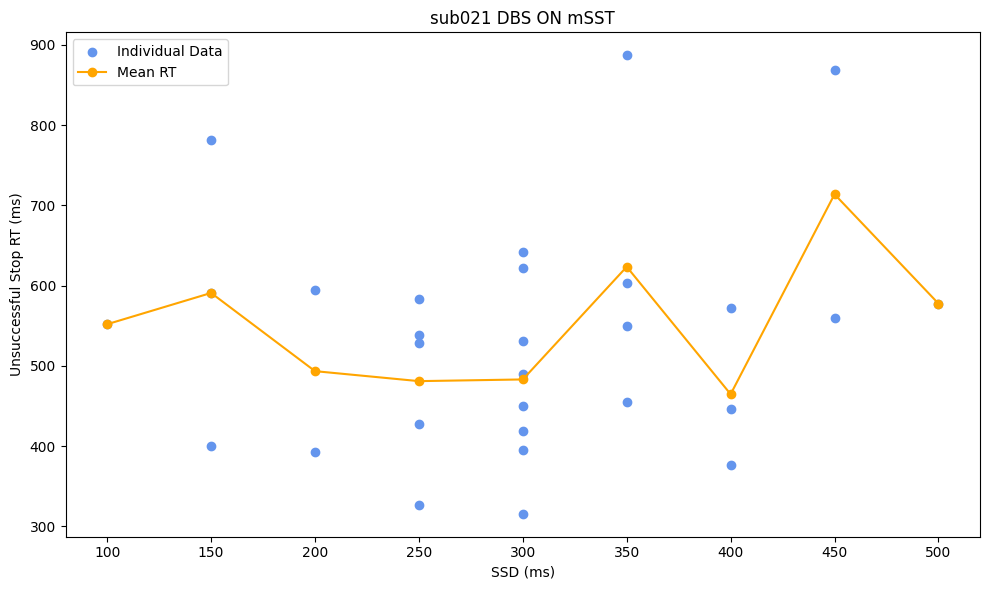

Data appears normally distributed (p = 0.6896252036094666 )
Data appears normally distributed (p = 0.08145438879728317 )
Mean RT (Small SSD): 504.34364211794576
Mean RT (Long SSD): 589.4126599188894
T-test p-value: 0.8964871959215324


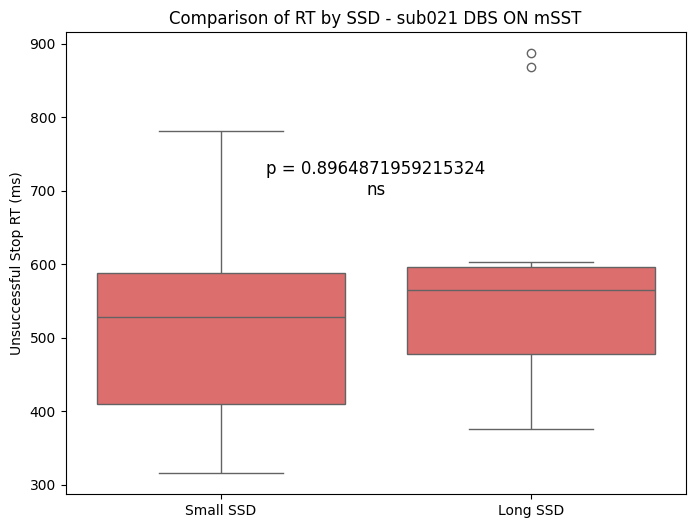

sub023 DBS OFF mSST


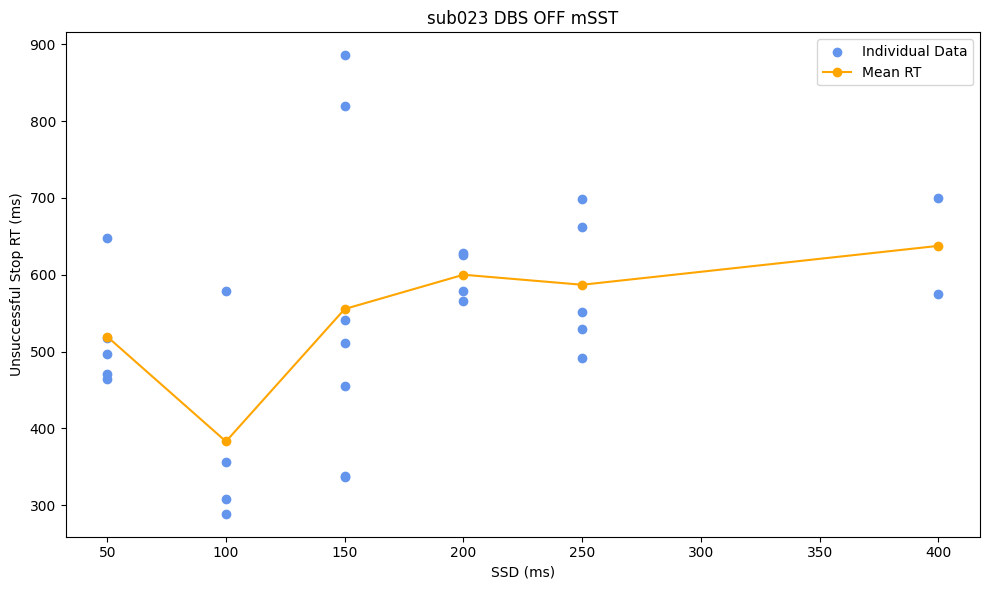

Data appears normally distributed (p = 0.09904275089502335 )
Data appears normally distributed (p = 0.6883951425552368 )
Mean RT (Small SSD): 501.00210623349994
Mean RT (Long SSD): 600.8731817657298
T-test p-value: 0.9916511928699199


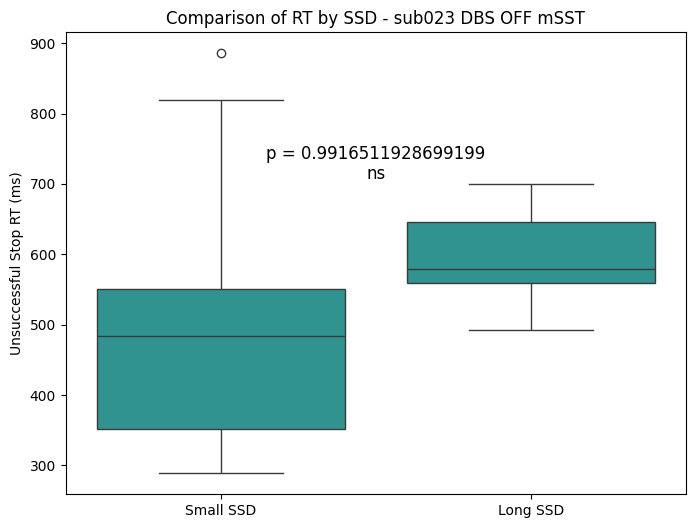

sub023 DBS ON mSST


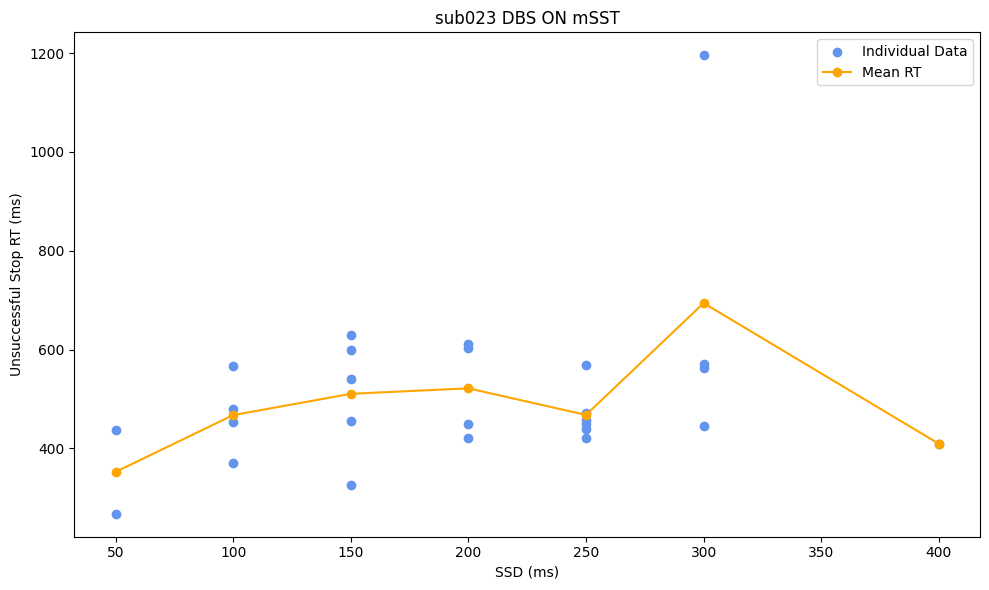

Data appears normally distributed (p = 0.44912242889404297 )
Data does NOT appear normal (p = 1.2908174539916217e-05 )
Mean RT (Small SSD): 480.8072133300205
Mean RT (Long SSD): 544.7060091590339
T-test p-value: 0.5618651681861191


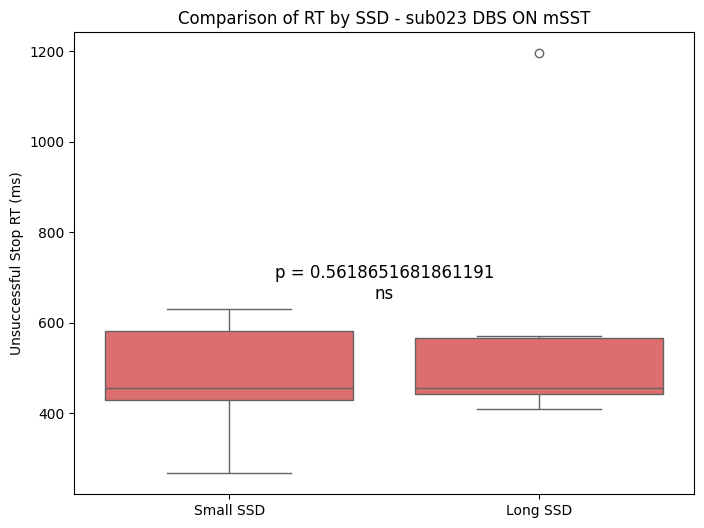

sub024 DBS ON mSST


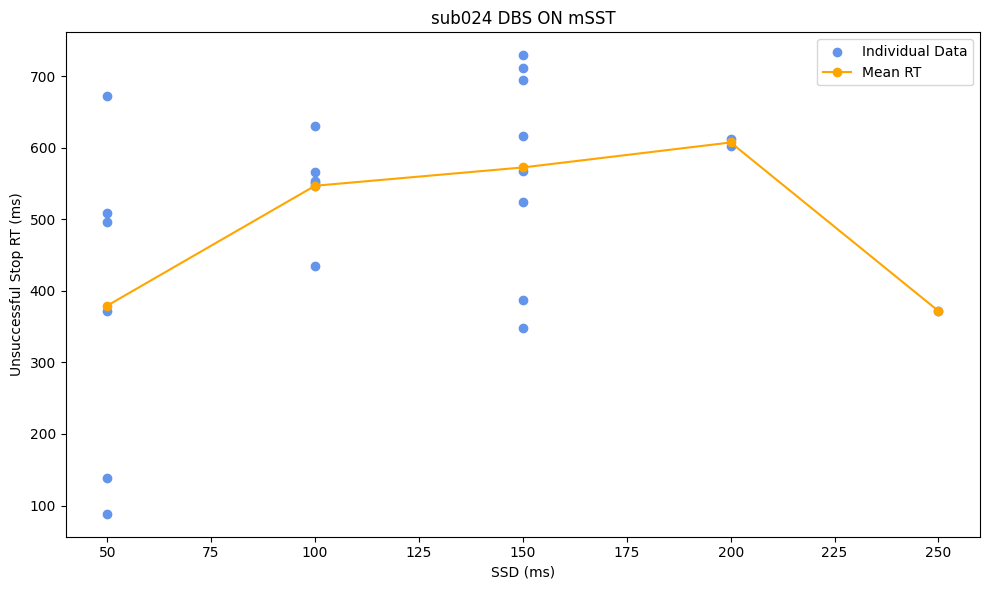

Data does NOT appear normal (p = 0.03069571778178215 )
Data appears normally distributed (p = 0.17261718213558197 )
Mean RT (Small SSD): 463.07432496299344
Mean RT (Long SSD): 560.5372091416608
T-test p-value: 0.9342061967966657


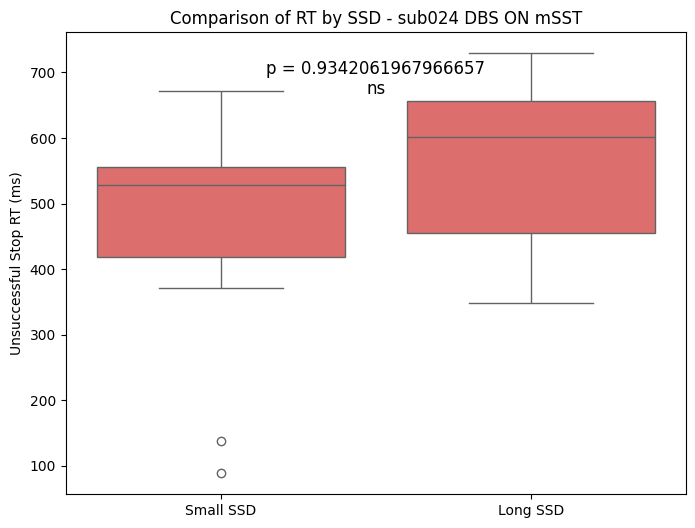

sub024 DBS OFF mSST


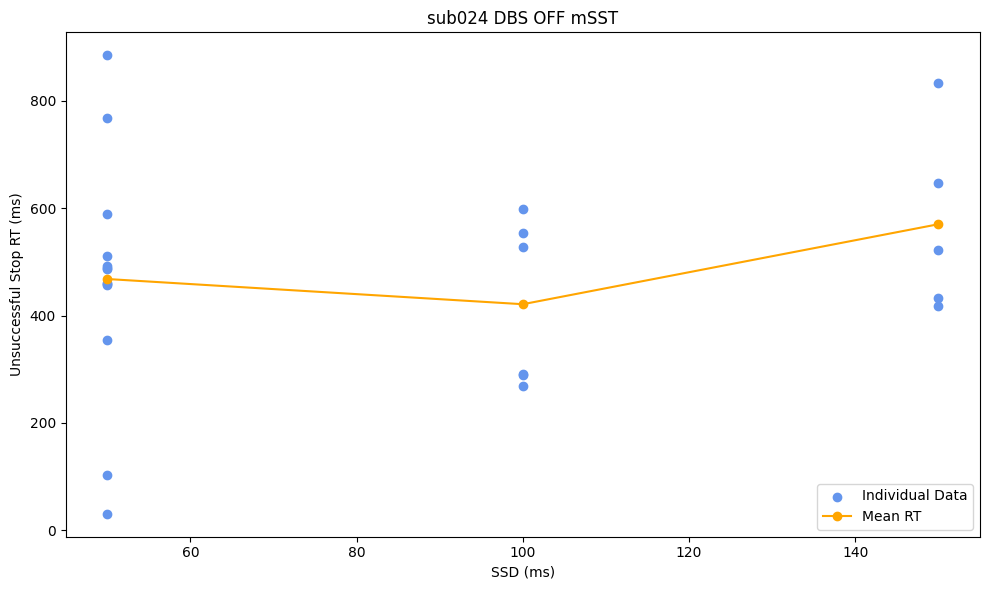

Data appears normally distributed (p = 0.17210730910301208 )
Data appears normally distributed (p = 0.565146803855896 )
Mean RT (Small SSD): 467.9898077335495
Mean RT (Long SSD): 488.77076389776033
T-test p-value: 0.6139705151246326


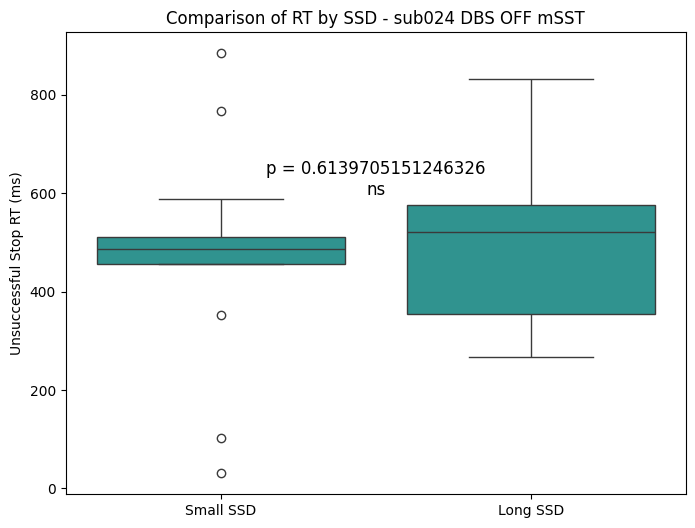

sub025 DBS ON mSST


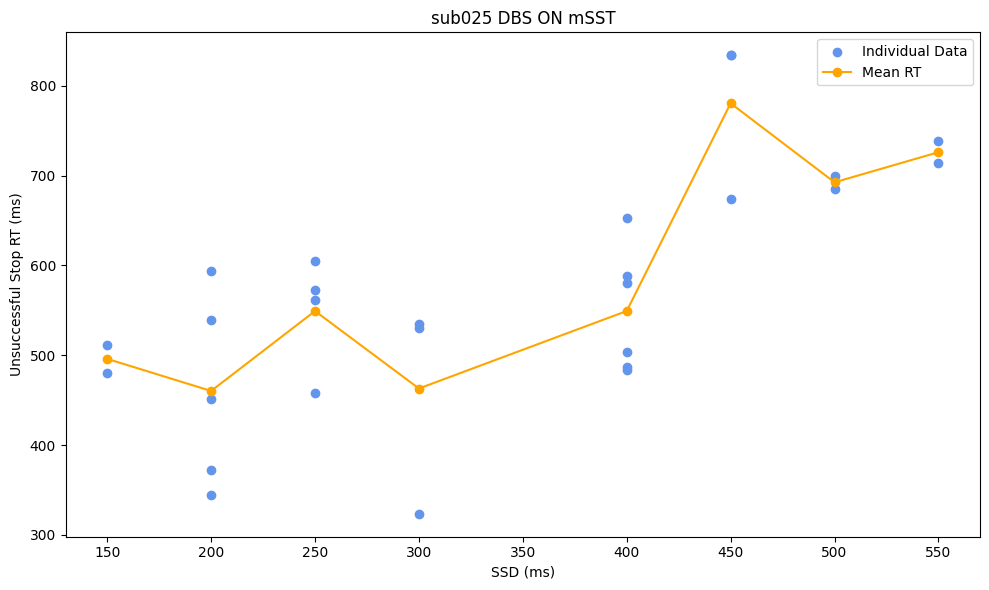

Data appears normally distributed (p = 0.1894558072090149 )
Data appears normally distributed (p = 0.3989032208919525 )
Mean RT (Small SSD): 491.3466785635267
Mean RT (Long SSD): 651.8168769096239
T-test p-value: 0.9989698899658903


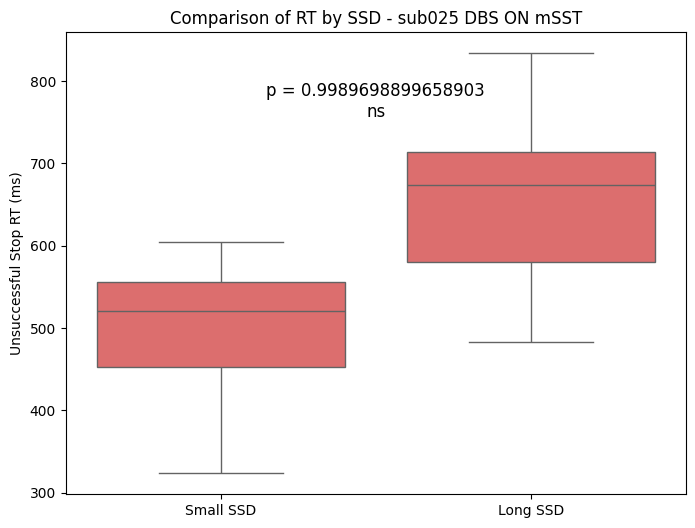

sub025 DBS OFF mSST


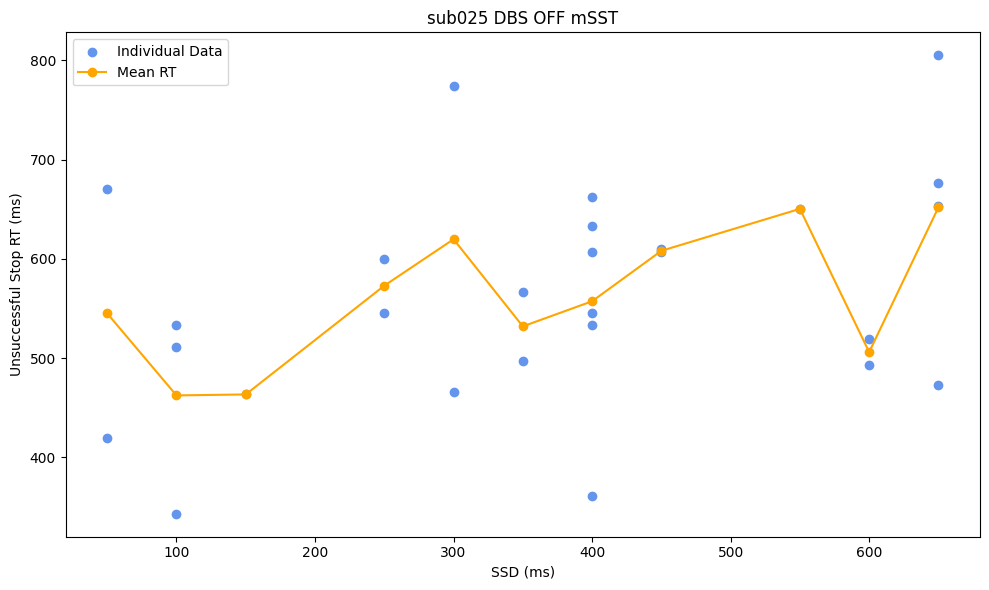

Data appears normally distributed (p = 0.9817935824394226 )
Data appears normally distributed (p = 0.5981772541999817 )
Mean RT (Small SSD): 540.7898000008167
Mean RT (Long SSD): 609.5894222251243
T-test p-value: 0.9286597578513885


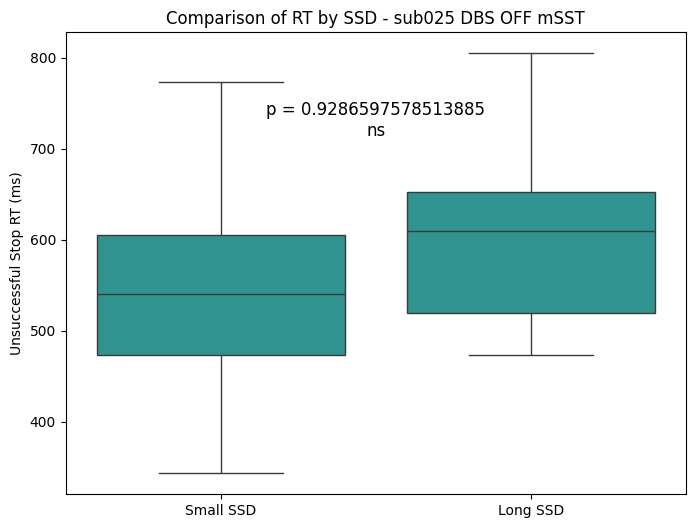

sub027 DBS ON mSST


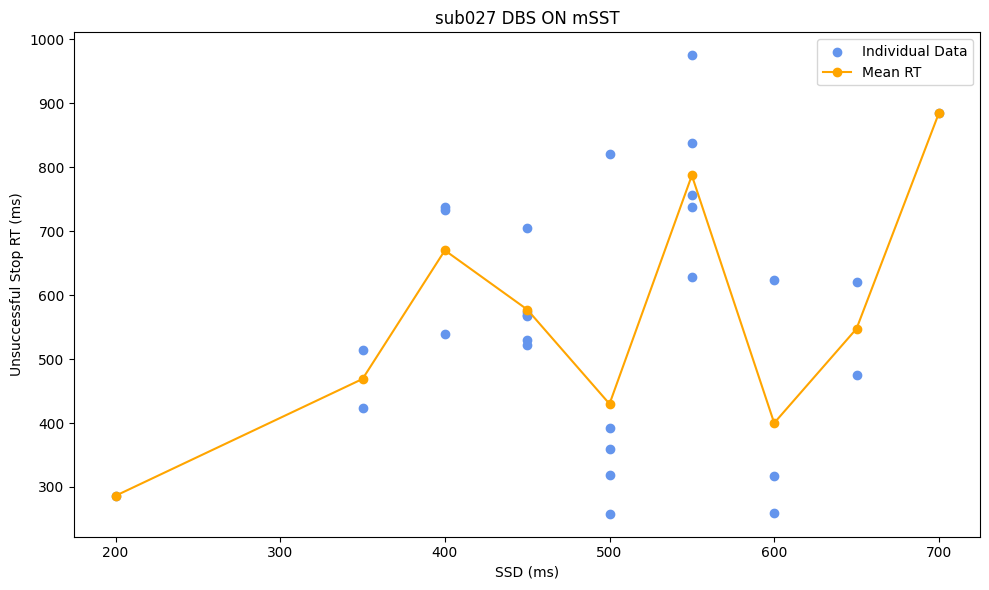

Data appears normally distributed (p = 0.585686206817627 )
Data appears normally distributed (p = 0.7045610547065735 )
Mean RT (Small SSD): 520.4359941211912
Mean RT (Long SSD): 646.7215909135782
T-test p-value: 0.9591138487032047


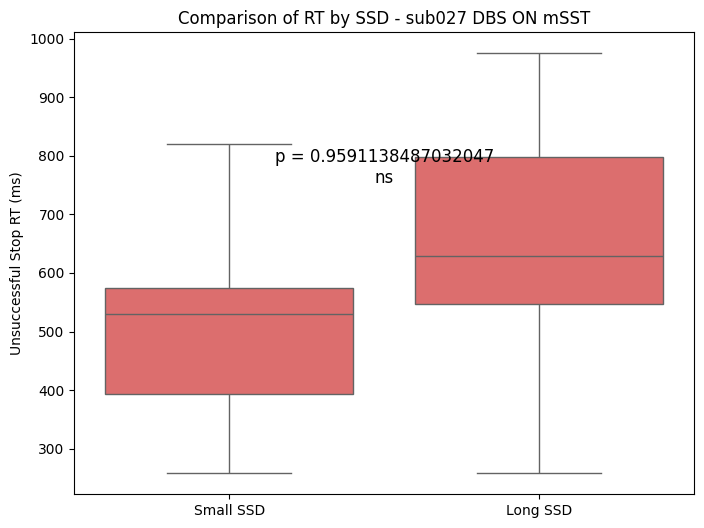

sub027 DBS OFF mSST


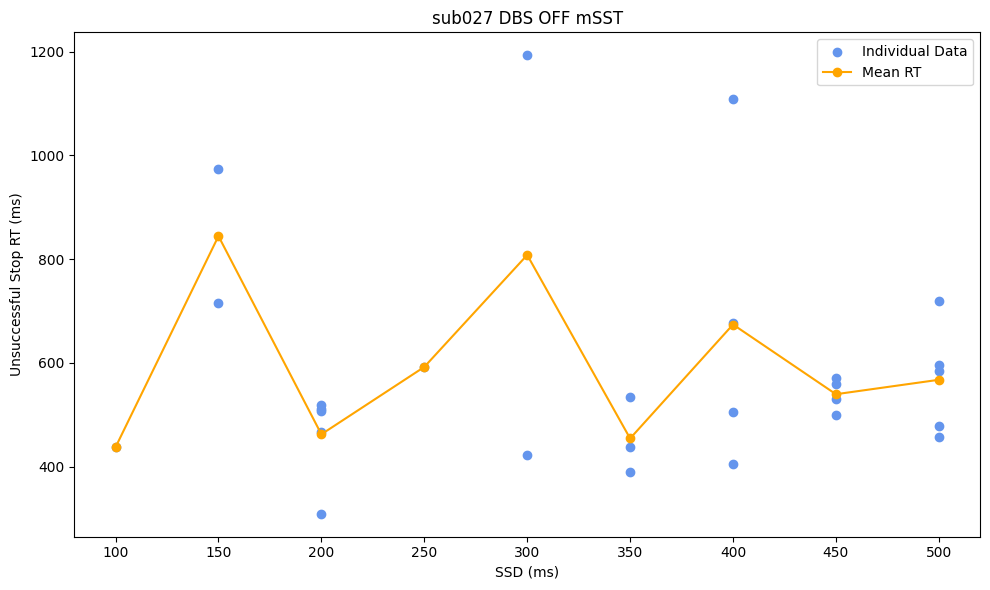

Data does NOT appear normal (p = 0.00442293006926775 )
Data does NOT appear normal (p = 0.0030542914755642414 )
Mean RT (Small SSD): 572.2801357135593
Mean RT (Long SSD): 591.838253847807
T-test p-value: 0.8400798827976221


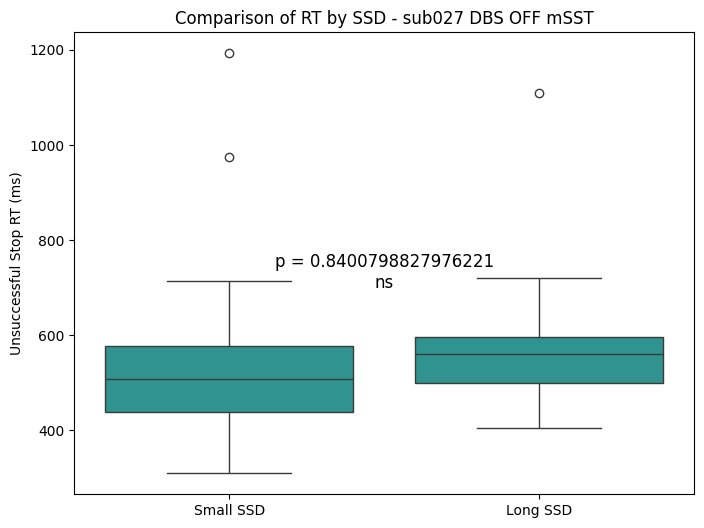

sub028 DBS OFF mSST


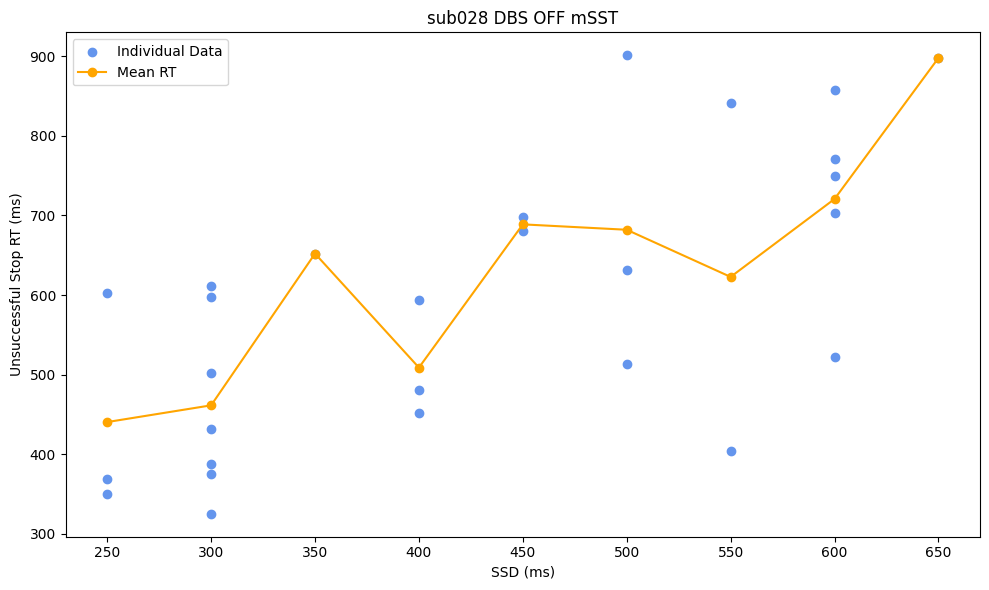

Data appears normally distributed (p = 0.15263348817825317 )
Data appears normally distributed (p = 0.5067501664161682 )
Mean RT (Small SSD): 480.8003428624943
Mean RT (Long SSD): 705.369030788111
T-test p-value: 0.9997394027374218


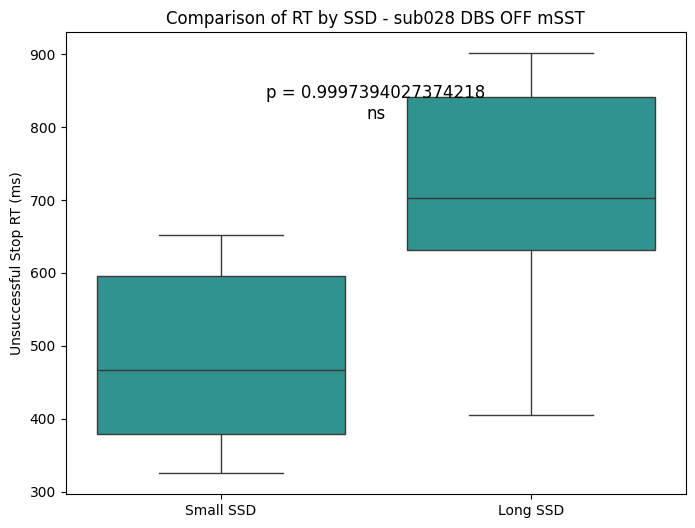

sub028 DBS ON mSST


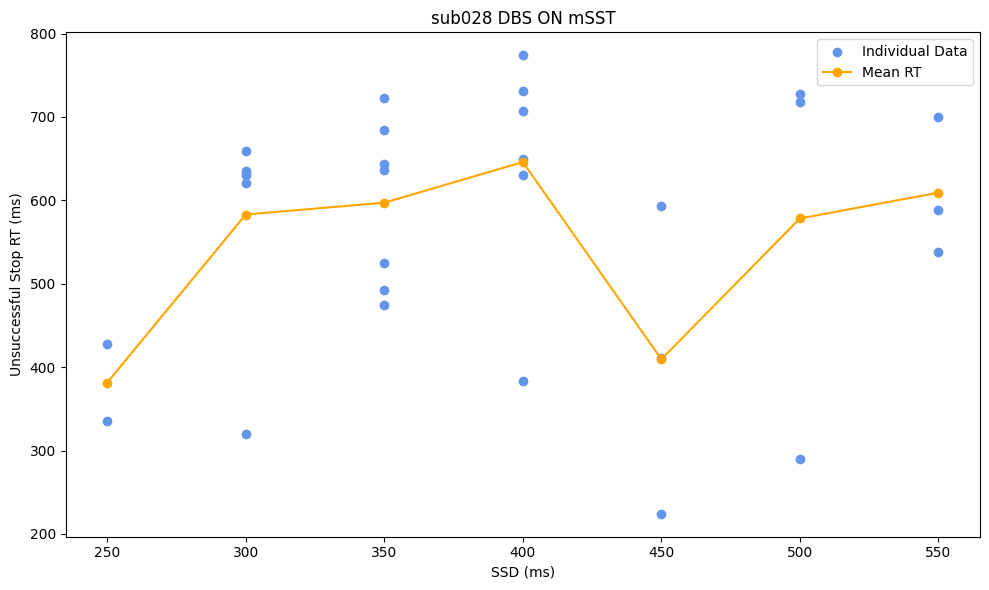

Data does NOT appear normal (p = 0.04306655004620552 )
Data does NOT appear normal (p = 0.04892521724104881 )
Mean RT (Small SSD): 562.7553266783556
Mean RT (Long SSD): 577.7566933383545
T-test p-value: 0.7465425330937521


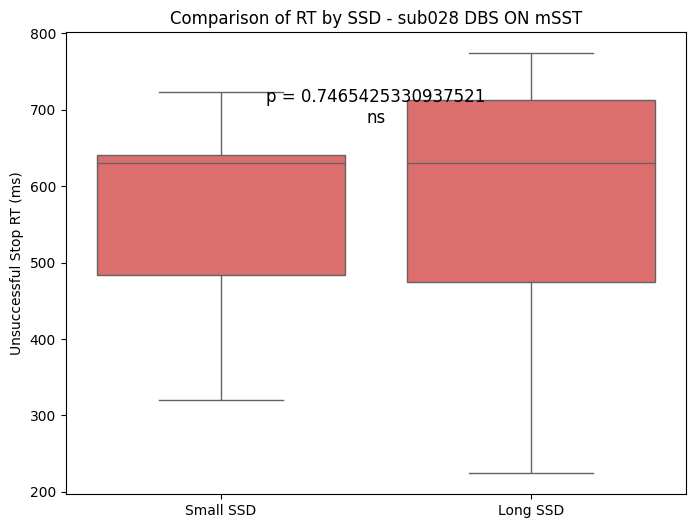

sub029 DBS ON mSST


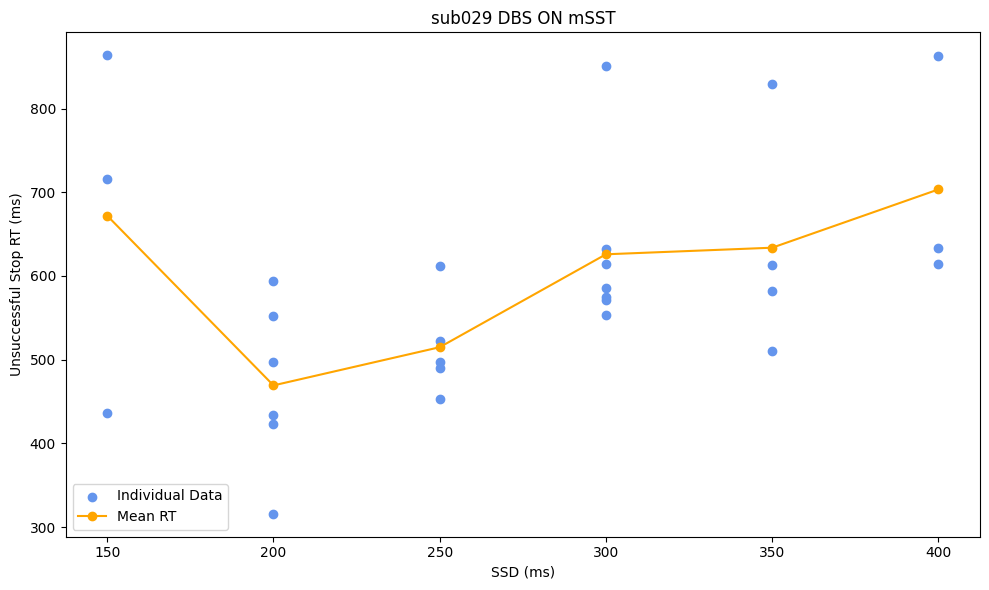

Data appears normally distributed (p = 0.2082207202911377 )
Data does NOT appear normal (p = 0.0030008365865796804 )
Mean RT (Small SSD): 528.970135675211
Mean RT (Long SSD): 644.7372357028404
T-test p-value: 0.9968704236116923


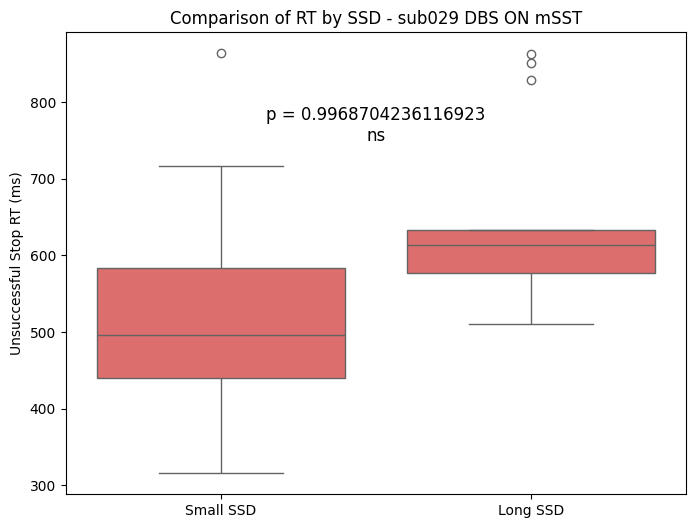

sub029 DBS OFF mSST


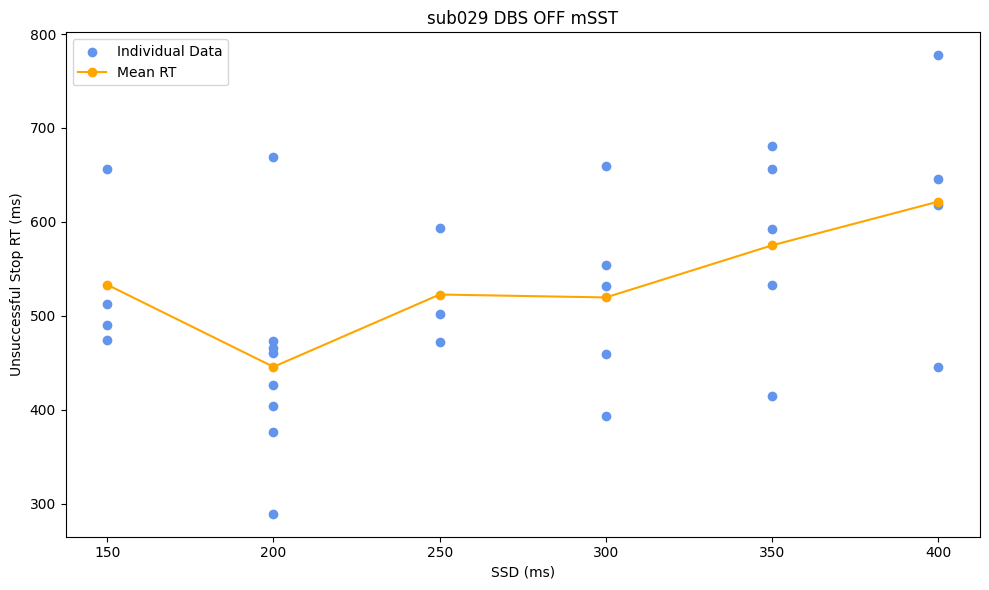

Data appears normally distributed (p = 0.37212759256362915 )
Data appears normally distributed (p = 0.7848122119903564 )
Mean RT (Small SSD): 484.4226200444003
Mean RT (Long SSD): 568.5842571380947
T-test p-value: 0.9576389771974584


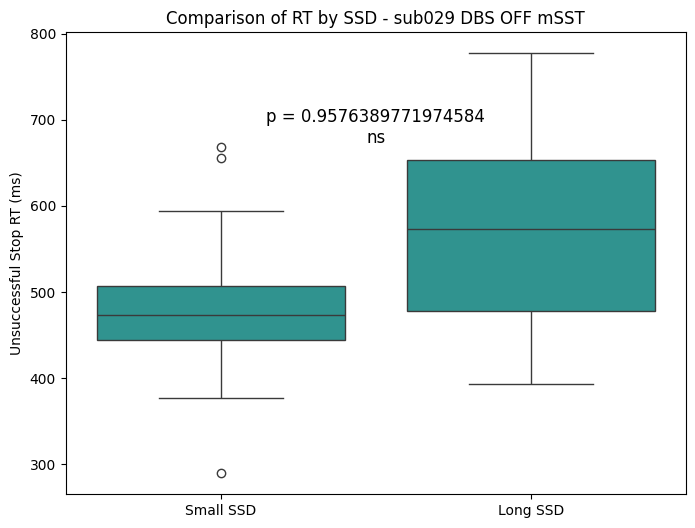

sub032 DBS ON mSST


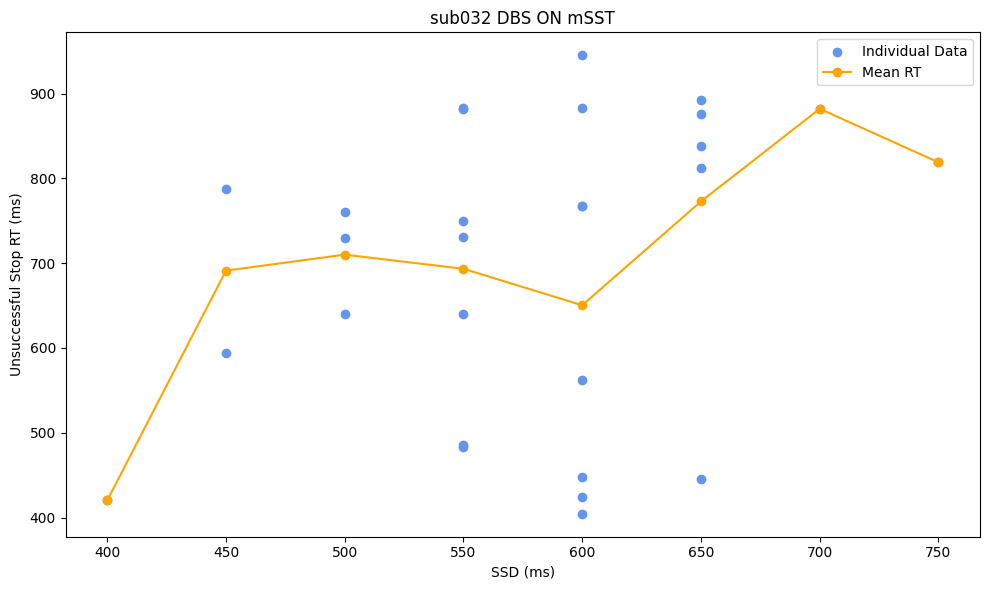

Data appears normally distributed (p = 0.1286260187625885 )
Data does NOT appear normal (p = 0.0007372043328359723 )
Mean RT (Small SSD): 666.1577904761825
Mean RT (Long SSD): 794.9756999999928
T-test p-value: 0.9726250802337758


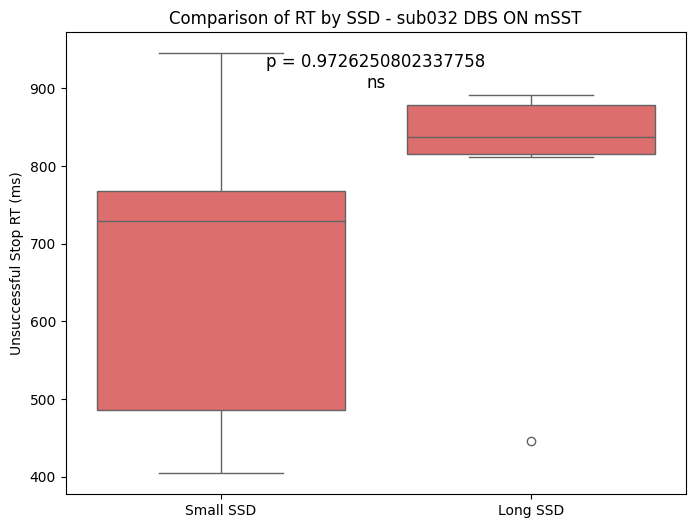

sub032 DBS OFF mSST


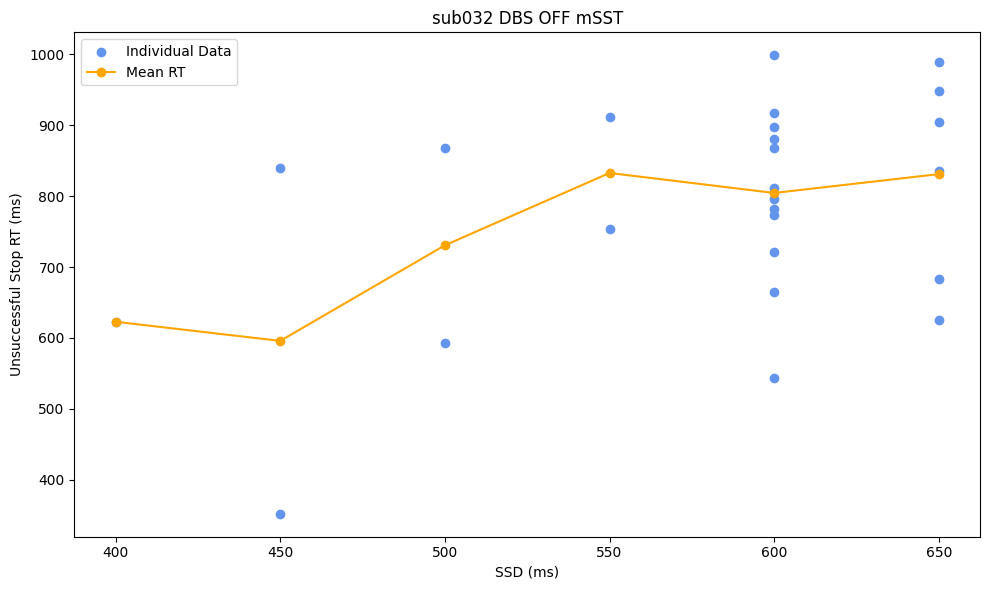

Data appears normally distributed (p = 0.14393629133701324 )
Data appears normally distributed (p = 0.45380866527557373 )
Mean RT (Small SSD): 768.0621368421462
Mean RT (Long SSD): 830.9171166692977
T-test p-value: 0.8333427442123092


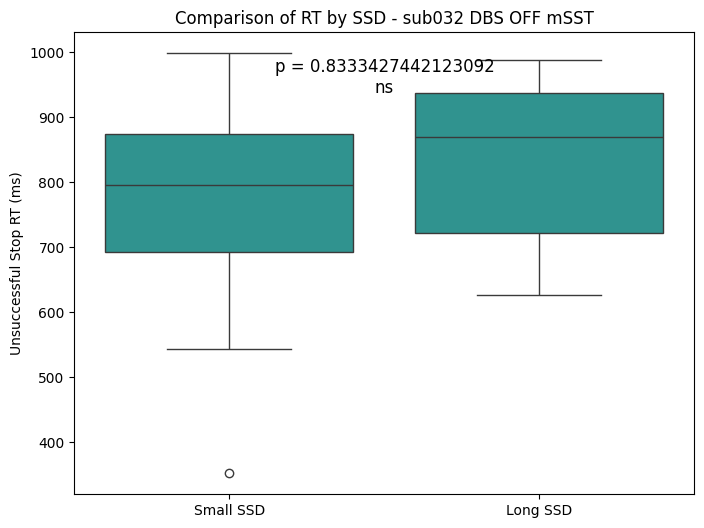

sub033 DBS ON mSST


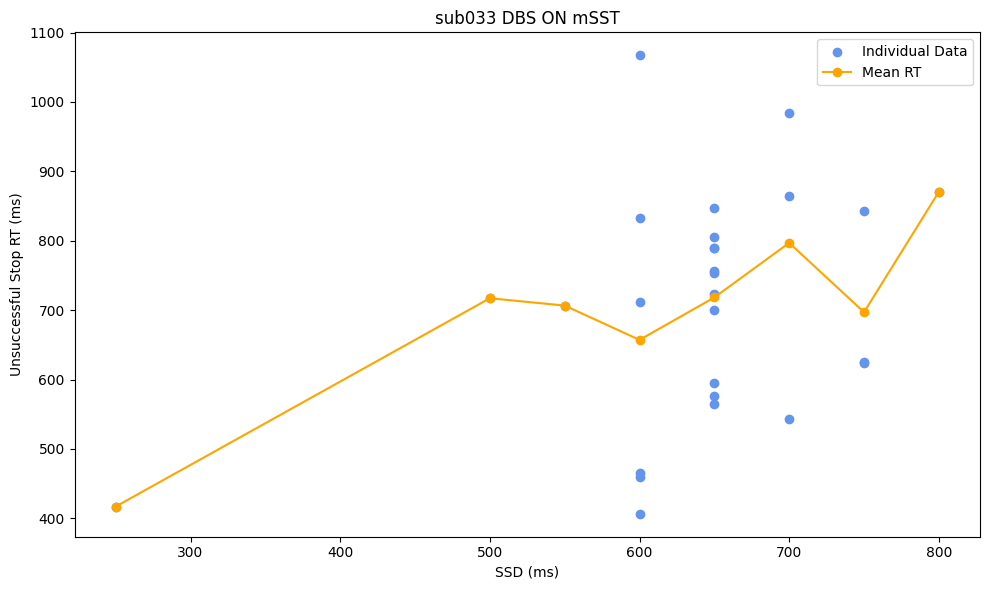

Data appears normally distributed (p = 0.26061055064201355 )
Data appears normally distributed (p = 0.3118041455745697 )
Mean RT (Small SSD): 684.1849650023505
Mean RT (Long SSD): 764.5676428551918
T-test p-value: 0.9007837573054963


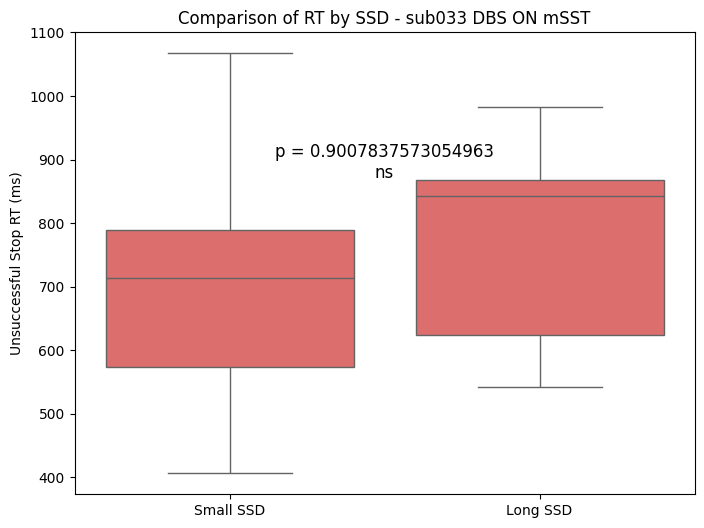

sub033 DBS OFF mSST


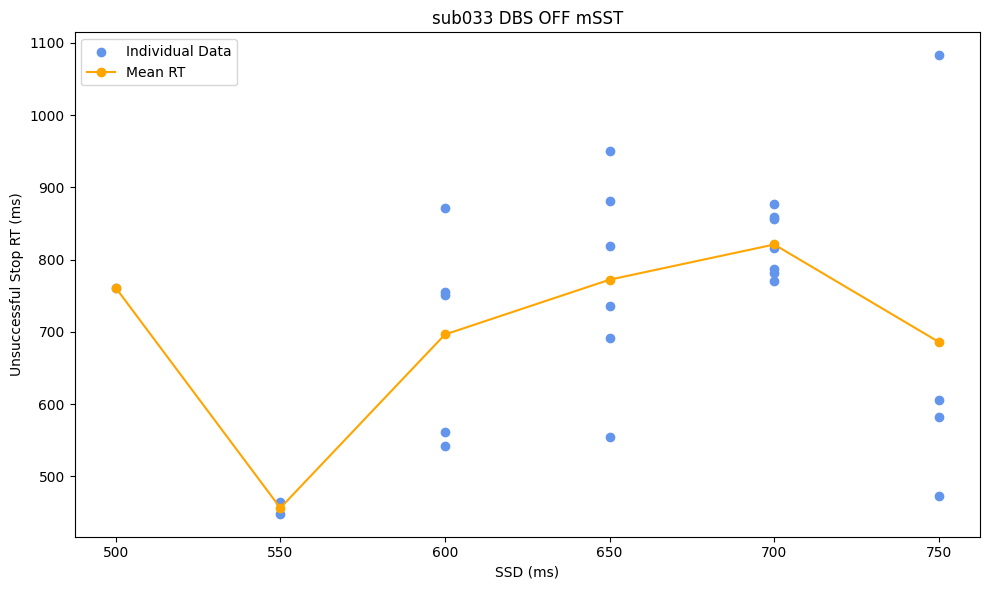

Data appears normally distributed (p = 0.42433685064315796 )
Data appears normally distributed (p = 0.5321319699287415 )
Mean RT (Small SSD): 699.0951071433561
Mean RT (Long SSD): 771.7864545451117
T-test p-value: 0.9008665482919983


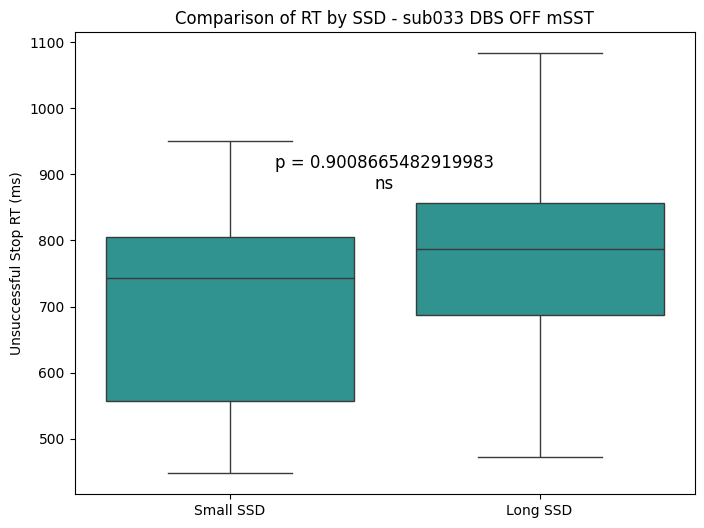

Excel file saved as 'p_values_independance_test_SSD.xlsx'.


In [12]:
p_value_dict_SSD = {}

for subject in stats:
    print(f'{subject}')
    if subject.startswith('C'):
        condition = 'control'
    elif subject.startswith('preop'):
        condition = 'preop'
    else:
        if subject.endswith('ON mSST'):
            condition = 'dbs_on'
        else:
            condition = 'dbs_off'
    u_GS_RT = stats[subject]['stop_trial RTs (ms)']
    SSD = stats[subject]['unsuccessful stop SSD (ms)']
    
    # Convert to DataFrame for easier grouping
    data = pd.DataFrame({'SSD': SSD, 'u_GS_RT': u_GS_RT})
    
    # Calculate mean RT for each unique SSD
    mean_values = data.groupby('SSD')['u_GS_RT'].mean().reset_index()

    plt.figure(figsize=(10, 6))
    plt.scatter(SSD, u_GS_RT, label='Individual Data', color='cornflowerblue')
    plt.plot(mean_values['SSD'], mean_values['u_GS_RT'], 'o-', color='orange', label='Mean RT')
    
    plt.xlabel('SSD (ms)')
    plt.ylabel('Unsuccessful Stop RT (ms)')
    plt.title(f'{subject}')
    plt.legend()
    plt.tight_layout()
    plt.show()

    threshold = np.median(SSD) 
    small_ssd = data[data['SSD'] <= threshold]
    long_ssd = data[data['SSD'] > threshold]

    # Calculate mean RT
    mean_small = small_ssd['u_GS_RT'].mean()
    mean_long = long_ssd['u_GS_RT'].mean()

    stat, p = scipy.stats.shapiro(small_ssd['u_GS_RT'])
    if p > 0.05:
        print("Data appears normally distributed (p =", p, ")")
    else:
        print("Data does NOT appear normal (p =", p, ")")

    stat, p = scipy.stats.shapiro(long_ssd['u_GS_RT'])
    if p > 0.05:
        print("Data appears normally distributed (p =", p, ")")
    else:
        print("Data does NOT appear normal (p =", p, ")")    

    """
    # Perform a t-test or non-parametric test
    t_stat, p_value = ttest_ind(small_ssd['u_GS_RT'], long_ssd['u_GS_RT'], alternative='greater')

    Based on the shapiro test, half of my data does not appear normally distributed. 
    Therefore, a mann whitney test would be better (non parametric test):
    """

    # Perform a non-parametric test (mann whitney):
    #u_stat, p_value = ttest_ind(small_ssd['u_GS_RT'], long_ssd['u_GS_RT'], alternative='greater')
    stat, p_value = scipy.stats.mannwhitneyu(small_ssd['u_GS_RT'], long_ssd['u_GS_RT'], alternative='greater')
    p_value_dict_SSD[subject] = p_value

    print(f"Mean RT (Small SSD): {mean_small}")
    print(f"Mean RT (Long SSD): {mean_long}")
    print(f"T-test p-value: {p_value}")

    plt.figure(figsize=(8, 6))
    sns.boxplot(x=['Small SSD']*len(small_ssd) + ['Long SSD']*len(long_ssd),
                y=pd.concat([small_ssd['u_GS_RT'], long_ssd['u_GS_RT']]),
                color=color_dict[condition]
                )
    # Annotate statistical results
    if p_value is not None:
        annotation = "ns" if p_value >= 0.05 else "*"    
        plt.text(0.5, max(mean_small, mean_long) + 100, f"p = {p_value}\n{annotation}", 
                    ha='center', va='bottom', color='black', fontsize=12)
    plt.ylabel('Unsuccessful Stop RT (ms)')
    plt.title(f'Comparison of RT by SSD - {subject}')
    plt.show()


# Convert dictionary to DataFrame
df_p_value_dict_SSD = pd.DataFrame(list(p_value_dict_SSD.items()), columns=['Subject', 'P-Value'])

# Save to Excel
df_p_value_dict_SSD.to_excel(join(behav_results_saving_path,'p_values_independance_test_SSD.xlsx'), index=False)

print("Excel file saved as 'p_values_independance_test_SSD.xlsx'.")

## Replication of the Hervault et al paper from 2021 ##

"A prediction of the model is that the RT in unsuccessful STOP trials should lengthen with increasing Stop signal delay (SSD), because gradually more movements fail to be inhibited as the STOP signal is delayed. In order to examine this prediction, RT from unsuccessful STOP trials were averaged across participants at each given SSD. From these mean values, the differences were then computed between each SSD and the immediately shorter SSD. A one–sided t-test showed the differential values to be significantly positive for both the pressing (t(6) = 3.42, p <.05) and the swiping type (t(6) = 3.47, p < .05), which confirmed the expected increase of the RT(unsuccessful STOP trials) as function of SSD". 

t(14) = 2.005, p = 0.0323
SSD bins (ms): [50.0, 100.0, 150.0, 200.0, 250.0, 300.0, 350.0, 400.0, 450.0, 500.0, 550.0, 600.0, 650.0, 700.0, 750.0, 800.0]
Mean RT per bin (ms): [437.46355562 461.97465552 570.64538586 481.99209024 502.77804579
 557.82277262 566.09062515 597.37979891 619.8658115  648.83036967
 650.75253677 668.70861452 755.83403162 784.15572855 733.91686667
 870.38979999]
RT differences between bins: [ 24.5110999  108.67073034 -88.65329562  20.78595555  55.04472683
   8.26785253  31.28917375  22.48601259  28.96455817   1.92216711
  17.95607775  87.12541709  28.32169693 -50.23886188 136.47293333]
One-sided t-test result: t = 2.005, p = 0.0323


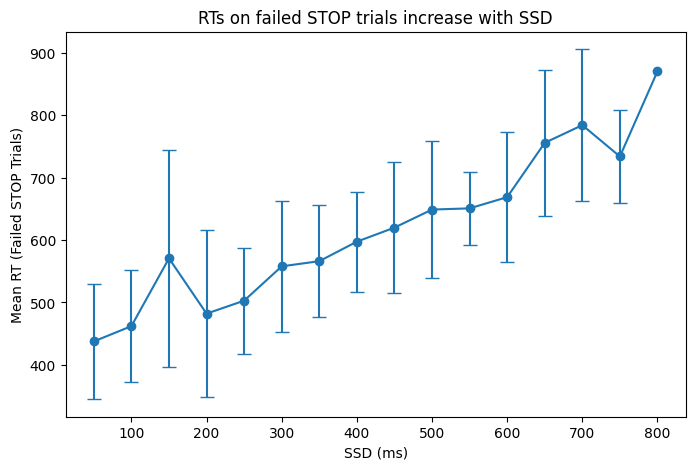

In [13]:
from scipy.stats import ttest_1samp

ssds = []
rt_failed_stop = []
subs = []
for sub in stats.keys():
    if sub in excluded_subjects:
        continue
    ssds.append(stats[sub]['unsuccessful stop SSD (ms)'])
    rt_failed_stop.append(stats[sub]['stop_trial RTs (ms)'])
    subs.append(sub)

# Create a DataFrame for the SSD and RT data
df_ssd_rt = pd.DataFrame({
    'Subject': subs,
    'SSD (ms)': ssds,
    'RT Failed Stop (ms)': rt_failed_stop
})

long_data = []

for idx, row in df_ssd_rt.iterrows():
    subject = row['Subject']
    ssds = row['SSD (ms)']
    rts = row['RT Failed Stop (ms)']
    
    for ssd, rt in zip(ssds, rts):
        long_data.append({'Subject': subject, 'SSD': ssd, 'RT': rt})

df_long = pd.DataFrame(long_data)

# Step 2: Bin SSDs into 50ms bins
bin_size = 50
df_long['SSD_bin'] = (df_long['SSD'] // bin_size) * bin_size  # e.g., 0–49 => 0, 50–99 => 50, etc.

# Step 3: Compute average RT per subject per bin
mean_rt_per_sub_bin = df_long.groupby(['Subject', 'SSD_bin'])['RT'].mean().reset_index()

# Step 4: Compute average RT across subjects per SSD bin
mean_rt_per_bin = mean_rt_per_sub_bin.groupby('SSD_bin')['RT'].mean().sort_index()

# Get the standard deviation across subjects per SSD bin
std_rt_per_bin = mean_rt_per_sub_bin.groupby('SSD_bin')['RT'].std().sort_index()

# Step 5: Compute differences between consecutive SSD bins
ssd_bins = mean_rt_per_bin.index.to_list()
rt_means = mean_rt_per_bin.values
rt_diffs = np.diff(rt_means)

# Step 6: One-sided t-test: Are the differences significantly > 0?
t_stat, p_value = ttest_1samp(rt_diffs, popmean=0, alternative='greater')
df = len(rt_diffs) - 1
print(f"t({df}) = {t_stat:.3f}, p = {p_value:.4f}")
# Output the results
print("SSD bins (ms):", ssd_bins)
print("Mean RT per bin (ms):", rt_means)
print("RT differences between bins:", rt_diffs)
print(f"One-sided t-test result: t = {t_stat:.3f}, p = {p_value:.4f}")

plt.figure(figsize=(8, 5))
plt.errorbar(ssd_bins, rt_means, yerr=std_rt_per_bin.values, fmt='o-', capsize=5)
plt.xlabel('SSD (ms)')
plt.ylabel('Mean RT (Failed STOP Trials)')
plt.title('RTs on failed STOP trials increase with SSD')
plt.show()


The differential values were significantly positive (t(14) =  1.959, p = 0.0352) which confirms the prediction of the model, that the RT in unsuccessful STOP trials should lengthen with increasing Stop signal delay (SSD).

## 3.c. Check the success rate / omission ##

Participants should have a good success rate to evaluate further behavioral measures. If the success rate is too low, they might have not understood the task sufficiently well to make any further deduction, and should be excluded. For example, success rates on GO, GF and GC trials should be as close as possible to 100%. Success rates on GS trials should be close to 50%.

In [14]:
# Here, percent correct trial for each trial type is calculated after removing 
# early presses (therefore, it only takes into account trials during which the 
# cue was actally presented).

single_subject = {}
for subject in stats.keys():
    if subject in excluded_subjects:
        continue
    # Retrieve values for each trial type in both conditions
    values = [
        stats[subject]['percent correct go_trial'],
        stats[subject]['percent correct stop_trial'],
        stats[subject]['percent correct go_fast_trial'],
        stats[subject]['percent correct go_continue_trial']
    ]
    single_subject[subject] = values

Cut-offs:
    - Success rate on GO trials should be >70%
    - Success rate on Stop trials should be comprised between 35-65% (see Ray et al 2012 - Charlotte sent on Teams)

In [15]:
# Define trial types
trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']

# List to store subject data
data_list = []

# Loop through subjects in the dictionary
for subject_id, values in single_subject.items():
    # Identify condition
    if subject_id.startswith('C'):
        condition = 'control'
    elif subject_id.startswith('preop'):
        condition = 'preop'
    elif 'OFF' in subject_id:
        condition = 'dbs_off'
    elif 'ON' in subject_id:
        condition = 'dbs_on'
    
    # Append a dictionary for each subject
    data_list.append({
        'Subject': subject_id,
        'Condition': condition,
        'go_trial': values[0],
        'stop_trial': values[1],
        'go_fast_trial': values[2],
        'go_continue_trial': values[3]
    })

    if values[0] < 70:
        print(f"Warning: {subject_id} has a go_trial success rate below 70%: {values[0]}%")
        if subject_id not in excluded_subjects:
            excluded_subjects.append(subject_id)
    if values[1] > 65 or values[1] < 35:
        print(f"Warning: {subject_id} has a stop_trial success rate outside 35-65%: {values[1]}%")
        if subject_id not in excluded_subjects:
            excluded_subjects.append(subject_id)

# if another session is available for the excluded subjects, exclude these as well:
for excluded_sub in excluded_subjects:
    base_sub_id = excluded_sub.split(' ')[0]  # get the base subject ID without condition
    for sub in subs:
        if sub.startswith(base_sub_id) and sub not in excluded_subjects:
            excluded_subjects.append(sub)
            
# Convert to DataFrame
df_summary = pd.DataFrame(data_list)

# Display DataFrame
print(df_summary)

# # Save to Excel
df_summary.to_excel(join(behav_results_saving_path,'summary_success_rates.xlsx'), index=False)

print("Summary DataFrame saved as 'summary_success_rates.xlsx'.")


                Subject Condition   go_trial  stop_trial  go_fast_trial  \
0             C003 mSST   control  89.166667   63.291139     100.000000   
1             C004 mSST   control  97.777778   45.000000     100.000000   
2             C006 mSST   control  94.166667   60.000000      92.500000   
3             C007 mSST   control  95.000000   56.666667     100.000000   
4             C008 mSST   control  96.111111   53.333333     100.000000   
5             C009 mSST   control  97.777778   51.666667     100.000000   
6             C010 mSST   control  88.888889   56.666667      90.000000   
7             C011 mSST   control  90.000000   56.666667      96.666667   
8             C012 mSST   control  86.666667   53.333333     100.000000   
9    sub006 DBS ON mSST    dbs_on  79.166667   60.000000      97.500000   
10  sub006 DBS OFF mSST   dbs_off  97.206704   51.666667     100.000000   
11   sub008 DBS ON mSST    dbs_on  84.745763   60.759494      72.151899   
12  sub008 DBS OFF mSST  

In [17]:
excluded_subjects

['sub009 DBS OFF mSST',
 'sub009 DBS ON mSST',
 'sub008 DBS OFF mSST',
 'sub017 DBS OFF mSST',
 'sub021 DBS OFF mSST',
 'sub024 DBS ON mSST',
 'sub024 DBS OFF mSST',
 'sub008 DBS ON mSST',
 'sub017 DBS ON mSST',
 'sub021 DBS ON mSST']

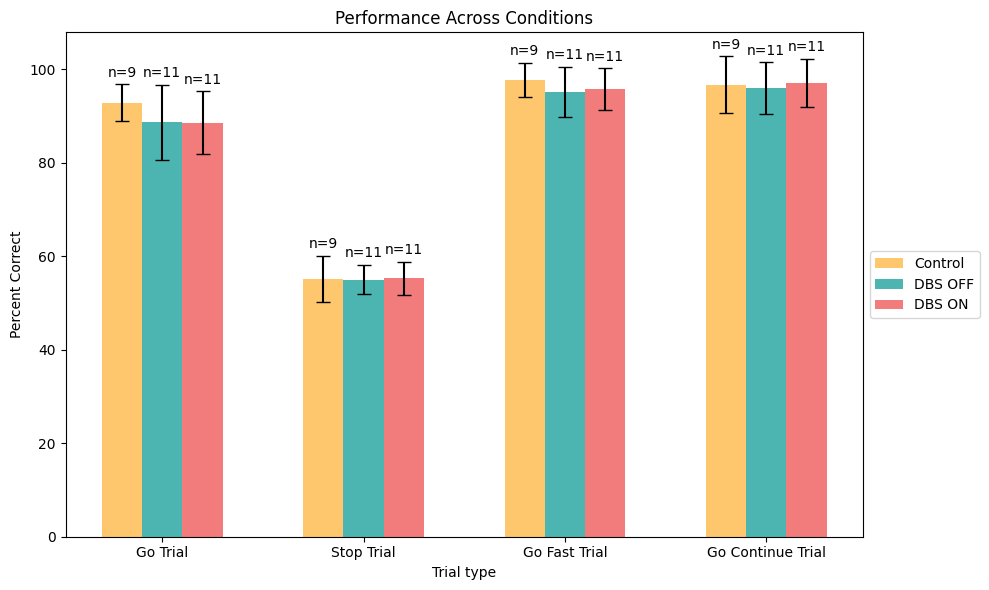

In [18]:
# Create plots to compare groups:
# Plot the percentage of correct trials for each trial type across the 3 groups:
trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
bar_width = 0.2
index = np.arange(len(trial_types))
opacity = 0.8

# Define conditions and corresponding dictionaries, but remove excluded subjects
conditions = {
    'control': {k: v for k, v in stats_CONTROL.items() if k not in excluded_subjects},
    'dbs_off': {k: v for k, v in stats_OFF.items() if k not in excluded_subjects},
    'dbs_on': {k: v for k, v in stats_ON.items() if k not in excluded_subjects}, 
    #'preop': {k: v for k, v in stats_PREOP.items() if k not in excluded_subjects}
}

# Initialize dictionaries to hold results for each condition
results = {condition: [] for condition in conditions.keys()}

# Loop through each condition and subject
for condition, data_dict in conditions.items():
    for subject_id, metrics in data_dict.items():
        # Retrieve the required metrics and store them in the result dictionary
        results[condition].append([
            metrics['percent correct go_trial'],
            metrics['percent correct stop_trial'],
            metrics['percent correct go_fast_trial'],
            metrics['percent correct go_continue_trial']
        ])

# Access data for each condition
control = results['control']
dbs_off = results['dbs_off']
dbs_on = results['dbs_on']
#preop = results['preop']

# Number of subjects in each condition
n_control = len(control)
n_dbs_off = len(dbs_off)
n_dbs_on = len(dbs_on)
#n_preop = len(preop)

# Calculate means and standard deviations for each condition
control_means = np.mean(control, axis=0)
control_std = np.std(control, axis=0)

dbs_off_means = np.mean(dbs_off, axis=0)
dbs_off_std = np.std(dbs_off, axis=0)

dbs_on_means = np.mean(dbs_on, axis=0)
dbs_on_std = np.std(dbs_on, axis=0)

# preop_means = np.mean(preop, axis = 0)
# preop_std = np.std(preop, axis = 0)

# Update error bars with standard deviations
error_control = control_std
error_dbs_off = dbs_off_std
error_dbs_on = dbs_on_std
#error_preop = preop_std

# Define plotting parameters
index = np.arange(len(control_means))  # Assuming each metric is a separate bar
bar_width = 0.2
opacity = 0.8

# Plot bars with error bars
plt.figure(figsize=(10, 6))

bar1 = plt.bar(index, control_means, bar_width, alpha=opacity, color='#ffba49', label='Control',
               yerr=error_control, capsize=5)
bar2 = plt.bar(index + bar_width, dbs_off_means, bar_width, alpha=opacity, color='#20a39e', label='DBS OFF',
               yerr=error_dbs_off, capsize=5)
bar3 = plt.bar(index + 2 * bar_width, dbs_on_means, bar_width, alpha=opacity, color='#ef5b5b', label='DBS ON',
               yerr=error_dbs_on, capsize=5)
#bar4 = plt.bar(index + 3 * bar_width, preop_means, bar_width, alpha=opacity, color='#8E7DBE', label='Pre-OP',
#               yerr=error_preop, capsize=5)

# Add subject count annotations on top of each bar
for i, (mean, std) in enumerate(zip(control_means, control_std)):
    plt.text(i, mean + std + 1, f'n={n_control}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_off_means, dbs_off_std)):
    plt.text(i + bar_width, mean + std + 1, f'n={n_dbs_off}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_on_means, dbs_on_std)):
    plt.text(i + 2 * bar_width, mean + std + 1, f'n={n_dbs_on}', ha='center', va='bottom', color='black')

# for i, (mean, std) in enumerate(zip(preop_means, preop_std)):
#     plt.text(i + 3 * bar_width, mean + std + 1, f'n={n_preop}', ha='center', va='bottom', color='black')


# Add labels, title, and legend
plt.xlabel('Trial type')
plt.ylabel('Percent Correct')
plt.title('Performance Across Conditions')
plt.xticks(index + bar_width, ['Go Trial', 'Stop Trial', 'Go Fast Trial', 'Go Continue Trial'])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.savefig(join(behav_results_saving_path, f"Performance Across Conditions - Group level (all subjects).png"))


In [19]:
# compare performance for each conditions using 4 separate linear mixed effects models:
# import statsmodels.api as sm
# from statsmodels.formula.api import mixedlm
# Prepare data for mixed effects model
data_list = []
for condition, data_dict in conditions.items():
    for subject_id, metrics in data_dict.items():
        for trial_type in trial_types:
            data_list.append({
                'Subject': subject_id,
                'Condition': condition,
                'Trial_Type': trial_type,
                'Percent_Correct': metrics[f'percent correct {trial_type}']
            })
df_mixed = pd.DataFrame(data_list)
# Fit mixed effects model for each trial type
# for trial_type in trial_types:
#     df_subset = df_mixed[df_mixed['Trial_Type'] == trial_type]
#     model = mixedlm("Percent_Correct ~ Condition", df_subset, groups=df_subset["Subject"])
#     result = model.fit()
#     print(f"Mixed Effects Model Results for {trial_type}:")
#     print(result.summary())
    


In [20]:
df = df_mixed.copy()

df["SubjectID"] = df["Subject"].str.split().str[0]

df["Disease"] = df["Condition"].map({
    "control": "control",
    "dbs_off": "patient",
    "dbs_on": "patient"
})

df["DBS"] = df["Condition"].map({
    "control": "off",   # controls have no DBS, but must be coded
    "dbs_off": "off",
    "dbs_on": "on"
})

df["Disease"] = pd.Categorical(df["Disease"], categories=["control", "patient"])
df["DBS"] = pd.Categorical(df["DBS"], categories=["off", "on"])

[
    "SubjectID",
    "Disease",
    "DBS",
    "Trial_Type",
    "Percent_Correct"
]

df_model = df[[
    "SubjectID",
    "Disease",
    "DBS",
    "Trial_Type",
    "Percent_Correct"
]]

df_model = df_model.copy(deep=True)

In [21]:
df_model["SubjectID"] = df_model["SubjectID"].astype("category")

df_model["Disease"] = pd.Categorical(
    df_model["Disease"],
    categories=["control", "patient"]
)

df_model["DBS"] = pd.Categorical(
    df_model["DBS"],
    categories=["off", "on"]
)

df_model["Trial_Type"] = pd.Categorical(
    df_model["Trial_Type"],
    categories=[
        "go_trial",
        "stop_trial",
        "go_fast_trial",
        "go_continue_trial"
    ]
)

def cohen_d_independent(x1, x2):
    """Cohen's d for independent samples"""
    nx1, nx2 = len(x1), len(x2)
    s1, s2 = np.var(x1, ddof=1), np.var(x2, ddof=1)
    s_pooled = np.sqrt(((nx1-1)*s1 + (nx2-1)*s2) / (nx1 + nx2 - 2))
    return (np.mean(x1) - np.mean(x2)) / s_pooled

def cohen_d_paired(x1, x2):
    """Cohen's d for paired samples"""
    diff = x1 - x2
    return np.mean(diff) / np.std(diff, ddof=1)

# Prepare a results list
results = []

trial_types = df_model['Trial_Type'].unique()

for tt in trial_types:
    df_tt = df_model[df_model['Trial_Type'] == tt]
    
    # Disease effect: controls vs patients OFF
    controls = df_tt[(df_tt['Disease'] == 'control') & (df_tt['DBS'] == 'off')]['Percent_Correct']
    # use shapiro test to check for normality
    shapiro_controls = scipy.stats.shapiro(controls)
    print(f'Shapiro test for controls in {tt}: W={shapiro_controls.statistic}, p={shapiro_controls.pvalue}')
    patients_off = df_tt[(df_tt['Disease'] == 'patient') & (df_tt['DBS'] == 'off')]['Percent_Correct']
    shapiro_patients_off = scipy.stats.shapiro(patients_off)
    print(f'Shapiro test for patients OFF in {tt}: W={shapiro_patients_off.statistic}, p={shapiro_patients_off.pvalue}')
    #t_disease, p_disease = stats.ttest_ind(controls, patients_off, equal_var=False)
    u_disease, p_disease = scipy.stats.mannwhitneyu(patients_off, controls, alternative='two-sided')
    d_disease = cohen_d_independent(patients_off, controls)
    
    # DBS effect: patients OFF vs ON (paired)
    patients_off_vals = df_tt[(df_tt['Disease'] == 'patient') & (df_tt['DBS'] == 'off')].sort_values('SubjectID')['Percent_Correct'].values
    patients_on_vals = df_tt[(df_tt['Disease'] == 'patient') & (df_tt['DBS'] == 'on')].sort_values('SubjectID')['Percent_Correct'].values
    shapiro_patients_off_vals = scipy.stats.shapiro(patients_off_vals)
    print(f'Shapiro test for patients OFF in {tt}: W={shapiro_patients_off_vals.statistic}, p={shapiro_patients_off_vals.pvalue}')
    shapiro_patients_on_vals = scipy.stats.shapiro(patients_on_vals)
    print(f'Shapiro test for patients ON in {tt}: W={shapiro_patients_on_vals.statistic}, p={shapiro_patients_on_vals.pvalue}')
    if len(patients_off_vals) == len(patients_on_vals):
        w_dbs, p_dbs = scipy.stats.wilcoxon(patients_on_vals, patients_off_vals)
        d_dbs = cohen_d_paired(patients_on_vals, patients_off_vals)
        # r effect size for Wilcoxon
        z = scipy.stats.norm.ppf(0.5 + w_dbs / (2 * len(patients_off)))
        r = z / np.sqrt(len(patients_off))
    else:
        t_dbs, p_dbs, d_dbs = np.nan, np.nan, np.nan
    
    results.append({
        'Trial_Type': tt,
        'Disease_U': u_disease,
        'Disease_p': p_disease,
        'Cohen_d_Disease': d_disease,
        'DBS_W': w_dbs,
        'DBS_p': p_dbs,
        'Cohen_d_DBS': d_dbs  # r : effect size (but sample size too small)
    })

df_results = pd.DataFrame(results)
df_results


Shapiro test for controls in go_trial: W=0.9005047082901001, p=0.2549377381801605
Shapiro test for patients OFF in go_trial: W=0.8904982805252075, p=0.14107543230056763
Shapiro test for patients OFF in go_trial: W=0.8904982805252075, p=0.14107543230056763
Shapiro test for patients ON in go_trial: W=0.9491772055625916, p=0.6334568858146667
Shapiro test for controls in stop_trial: W=0.9554809331893921, p=0.7500467300415039
Shapiro test for patients OFF in stop_trial: W=0.9550247192382812, p=0.708493709564209
Shapiro test for patients OFF in stop_trial: W=0.9550247192382812, p=0.708493709564209
Shapiro test for patients ON in stop_trial: W=0.943928599357605, p=0.567722499370575
Shapiro test for controls in go_fast_trial: W=0.6767747402191162, p=0.0007596318027935922
Shapiro test for patients OFF in go_fast_trial: W=0.8356711268424988, p=0.027711981907486916
Shapiro test for patients OFF in go_fast_trial: W=0.8356711268424988, p=0.027711981907486916
Shapiro test for patients ON in go_fast_

c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\scipy\stats\_morestats.py:3428: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


,Trial_Type,Disease_U,Disease_p,Cohen_d_Disease,DBS_W,DBS_p,Cohen_d_DBS
0,go_trial,34.0,0.253914,-0.610847,27.0,0.637695,-0.015103
1,stop_trial,48.5,0.969561,-0.038679,32.5,0.965820,0.047580
2,go_fast_trial,36.0,0.279647,-0.513121,18.5,0.635289,0.111641
3,go_continue_trial,51.0,0.935191,-0.125214,8.0,0.600179,0.277257


In [20]:
# # compare performance across conditions using an ANOVA:
# from scipy.stats import f_oneway
# for i, trial_type in enumerate(trial_types):
#     control_data = [metrics[i] for metrics in control]
#     dbs_off_data = [metrics[i] for metrics in dbs_off]
#     dbs_on_data = [metrics[i] for metrics in dbs_on]
#     #preop_data = [metrics[i] for metrics in preop]

#     f_stat, p_value = f_oneway(control_data, dbs_off_data, dbs_on_data)  # , preop_data)

#     print(f"ANOVA results for {trial_type}: F-statistic = {f_stat:.3f}, p-value = {p_value:.4f}")

ANOVA results for go_trial: F-statistic = 1.938, p-value = 0.1650
ANOVA results for stop_trial: F-statistic = 0.010, p-value = 0.9899
ANOVA results for go_fast_trial: F-statistic = 1.149, p-value = 0.3332
ANOVA results for go_continue_trial: F-statistic = 0.094, p-value = 0.9104


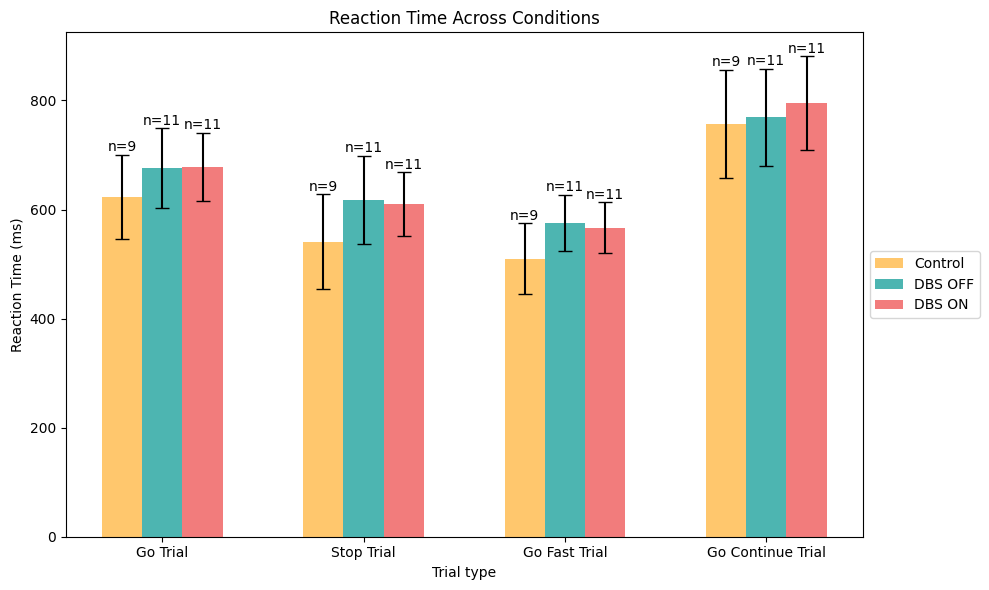

In [22]:
# Create plots to compare groups:
# Plot the mean RT for each trial type across the 3 groups:
trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
bar_width = 0.2
index = np.arange(len(trial_types))
opacity = 0.8

# Define conditions and corresponding dictionaries, but remove excluded subjects
conditions = {
    'control': {k: v for k, v in stats_CONTROL.items() if k not in excluded_subjects},
    'dbs_off': {k: v for k, v in stats_OFF.items() if k not in excluded_subjects},
    'dbs_on': {k: v for k, v in stats_ON.items() if k not in excluded_subjects}, 
    #'preop': {k: v for k, v in stats_PREOP.items() if k not in excluded_subjects}
}

# Initialize dictionaries to hold results for each condition
results = {condition: [] for condition in conditions.keys()}

# Loop through each condition and subject
for condition, data_dict in conditions.items():
    for subject_id, metrics in data_dict.items():
        # Retrieve the required metrics and store them in the result dictionary
        results[condition].append([
            metrics['go_trial mean RT (ms)'],
            metrics['stop_trial mean RT (ms)'],
            metrics['go_fast_trial mean RT (ms)'],
            metrics['go_continue_trial mean RT (ms)']
        ])

# Access data for each condition
control = results['control']
dbs_off = results['dbs_off']
dbs_on = results['dbs_on']
#preop = results['preop']

# Number of subjects in each condition
n_control = len(control)
n_dbs_off = len(dbs_off)
n_dbs_on = len(dbs_on)
#n_preop = len(preop)

# Calculate means and standard deviations for each condition
control_means = np.mean(control, axis=0)
control_std = np.std(control, axis=0)

dbs_off_means = np.mean(dbs_off, axis=0)
dbs_off_std = np.std(dbs_off, axis=0)

dbs_on_means = np.mean(dbs_on, axis=0)
dbs_on_std = np.std(dbs_on, axis=0)

# preop_means = np.mean(preop, axis = 0)
# preop_std = np.std(preop, axis = 0)

# Update error bars with standard deviations
error_control = control_std
error_dbs_off = dbs_off_std
error_dbs_on = dbs_on_std
#error_preop = preop_std

# Define plotting parameters
index = np.arange(len(control_means))  # Assuming each metric is a separate bar
bar_width = 0.2
opacity = 0.8

# Plot bars with error bars
plt.figure(figsize=(10, 6))

bar1 = plt.bar(index, control_means, bar_width, alpha=opacity, color='#ffba49', label='Control',
               yerr=error_control, capsize=5)
bar2 = plt.bar(index + bar_width, dbs_off_means, bar_width, alpha=opacity, color='#20a39e', label='DBS OFF',
               yerr=error_dbs_off, capsize=5)
bar3 = plt.bar(index + 2 * bar_width, dbs_on_means, bar_width, alpha=opacity, color='#ef5b5b', label='DBS ON',
               yerr=error_dbs_on, capsize=5)
#bar4 = plt.bar(index + 3 * bar_width, preop_means, bar_width, alpha=opacity, color='#8E7DBE', label='Pre-OP',
#               yerr=error_preop, capsize=5)

# Add subject count annotations on top of each bar
for i, (mean, std) in enumerate(zip(control_means, control_std)):
    plt.text(i, mean + std + 1, f'n={n_control}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_off_means, dbs_off_std)):
    plt.text(i + bar_width, mean + std + 1, f'n={n_dbs_off}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_on_means, dbs_on_std)):
    plt.text(i + 2 * bar_width, mean + std + 1, f'n={n_dbs_on}', ha='center', va='bottom', color='black')

# for i, (mean, std) in enumerate(zip(preop_means, preop_std)):
#     plt.text(i + 3 * bar_width, mean + std + 1, f'n={n_preop}', ha='center', va='bottom', color='black')


# Add labels, title, and legend
plt.xlabel('Trial type')
plt.ylabel('Reaction Time (ms)')
plt.title('Reaction Time Across Conditions')
plt.xticks(index + bar_width, ['Go Trial', 'Stop Trial', 'Go Fast Trial', 'Go Continue Trial'])
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.savefig(join(behav_results_saving_path, f"Reaction Time Across Conditions - Group level (all subjects).png"))


In [23]:
# Functions for Cohen's d
def cohen_d_independent(x1, x2):
    """Cohen's d for independent samples"""
    nx1, nx2 = len(x1), len(x2)
    s1, s2 = np.var(x1, ddof=1), np.var(x2, ddof=1)
    s_pooled = np.sqrt(((nx1-1)*s1 + (nx2-1)*s2) / (nx1 + nx2 - 2))
    return (np.mean(x1) - np.mean(x2)) / s_pooled

def cohen_d_paired(x1, x2):
    """Cohen's d for paired samples"""
    diff = x1 - x2
    return np.mean(diff) / np.std(diff, ddof=1)

# Prepare dataframe for stats
trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
results_list = []

for tt_idx, tt in enumerate(trial_types):
    # Gather data per trial type
    controls = np.array([metrics[tt_idx] for metrics in results['control']])
    patients_off = np.array([metrics[tt_idx] for metrics in results['dbs_off']])
    patients_on = np.array([metrics[tt_idx] for metrics in results['dbs_on']])

    # test normality using shapiro test
    shapiro_controls = scipy.stats.shapiro(controls)
    print(f'Shapiro test for controls in {tt}: W={shapiro_controls.statistic}, p={shapiro_controls.pvalue}')
    shapiro_patients_off = scipy.stats.shapiro(patients_off)
    print(f'Shapiro test for patients OFF in {tt}: W={shapiro_patients_off.statistic}, p={shapiro_patients_off.pvalue}')
    shapiro_patients_on = scipy.stats.shapiro(patients_on)
    print(f'Shapiro test for patients ON in {tt}: W={shapiro_patients_on.statistic}, p={shapiro_patients_on.pvalue}')
    
    # Disease effect: controls vs patients OFF
    t_disease, p_disease = scipy.stats.ttest_ind(controls, patients_off, equal_var=False)
    d_disease = cohen_d_independent(patients_off, controls)
    
    # DBS effect: patients OFF vs ON (paired)
    if len(patients_off) == len(patients_on):
        t_dbs, p_dbs = scipy.stats.ttest_rel(patients_on, patients_off)
        d_dbs = cohen_d_paired(patients_on, patients_off)
    else:
        t_dbs, p_dbs, d_dbs = np.nan, np.nan, np.nan
    
    results_list.append({
        'Trial_Type': tt,
        'Disease_t': t_disease,
        'Disease_p': p_disease,
        'Cohen_d_Disease': d_disease,
        'DBS_t': t_dbs,
        'DBS_p': p_dbs,
        'Cohen_d_DBS': d_dbs
    })

df_RT_results = pd.DataFrame(results_list)
df_RT_results


Shapiro test for controls in go_trial: W=0.8921963572502136, p=0.2101454883813858
Shapiro test for patients OFF in go_trial: W=0.9247882962226868, p=0.36055803298950195
Shapiro test for patients ON in go_trial: W=0.970018744468689, p=0.8867175579071045
Shapiro test for controls in stop_trial: W=0.9395790100097656, p=0.5774750709533691
Shapiro test for patients OFF in stop_trial: W=0.9197532534599304, p=0.3165905773639679
Shapiro test for patients ON in stop_trial: W=0.9260363578796387, p=0.3721587061882019
Shapiro test for controls in go_fast_trial: W=0.9703656435012817, p=0.8978388905525208
Shapiro test for patients OFF in go_fast_trial: W=0.9473151564598083, p=0.6098617315292358
Shapiro test for patients ON in go_fast_trial: W=0.8563699722290039, p=0.05166104435920715
Shapiro test for controls in go_continue_trial: W=0.9866759181022644, p=0.9897358417510986
Shapiro test for patients OFF in go_continue_trial: W=0.9365686178207397, p=0.4810366928577423
Shapiro test for patients ON in g

,Trial_Type,Disease_t,Disease_p,Cohen_d_Disease,DBS_t,DBS_p,Cohen_d_DBS
0,go_trial,-1.461995,0.162244,0.661334,0.265910,0.795711,0.080175
1,stop_trial,-1.925150,0.071594,0.873260,-0.486986,0.636766,-0.146832
2,go_fast_trial,-2.324591,0.034460,1.070990,-0.428237,0.677556,-0.129118
3,go_continue_trial,-0.265232,0.794163,0.120680,1.001097,0.340388,0.301842


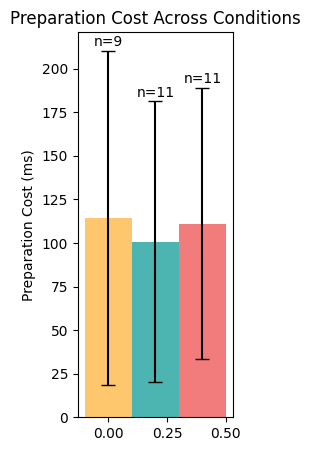

In [22]:
# Create plots to compare groups:
# Plot the mean RT for each trial type across the 3 groups:
# trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
bar_width = 0.2
index = 0 #np.arange(len(trial_types))
opacity = 0.8

# Define conditions and corresponding dictionaries, but remove excluded subjects
conditions = {
    'control': {k: v for k, v in stats_CONTROL.items() if k not in excluded_subjects},
    'dbs_off': {k: v for k, v in stats_OFF.items() if k not in excluded_subjects},
    'dbs_on': {k: v for k, v in stats_ON.items() if k not in excluded_subjects}, 
    #'preop': {k: v for k, v in stats_PREOP.items() if k not in excluded_subjects}
}

# Initialize dictionaries to hold results for each condition
results = {condition: [] for condition in conditions.keys()}

# Loop through each condition and subject
for condition, data_dict in conditions.items():
    for subject_id, metrics in data_dict.items():
        # Retrieve the required metrics and store them in the result dictionary
        results[condition].append([
            metrics['go_trial mean RT (ms)'] - metrics['go_fast_trial mean RT (ms)'],
        ])

# Access data for each condition
control = results['control']
dbs_off = results['dbs_off']
dbs_on = results['dbs_on']
#preop = results['preop']

# Number of subjects in each condition
n_control = len(control)
n_dbs_off = len(dbs_off)
n_dbs_on = len(dbs_on)
#n_preop = len(preop)

# Calculate means and standard deviations for each condition
control_means = np.mean(control, axis=0)
control_std = np.std(control, axis=0)

dbs_off_means = np.mean(dbs_off, axis=0)
dbs_off_std = np.std(dbs_off, axis=0)

dbs_on_means = np.mean(dbs_on, axis=0)
dbs_on_std = np.std(dbs_on, axis=0)

# preop_means = np.mean(preop, axis = 0)
# preop_std = np.std(preop, axis = 0)

# Update error bars with standard deviations
error_control = control_std
error_dbs_off = dbs_off_std
error_dbs_on = dbs_on_std
#error_preop = preop_std

# Define plotting parameters
#index = np.arange(len(control_means))  # Assuming each metric is a separate bar
bar_width = 0.2
opacity = 0.8

# Plot bars with error bars
plt.figure(figsize=(2, 5))

bar1 = plt.bar(index, control_means, bar_width, alpha=opacity, color='#ffba49', label='Control',
               yerr=error_control, capsize=5)
bar2 = plt.bar(index + bar_width, dbs_off_means, bar_width, alpha=opacity, color='#20a39e', label='DBS OFF',
               yerr=error_dbs_off, capsize=5)
bar3 = plt.bar(index + 2 * bar_width, dbs_on_means, bar_width, alpha=opacity, color='#ef5b5b', label='DBS ON',
               yerr=error_dbs_on, capsize=5)
#bar4 = plt.bar(index + 3 * bar_width, preop_means, bar_width, alpha=opacity, color='#8E7DBE', label='Pre-OP',
#               yerr=error_preop, capsize=5)

# Add subject count annotations on top of each bar
for i, (mean, std) in enumerate(zip(control_means, control_std)):
    plt.text(i, mean + std + 1, f'n={n_control}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_off_means, dbs_off_std)):
    plt.text(i + bar_width, mean + std + 1, f'n={n_dbs_off}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_on_means, dbs_on_std)):
    plt.text(i + 2 * bar_width, mean + std + 1, f'n={n_dbs_on}', ha='center', va='bottom', color='black')

# for i, (mean, std) in enumerate(zip(preop_means, preop_std)):
#     plt.text(i + 3 * bar_width, mean + std + 1, f'n={n_preop}', ha='center', va='bottom', color='black')


# Add labels, title, and legend
#plt.xlabel('Trial type')
plt.ylabel('Preparation Cost (ms)')
plt.title('Preparation Cost Across Conditions')
plt.xticks(ticks=None)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

#plt.tight_layout()
plt.savefig(join(behav_results_saving_path, f"Preparation Cost Across Conditions - Group level (all subjects).png"))


In [23]:
# Functions for Cohen's d
def cohen_d_independent(x1, x2):
    """Cohen's d for independent samples"""
    nx1, nx2 = len(x1), len(x2)
    s1, s2 = np.var(x1, ddof=1), np.var(x2, ddof=1)
    s_pooled = np.sqrt(((nx1-1)*s1 + (nx2-1)*s2) / (nx1 + nx2 - 2))
    return (np.mean(x1) - np.mean(x2)) / s_pooled

def cohen_d_paired(x1, x2):
    """Cohen's d for paired samples"""
    diff = x1 - x2
    return np.mean(diff) / np.std(diff, ddof=1)

# Prepare dataframe for stats
# trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
results_list = []

# for tt_idx, tt in enumerate(trial_types):
# Gather data
controls = np.array(results['control']).flatten()
patients_off = np.array(results['dbs_off']).flatten()
patients_on = np.array(results['dbs_on']).flatten()

# test normality using shapiro test
shapiro_controls = scipy.stats.shapiro(controls)
print(f'Shapiro test for controls in {tt}: W={shapiro_controls.statistic}, p={shapiro_controls.pvalue}')
shapiro_patients_off = scipy.stats.shapiro(patients_off)
print(f'Shapiro test for patients OFF in {tt}: W={shapiro_patients_off.statistic}, p={shapiro_patients_off.pvalue}')
shapiro_patients_on = scipy.stats.shapiro(patients_on)
print(f'Shapiro test for patients ON in {tt}: W={shapiro_patients_on.statistic}, p={shapiro_patients_on.pvalue}')

# Disease effect: controls vs patients OFF
t_disease, p_disease = scipy.stats.ttest_ind(controls, patients_off, equal_var=False)
d_disease = cohen_d_independent(patients_off, controls)

# DBS effect: patients OFF vs ON (paired)
if len(patients_off) == len(patients_on):
    t_dbs, p_dbs = scipy.stats.ttest_rel(patients_on, patients_off)
    d_dbs = cohen_d_paired(patients_on, patients_off)
else:
    t_dbs, p_dbs, d_dbs = np.nan, np.nan, np.nan

results_list.append({
    #'Trial_Type': tt,
    'Disease_t': t_disease,
    'Disease_p': p_disease,
    'Cohen_d_Disease': d_disease,
    'DBS_t': t_dbs,
    'DBS_p': p_dbs,
    'Cohen_d_DBS': d_dbs
})

df_RT_results = pd.DataFrame(results_list)
df_RT_results


Shapiro test for controls in go_continue_trial: W=0.9112390875816345, p=0.3246440589427948
Shapiro test for patients OFF in go_continue_trial: W=0.965180516242981, p=0.8341706991195679
Shapiro test for patients ON in go_continue_trial: W=0.9733778834342957, p=0.9184409976005554


,Disease_t,Disease_p,Cohen_d_Disease,DBS_t,DBS_p,Cohen_d_DBS
0,0.320138,0.753113,-0.14672,0.618766,0.549905,0.186565


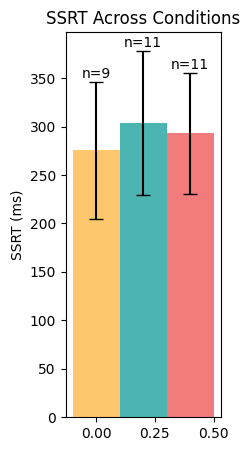

In [24]:
# Create plots to compare groups:
# Plot the mean RT for each trial type across the 3 groups:
# trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
bar_width = 0.2
index = 0 #np.arange(len(trial_types))
opacity = 0.8

# Define conditions and corresponding dictionaries, but remove excluded subjects
conditions = {
    'control': {k: v for k, v in stats_CONTROL.items() if k not in excluded_subjects},
    'dbs_off': {k: v for k, v in stats_OFF.items() if k not in excluded_subjects},
    'dbs_on': {k: v for k, v in stats_ON.items() if k not in excluded_subjects}, 
    #'preop': {k: v for k, v in stats_PREOP.items() if k not in excluded_subjects}
}

# Initialize dictionaries to hold results for each condition
results = {condition: [] for condition in conditions.keys()}

# Loop through each condition and subject
for condition, data_dict in conditions.items():
    for subject_id, metrics in data_dict.items():
        # Retrieve the required metrics and store them in the result dictionary
        results[condition].append([
            metrics['SSRT (ms)'],
        ])

# Access data for each condition
control = results['control']
dbs_off = results['dbs_off']
dbs_on = results['dbs_on']
#preop = results['preop']

# Number of subjects in each condition
n_control = len(control)
n_dbs_off = len(dbs_off)
n_dbs_on = len(dbs_on)
#n_preop = len(preop)

# Calculate means and standard deviations for each condition
control_means = np.mean(control, axis=0)
control_std = np.std(control, axis=0)

dbs_off_means = np.mean(dbs_off, axis=0)
dbs_off_std = np.std(dbs_off, axis=0)

dbs_on_means = np.mean(dbs_on, axis=0)
dbs_on_std = np.std(dbs_on, axis=0)

# preop_means = np.mean(preop, axis = 0)
# preop_std = np.std(preop, axis = 0)

# Update error bars with standard deviations
error_control = control_std
error_dbs_off = dbs_off_std
error_dbs_on = dbs_on_std
#error_preop = preop_std

# Define plotting parameters
#index = np.arange(len(control_means))  # Assuming each metric is a separate bar
bar_width = 0.2
opacity = 0.8

# Plot bars with error bars
plt.figure(figsize=(2, 5))

bar1 = plt.bar(index, control_means, bar_width, alpha=opacity, color='#ffba49', label='Control',
               yerr=error_control, capsize=5)
bar2 = plt.bar(index + bar_width, dbs_off_means, bar_width, alpha=opacity, color='#20a39e', label='DBS OFF',
               yerr=error_dbs_off, capsize=5)
bar3 = plt.bar(index + 2 * bar_width, dbs_on_means, bar_width, alpha=opacity, color='#ef5b5b', label='DBS ON',
               yerr=error_dbs_on, capsize=5)
#bar4 = plt.bar(index + 3 * bar_width, preop_means, bar_width, alpha=opacity, color='#8E7DBE', label='Pre-OP',
#               yerr=error_preop, capsize=5)

# Add subject count annotations on top of each bar
for i, (mean, std) in enumerate(zip(control_means, control_std)):
    plt.text(i, mean + std + 1, f'n={n_control}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_off_means, dbs_off_std)):
    plt.text(i + bar_width, mean + std + 1, f'n={n_dbs_off}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_on_means, dbs_on_std)):
    plt.text(i + 2 * bar_width, mean + std + 1, f'n={n_dbs_on}', ha='center', va='bottom', color='black')

# for i, (mean, std) in enumerate(zip(preop_means, preop_std)):
#     plt.text(i + 3 * bar_width, mean + std + 1, f'n={n_preop}', ha='center', va='bottom', color='black')


# Add labels, title, and legend
#plt.xlabel('Trial type')
plt.ylabel('SSRT (ms)')
plt.title('SSRT Across Conditions')
plt.xticks(ticks=None)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

#plt.tight_layout()
plt.savefig(join(behav_results_saving_path, f"SSRT Across Conditions - Group level (all subjects).png"))


In [25]:
# Functions for Cohen's d
def cohen_d_independent(x1, x2):
    """Cohen's d for independent samples"""
    nx1, nx2 = len(x1), len(x2)
    s1, s2 = np.var(x1, ddof=1), np.var(x2, ddof=1)
    s_pooled = np.sqrt(((nx1-1)*s1 + (nx2-1)*s2) / (nx1 + nx2 - 2))
    return (np.mean(x1) - np.mean(x2)) / s_pooled

def cohen_d_paired(x1, x2):
    """Cohen's d for paired samples"""
    diff = x1 - x2
    return np.mean(diff) / np.std(diff, ddof=1)

# Prepare dataframe for stats
# trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
results_list = []

# for tt_idx, tt in enumerate(trial_types):
# Gather data
controls = np.array(results['control']).flatten()
patients_off = np.array(results['dbs_off']).flatten()
patients_on = np.array(results['dbs_on']).flatten()

# test normality using shapiro test
shapiro_controls = scipy.stats.shapiro(controls)
print(f'Shapiro test for controls in {tt}: W={shapiro_controls.statistic}, p={shapiro_controls.pvalue}')
shapiro_patients_off = scipy.stats.shapiro(patients_off)
print(f'Shapiro test for patients OFF in {tt}: W={shapiro_patients_off.statistic}, p={shapiro_patients_off.pvalue}')
shapiro_patients_on = scipy.stats.shapiro(patients_on)
print(f'Shapiro test for patients ON in {tt}: W={shapiro_patients_on.statistic}, p={shapiro_patients_on.pvalue}')

# Disease effect: controls vs patients OFF
t_disease, p_disease = scipy.stats.ttest_ind(controls, patients_off, equal_var=False)
d_disease = cohen_d_independent(patients_off, controls)

# DBS effect: patients OFF vs ON (paired)
if len(patients_off) == len(patients_on):
    t_dbs, p_dbs = scipy.stats.ttest_rel(patients_on, patients_off)
    d_dbs = cohen_d_paired(patients_on, patients_off)
else:
    t_dbs, p_dbs, d_dbs = np.nan, np.nan, np.nan

results_list.append({
    #'Trial_Type': tt,
    'Disease_t': t_disease,
    'Disease_p': p_disease,
    'Cohen_d_Disease': d_disease,
    'DBS_t': t_dbs,
    'DBS_p': p_dbs,
    'Cohen_d_DBS': d_dbs
})

df_RT_results = pd.DataFrame(results_list)
df_RT_results


Shapiro test for controls in go_continue_trial: W=0.928691565990448, p=0.4689887464046478
Shapiro test for patients OFF in go_continue_trial: W=0.9515164494514465, p=0.6633824706077576
Shapiro test for patients ON in go_continue_trial: W=0.9421716332435608, p=0.5463553667068481


,Disease_t,Disease_p,Cohen_d_Disease,DBS_t,DBS_p,Cohen_d_DBS
0,-0.818888,0.423873,0.366497,-0.6448,0.533569,-0.194414


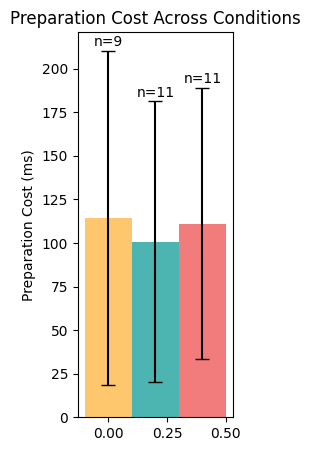

In [26]:
# Create plots to compare groups:
# Plot the mean RT for each trial type across the 3 groups:
# trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
bar_width = 0.2
index = 0 #np.arange(len(trial_types))
opacity = 0.8

# Define conditions and corresponding dictionaries, but remove excluded subjects
conditions = {
    'control': {k: v for k, v in stats_CONTROL.items() if k not in excluded_subjects},
    'dbs_off': {k: v for k, v in stats_OFF.items() if k not in excluded_subjects},
    'dbs_on': {k: v for k, v in stats_ON.items() if k not in excluded_subjects}, 
    #'preop': {k: v for k, v in stats_PREOP.items() if k not in excluded_subjects}
}

# Initialize dictionaries to hold results for each condition
results = {condition: [] for condition in conditions.keys()}

# Loop through each condition and subject
for condition, data_dict in conditions.items():
    for subject_id, metrics in data_dict.items():
        # Retrieve the required metrics and store them in the result dictionary
        results[condition].append([
            metrics['go_trial mean RT (ms)'] - metrics['go_fast_trial mean RT (ms)'],
        ])

# Access data for each condition
control = results['control']
dbs_off = results['dbs_off']
dbs_on = results['dbs_on']
#preop = results['preop']

# Number of subjects in each condition
n_control = len(control)
n_dbs_off = len(dbs_off)
n_dbs_on = len(dbs_on)
#n_preop = len(preop)

# Calculate means and standard deviations for each condition
control_means = np.mean(control, axis=0)
control_std = np.std(control, axis=0)

dbs_off_means = np.mean(dbs_off, axis=0)
dbs_off_std = np.std(dbs_off, axis=0)

dbs_on_means = np.mean(dbs_on, axis=0)
dbs_on_std = np.std(dbs_on, axis=0)

# preop_means = np.mean(preop, axis = 0)
# preop_std = np.std(preop, axis = 0)

# Update error bars with standard deviations
error_control = control_std
error_dbs_off = dbs_off_std
error_dbs_on = dbs_on_std
#error_preop = preop_std

# Define plotting parameters
#index = np.arange(len(control_means))  # Assuming each metric is a separate bar
bar_width = 0.2
opacity = 0.8

# Plot bars with error bars
plt.figure(figsize=(2, 5))

bar1 = plt.bar(index, control_means, bar_width, alpha=opacity, color='#ffba49', label='Control',
               yerr=error_control, capsize=5)
bar2 = plt.bar(index + bar_width, dbs_off_means, bar_width, alpha=opacity, color='#20a39e', label='DBS OFF',
               yerr=error_dbs_off, capsize=5)
bar3 = plt.bar(index + 2 * bar_width, dbs_on_means, bar_width, alpha=opacity, color='#ef5b5b', label='DBS ON',
               yerr=error_dbs_on, capsize=5)
#bar4 = plt.bar(index + 3 * bar_width, preop_means, bar_width, alpha=opacity, color='#8E7DBE', label='Pre-OP',
#               yerr=error_preop, capsize=5)

# Add subject count annotations on top of each bar
for i, (mean, std) in enumerate(zip(control_means, control_std)):
    plt.text(i, mean + std + 1, f'n={n_control}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_off_means, dbs_off_std)):
    plt.text(i + bar_width, mean + std + 1, f'n={n_dbs_off}', ha='center', va='bottom', color='black')

for i, (mean, std) in enumerate(zip(dbs_on_means, dbs_on_std)):
    plt.text(i + 2 * bar_width, mean + std + 1, f'n={n_dbs_on}', ha='center', va='bottom', color='black')

# for i, (mean, std) in enumerate(zip(preop_means, preop_std)):
#     plt.text(i + 3 * bar_width, mean + std + 1, f'n={n_preop}', ha='center', va='bottom', color='black')


# Add labels, title, and legend
#plt.xlabel('Trial type')
plt.ylabel('Preparation Cost (ms)')
plt.title('Preparation Cost Across Conditions')
plt.xticks(ticks=None)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

#plt.tight_layout()
plt.savefig(join(behav_results_saving_path, f"Preparation Cost Across Conditions - Group level (all subjects).png"))


In [27]:
from collections import defaultdict
# Step 1: Organize sessions by subject ID
subject_sessions = defaultdict(list)
for subj in included_subjects:
    if subj.startswith("sub"):
        subj_id = subj.split()[0]
        subject_sessions[subj_id].append(subj)

# Step 2: Normalize excluded list by subject ID
excluded_ids = set(s.split()[0] for s in excluded_subjects)

# Step 3: Update excluded list to include both sessions (ON and OFF) or all if only one
final_excluded_subjects = set()
for subj_id in excluded_ids:
    sessions = subject_sessions.get(subj_id, [])
    final_excluded_subjects.update(sessions)

# Step 4: Also exclude subjects with only one session
for subj_id, sessions in subject_sessions.items():
    if len(sessions) == 1:
        final_excluded_subjects.update(sessions)

# Optional: Convert to sorted list for readability
final_excluded_subjects = sorted(final_excluded_subjects)

# Output
print("Final excluded subjects:")
for s in final_excluded_subjects:
    print(s)

Final excluded subjects:
sub008 DBS OFF mSST
sub008 DBS ON mSST
sub009 DBS OFF mSST
sub009 DBS ON mSST
sub017 DBS OFF mSST
sub017 DBS ON mSST
sub021 DBS OFF mSST
sub021 DBS ON mSST
sub024 DBS OFF mSST
sub024 DBS ON mSST


In [28]:
final_included_subjects = [s for s in included_subjects if s not in final_excluded_subjects]
final_included_subjects
# Save the final included subjects to a JSON file
with open(join(behav_results_saving_path, 'final_included_subjects.json'), 'w') as f:
    json.dump(final_included_subjects, f, indent=4)
    

In [29]:
final_included_subjects

['C003 mSST',
 'C004 mSST',
 'C006 mSST',
 'C007 mSST',
 'C008 mSST',
 'C009 mSST',
 'C010 mSST',
 'C011 mSST',
 'C012 mSST',
 'sub006 DBS ON mSST',
 'sub006 DBS OFF mSST',
 'sub011 DBS OFF mSST',
 'sub011 DBS ON mSST',
 'sub015 DBS OFF mSST',
 'sub015 DBS ON mSST',
 'sub019 DBS ON mSST',
 'sub019 DBS OFF mSST',
 'sub023 DBS OFF mSST',
 'sub023 DBS ON mSST',
 'sub025 DBS ON mSST',
 'sub025 DBS OFF mSST',
 'sub027 DBS ON mSST',
 'sub027 DBS OFF mSST',
 'sub028 DBS OFF mSST',
 'sub028 DBS ON mSST',
 'sub029 DBS ON mSST',
 'sub029 DBS OFF mSST',
 'sub032 DBS ON mSST',
 'sub032 DBS OFF mSST',
 'sub033 DBS ON mSST',
 'sub033 DBS OFF mSST']

## Plot performance per trial type and per subject ##

[0 1 2 3]


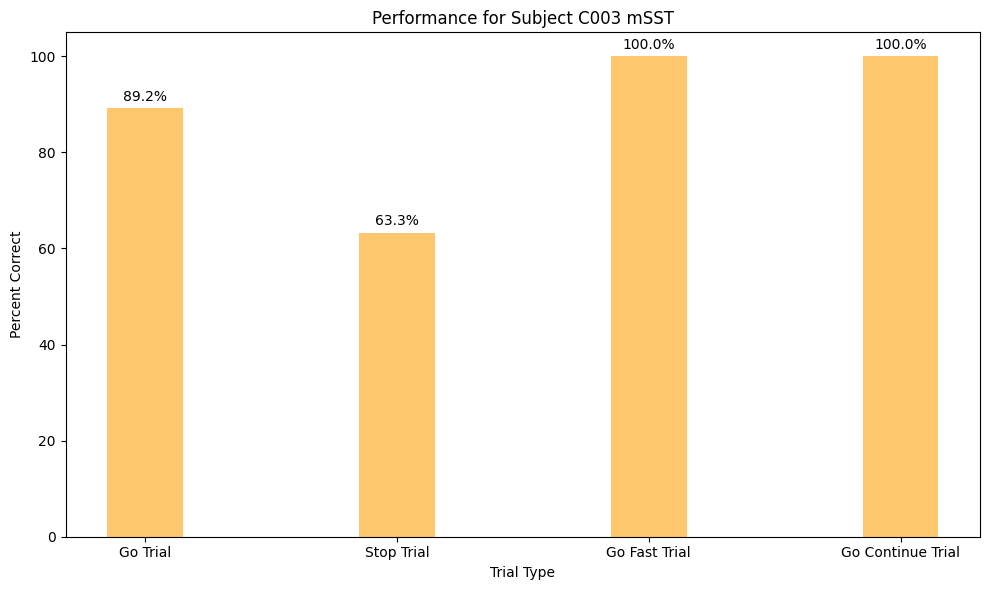

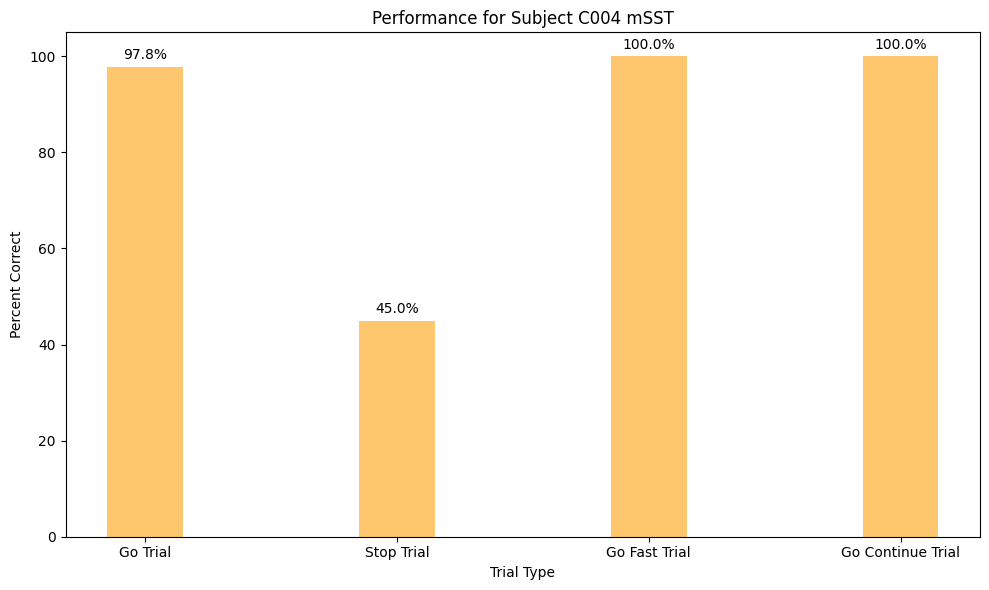

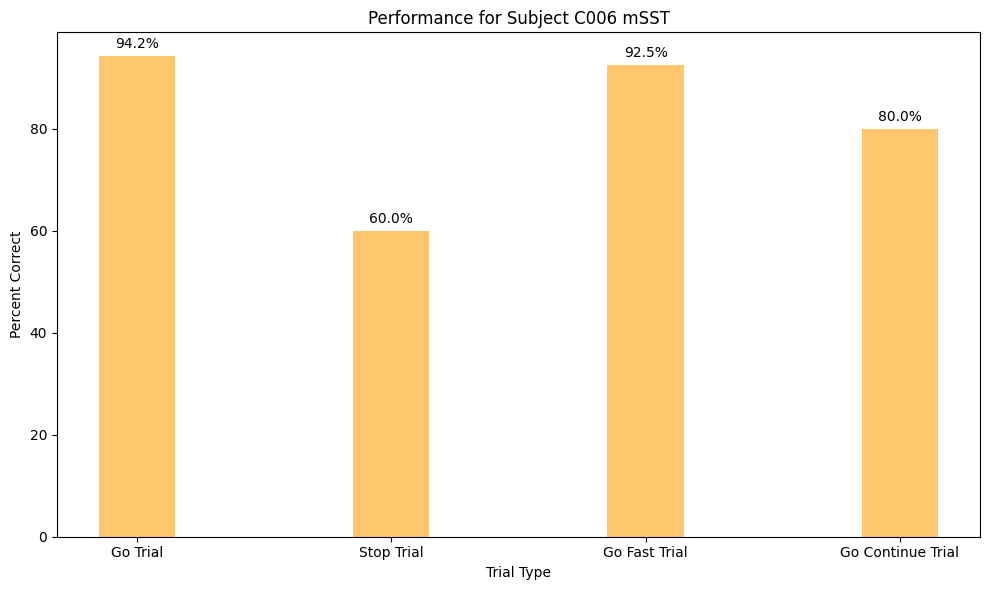

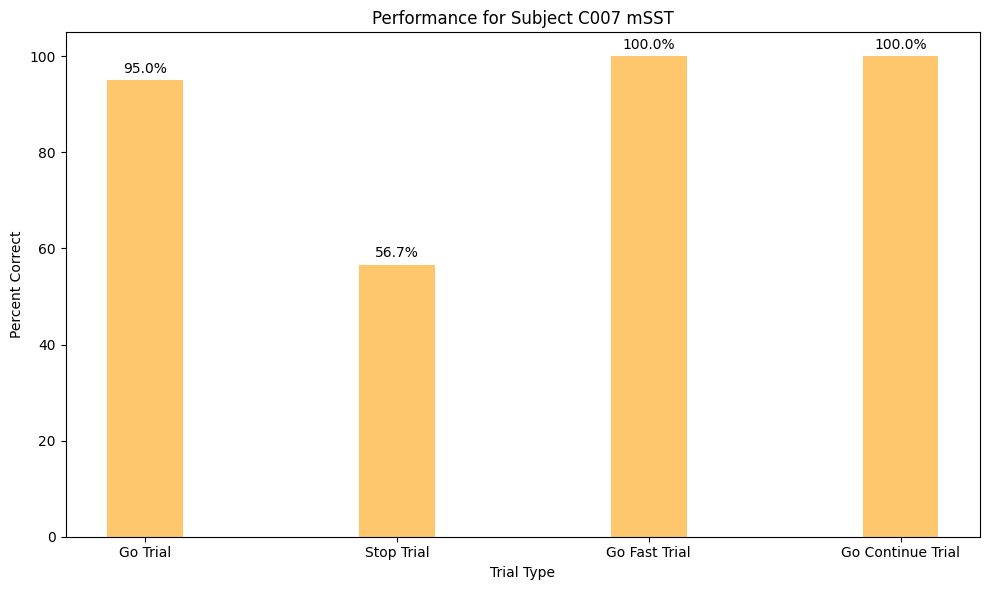

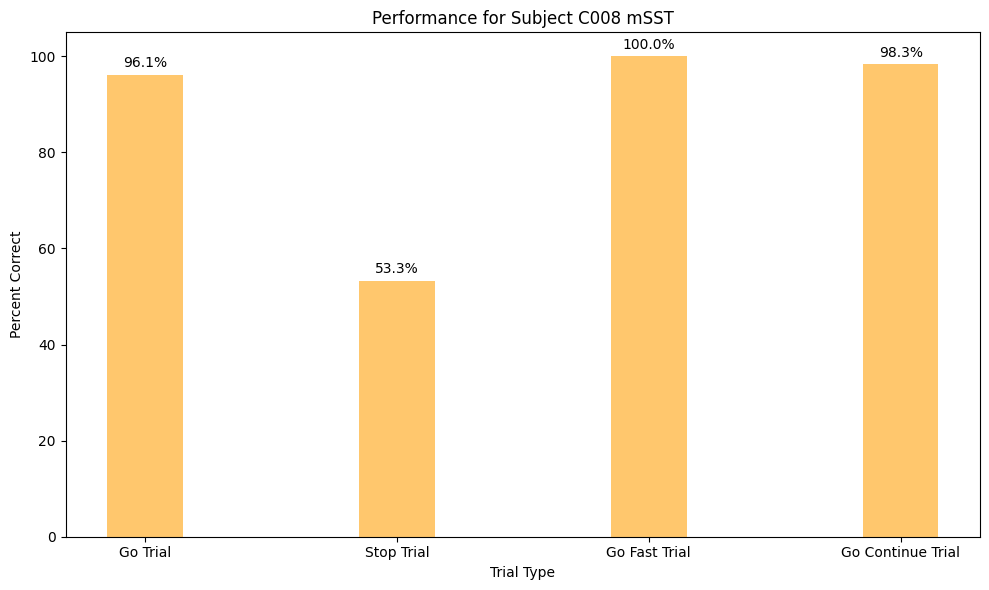

...

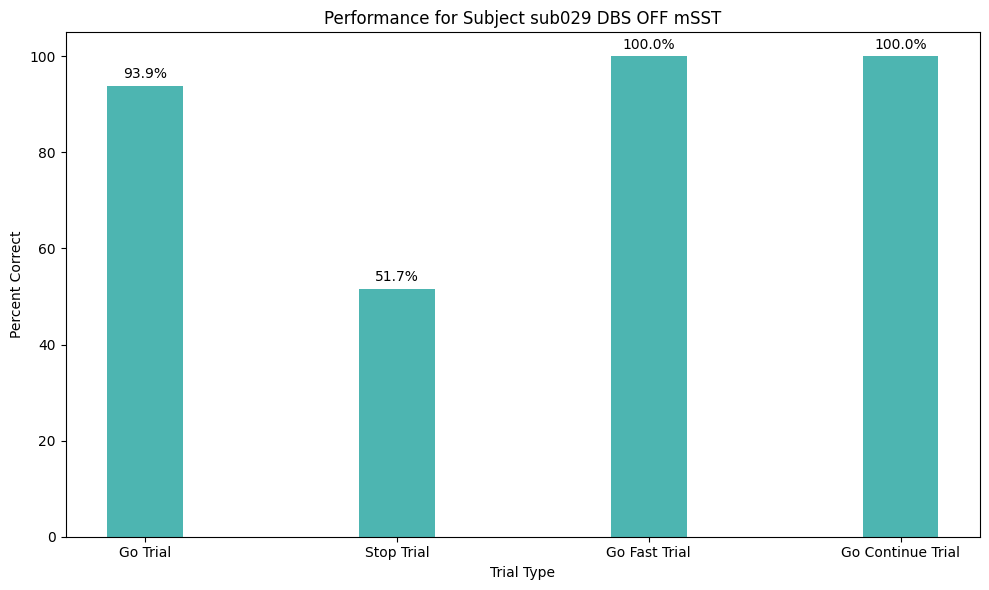

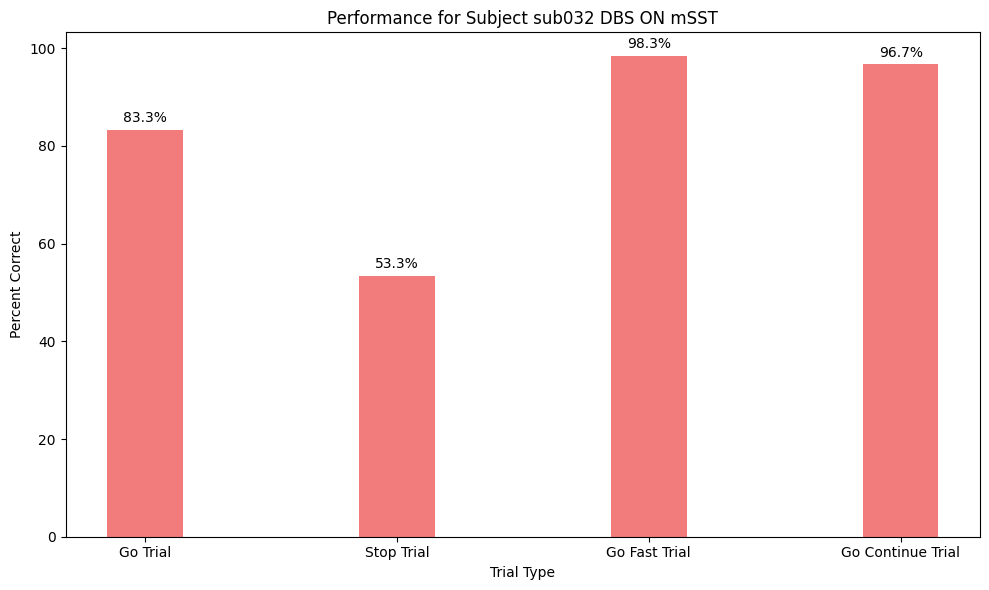

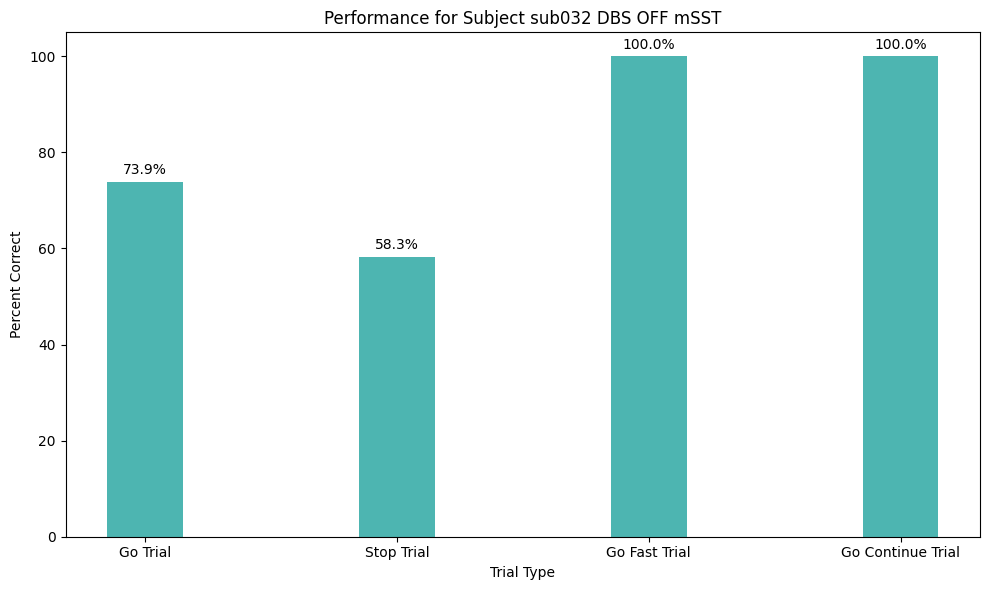

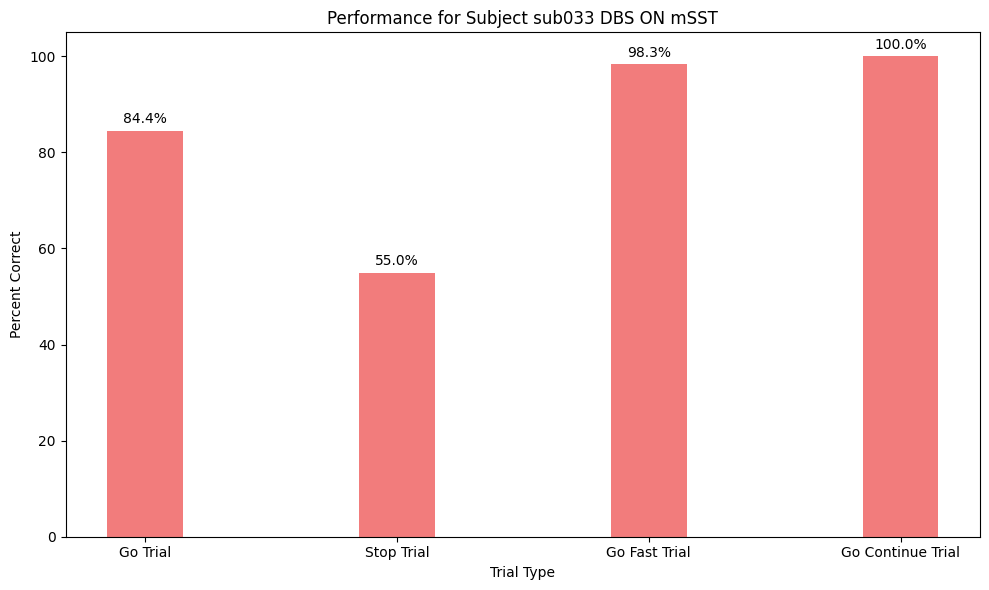

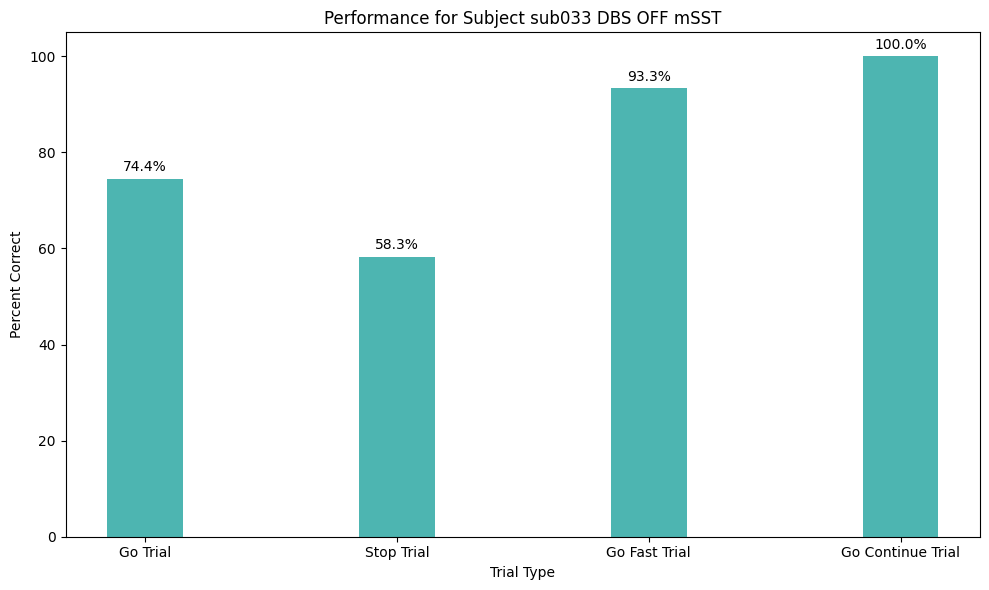

In [30]:
# Define trial types and bar width
trial_types = ['go_trial', 'stop_trial', 'go_fast_trial', 'go_continue_trial']
bar_width = 0.3
index = np.arange(len(trial_types))
print(index)
opacity = 0.8

# Access data for a single subject 
for subject_id in final_included_subjects:
    # Retrieve values for each trial type
    if subject_id.startswith('C'):
        condition = 'control'
    elif subject_id.startswith('preop'):
        condition = 'preop'
    elif 'OFF' in subject_id:
        condition = 'dbs_off'
    elif 'ON' in subject_id:
        condition = 'dbs_on'

    values = single_subject[subject_id]
    results_dict[subject_id]['go success rate'] = values[0]
    results_dict[subject_id]['stop success rate'] = values[1]
    results_dict[subject_id]['go fast success rate'] = values[2]
    results_dict[subject_id]['go continue success rate'] = values[3]

    # Plot bars for each condition
    plt.figure(figsize=(10, 6))

    plt.bar(index, values, bar_width, alpha=opacity, color=color_dict[condition], label='control', capsize=5)

    for i, (val) in enumerate(values):
        plt.text(x=i, y=val + 1, s=f'{val:.1f}%', ha='center', va='bottom', color='black')

    # Add labels, title, and legend
    plt.xlabel('Trial Type')
    plt.ylabel('Percent Correct')
    plt.title(f'Performance for Subject {subject_id}')
    plt.xticks(index, ['Go Trial', 'Stop Trial', 'Go Fast Trial', 'Go Continue Trial'])
    #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    plt.tight_layout()
    plt.savefig(join(behav_results_saving_path, f"Performance for {subject_id}.png"))
    plt.show()

In [31]:
# filter the results_dict to keep only the final included subjects
filtered_results_dict = {subj: results_dict[subj] for subj in final_included_subjects}

In [32]:
# Convert to DataFrame
df = pd.DataFrame.from_dict(filtered_results_dict, orient='index')

# Reset index and rename the first column to 'subject'
df.reset_index(inplace=True)
df.rename(columns={'index': 'subject'}, inplace=True)

# Display the DataFrame
print(df)

                subject independance test used  p-value independance  \
0             C003 mSST    Mann-Whitney U test              0.918472   
1             C004 mSST    Mann-Whitney U test              0.999998   
2             C006 mSST    Mann-Whitney U test              0.987165   
3             C007 mSST    Mann-Whitney U test              0.999906   
4             C008 mSST    Mann-Whitney U test              0.998836   
5             C009 mSST    Mann-Whitney U test              0.999998   
6             C010 mSST    Mann-Whitney U test              0.949472   
7             C011 mSST    Mann-Whitney U test              0.984936   
8             C012 mSST    Mann-Whitney U test              0.997153   
9    sub006 DBS ON mSST    Mann-Whitney U test              0.950186   
10  sub006 DBS OFF mSST                 t-test              1.000000   
11  sub011 DBS OFF mSST    Mann-Whitney U test              0.870966   
12   sub011 DBS ON mSST    Mann-Whitney U test              0.99

In [33]:
# Compute mean and standard deviation of "go success rate"
mean_go_success = df["go success rate"].mean()
std_go_success = df["go success rate"].std()
#threshold = mean_go_success - std_go_success
threshold = 75  # Use a threshold of 75% as reported in other papers

# Apply the inclusion criteria
df["included"] = df.apply(lambda row: "Yes" if (row["p-value independance"] > 0.1) and 
                                               (row["go success rate"] > threshold) else "No", axis=1)

# Save to an Excel file
df.to_excel(join(behav_results_saving_path,"output.xlsx"), index=False)

## reproducing one mode analysis from Mario Hervault et al 2021 ##
"In addition, due to the SSD increment procedure, the resulting p(respond|signal) must not differ from 0.50 to estimate the RT STOP value correctly (Verbruggen & Logan, 2008). This was the case for both the pressing (t(39) = 0.43, p > .50) and the swiping type (t(39) = 0.46, p > .50)."

They computed p(respond|signal) for each participant — that is, the number of failed STOP trials / total STOP trials — and then performed a one-sample t-test against the reference value 0.5.

t(30) = -7.34, p = 0.0000000351


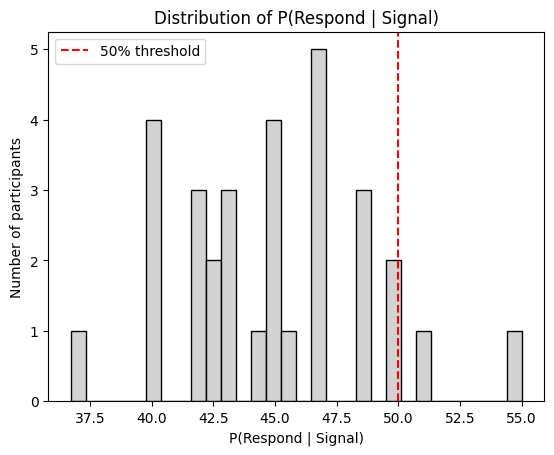

In [34]:
p_respond = []
for sub in final_included_subjects:
    p_respond.append(100-stats[sub]['percent correct stop_trial'])
# Test if the mean is different from 0.5
t_stat, p_val = scipy.stats.ttest_1samp(p_respond, popmean=50)

print(f"t({len(p_respond)-1}) = {t_stat:.2f}, p = {p_val:.10f}")
plt.hist(p_respond, bins=30, color='lightgray', edgecolor='black')
plt.axvline(x=50, color='red', linestyle='--', label='50% threshold')
plt.xlabel('P(Respond | Signal)')
plt.ylabel('Number of participants')
plt.title('Distribution of P(Respond | Signal)')
plt.legend()

# 4. Check that no inhibition is triggered by the "CONTINUE" signal #

Data appears normally distributed (p = 0.07617884874343872 )
Data does NOT appear normal (p = 0.029788749292492867 )


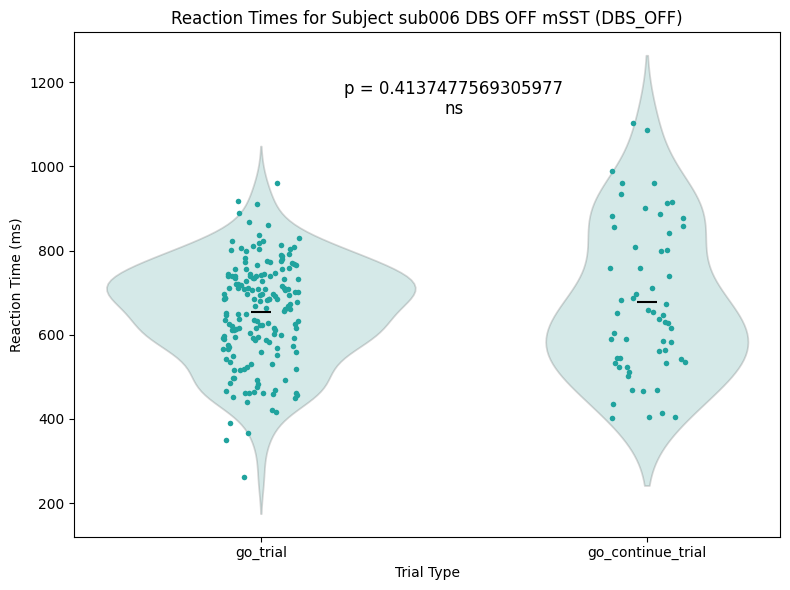

Data does NOT appear normal (p = 1.817805696191499e-06 )
Data does NOT appear normal (p = 0.008767715655267239 )


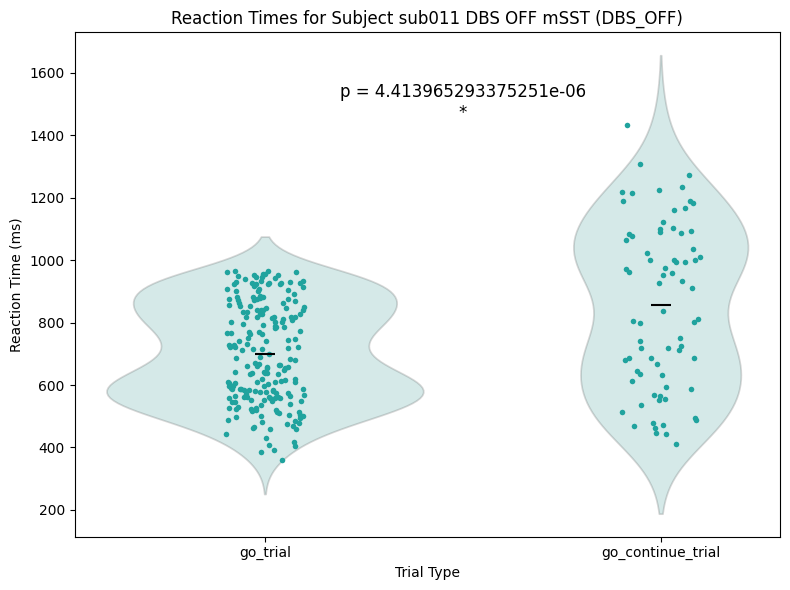

Data does NOT appear normal (p = 0.04102033004164696 )
Data appears normally distributed (p = 0.9904060363769531 )


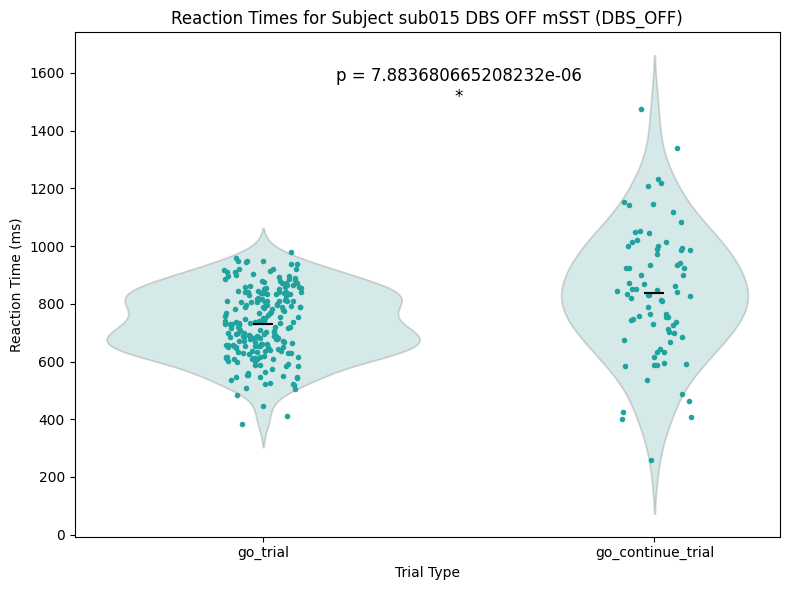

Data does NOT appear normal (p = 0.0005859831580892205 )
Data does NOT appear normal (p = 0.0011372938752174377 )


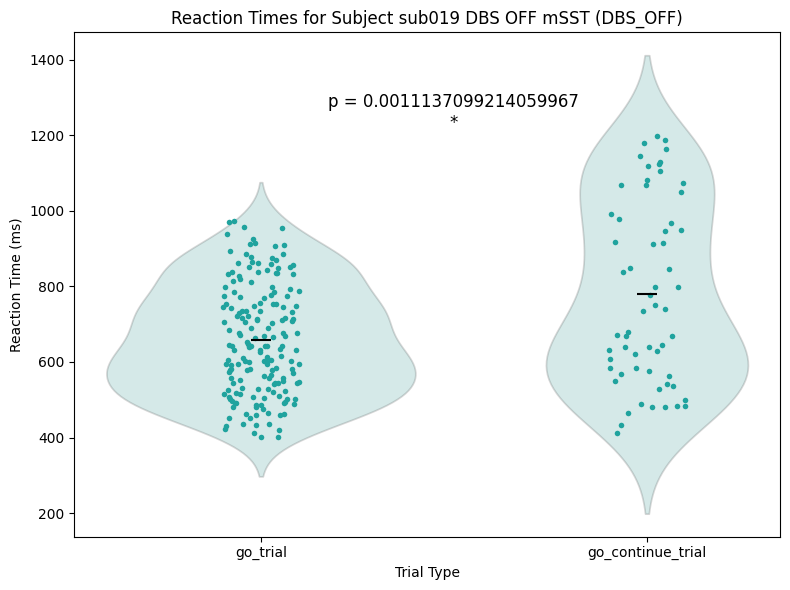

Data does NOT appear normal (p = 0.041696906089782715 )
Data does NOT appear normal (p = 0.012653708457946777 )


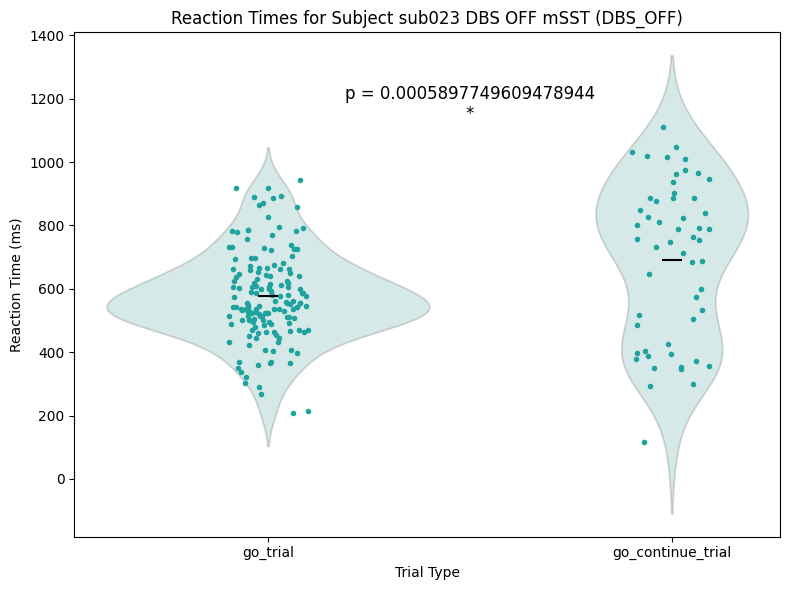

Data does NOT appear normal (p = 0.0063620987348258495 )
Data does NOT appear normal (p = 0.005731132812798023 )


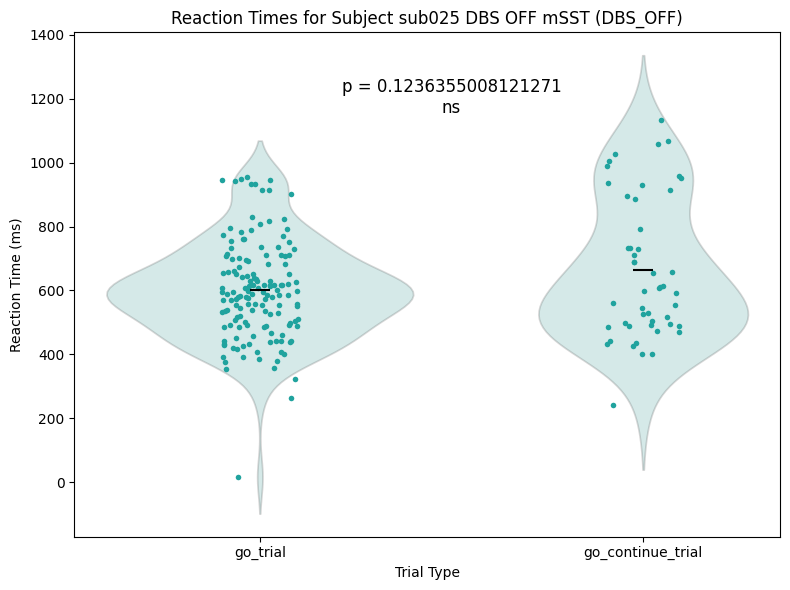

Data does NOT appear normal (p = 0.01113541703671217 )
Data does NOT appear normal (p = 0.002001615474000573 )


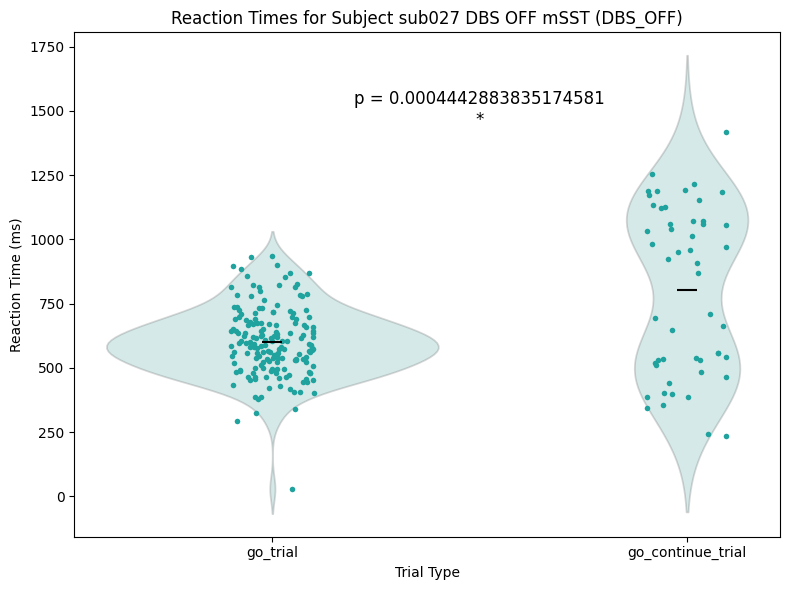

Data appears normally distributed (p = 0.27494919300079346 )
Data appears normally distributed (p = 0.2973431944847107 )


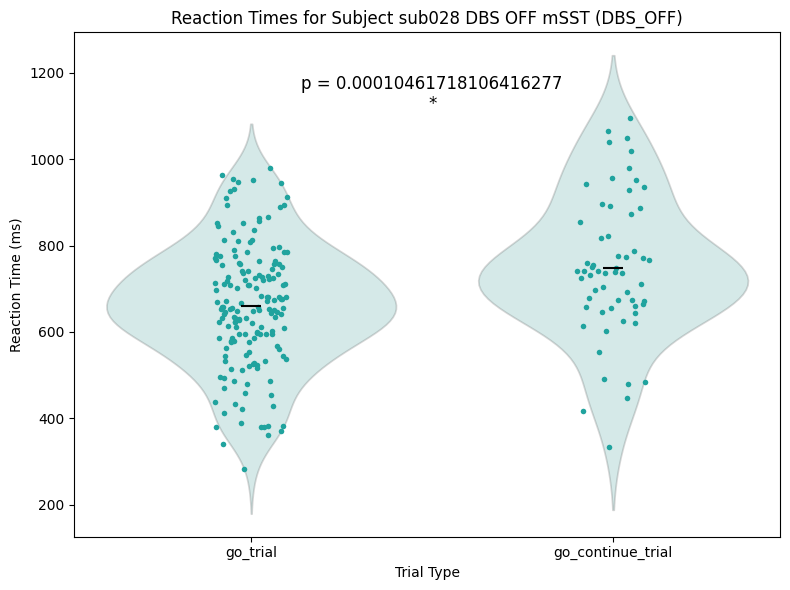

Data appears normally distributed (p = 0.3892848491668701 )
Data appears normally distributed (p = 0.5459502339363098 )


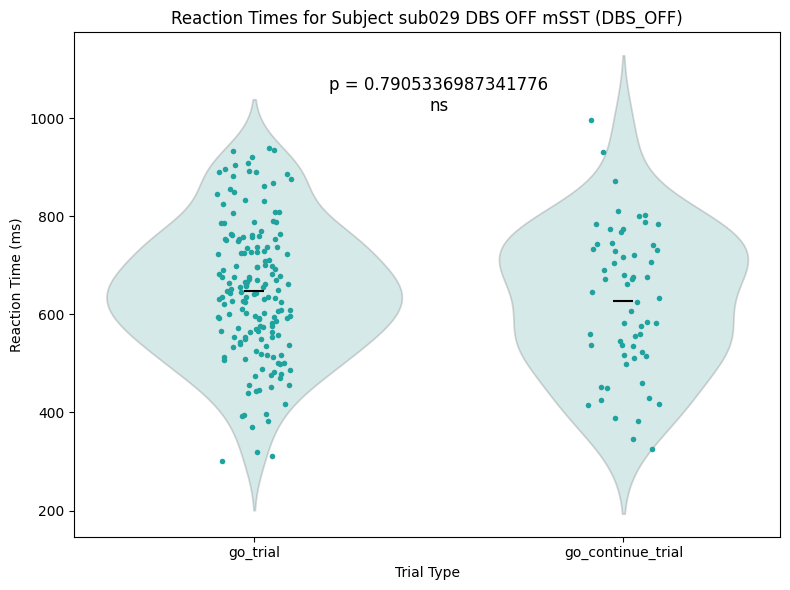

Data does NOT appear normal (p = 3.313054008913241e-08 )
Data does NOT appear normal (p = 0.0037152832373976707 )


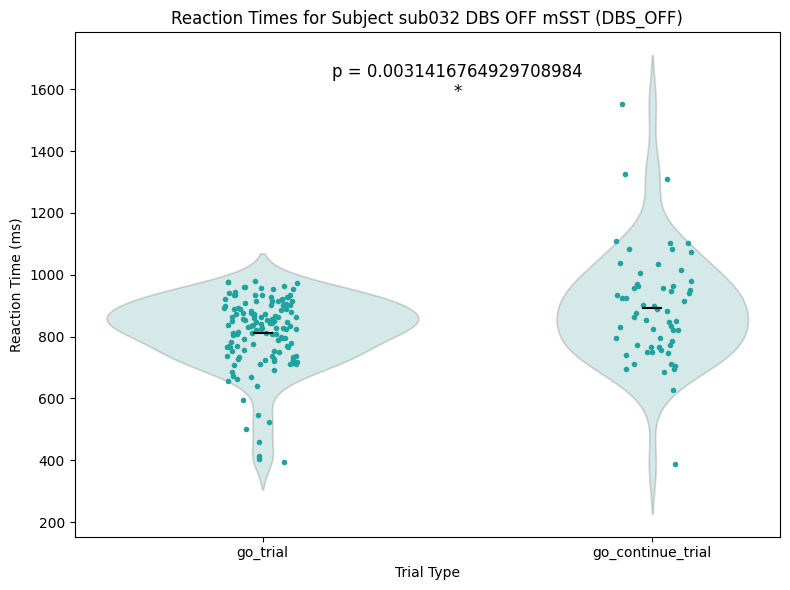

Data does NOT appear normal (p = 2.476959082287067e-07 )
Data appears normally distributed (p = 0.05765368789434433 )


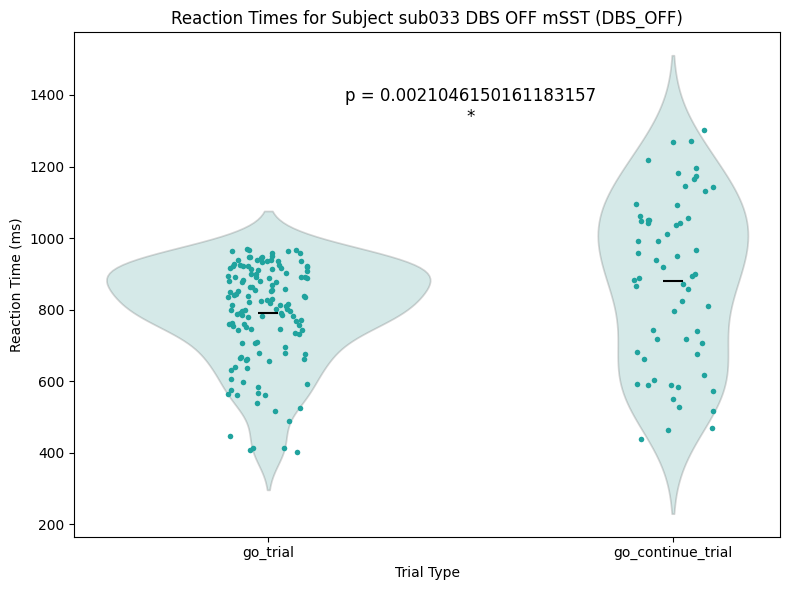

Data does NOT appear normal (p = 0.0007015063893049955 )
Data appears normally distributed (p = 0.3412156403064728 )


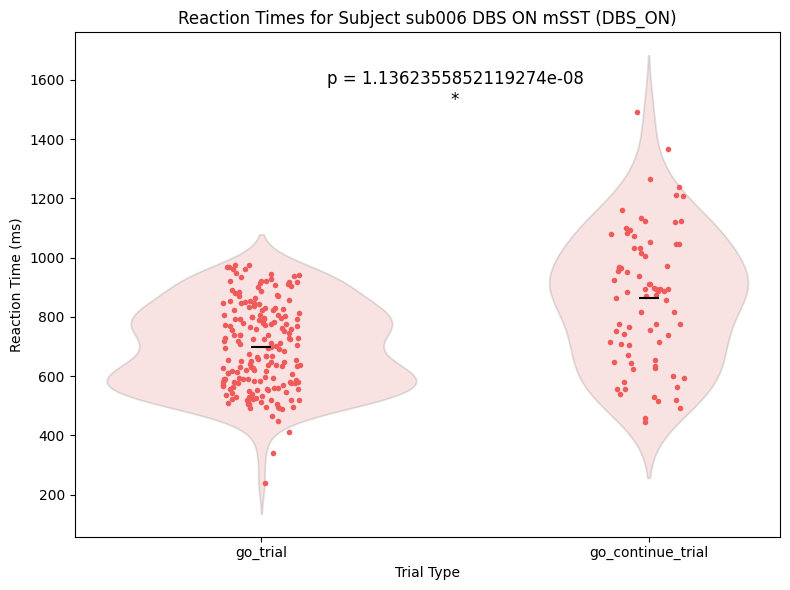

Data does NOT appear normal (p = 0.0017104794969782233 )
Data appears normally distributed (p = 0.3931122124195099 )


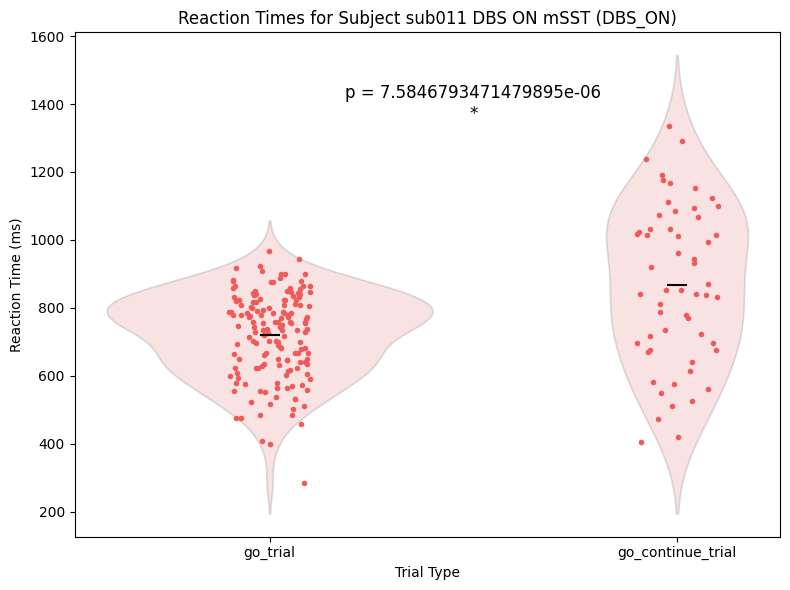

Data does NOT appear normal (p = 0.039899297058582306 )
Data appears normally distributed (p = 0.2262801080942154 )


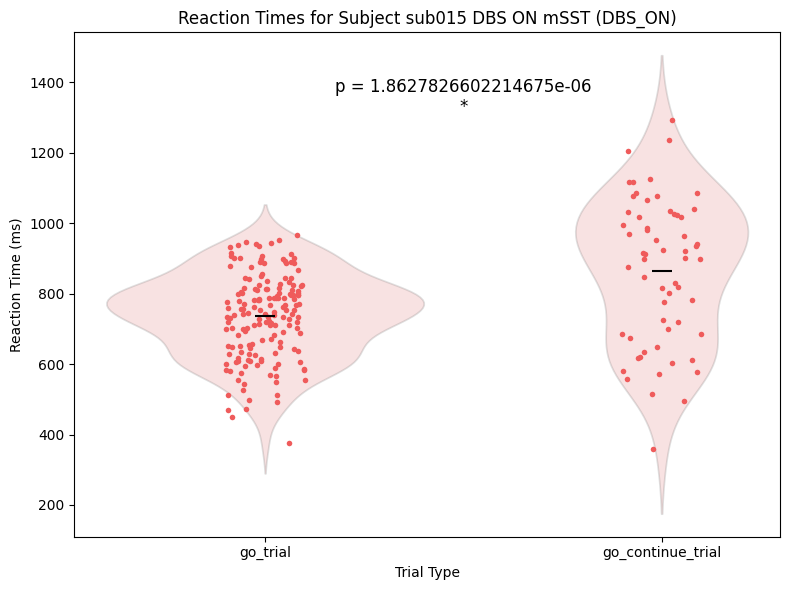

Data does NOT appear normal (p = 1.3135466758740222e-07 )
Data appears normally distributed (p = 0.17646068334579468 )


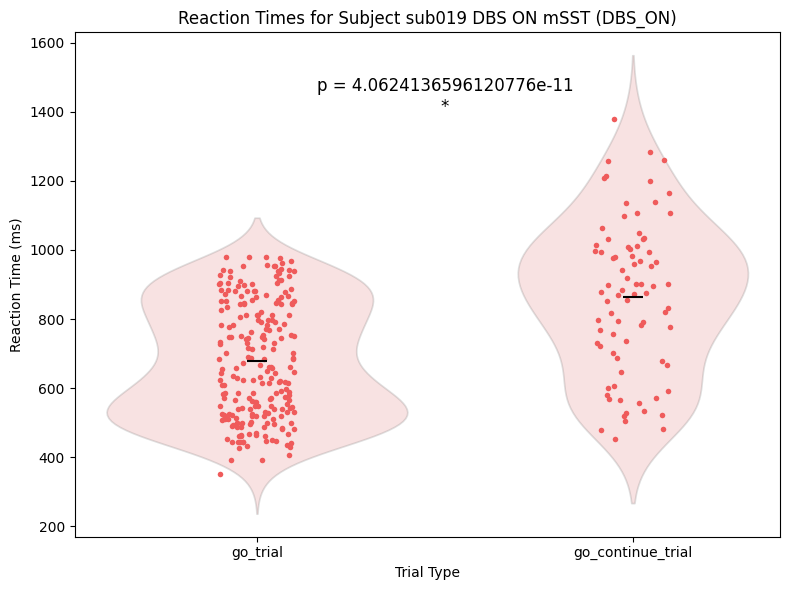

Data does NOT appear normal (p = 0.01367142703384161 )
Data appears normally distributed (p = 0.06892509013414383 )


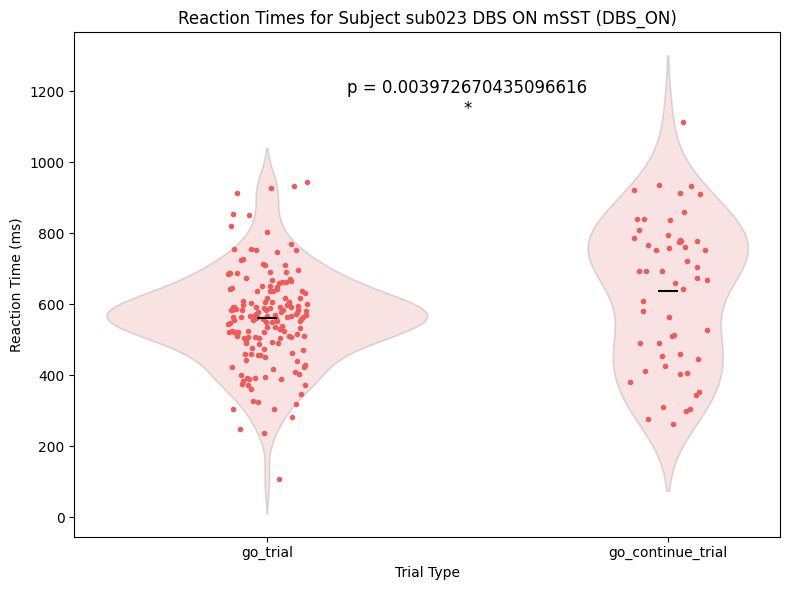

Data appears normally distributed (p = 0.4636291563510895 )
Data appears normally distributed (p = 0.07582459598779678 )


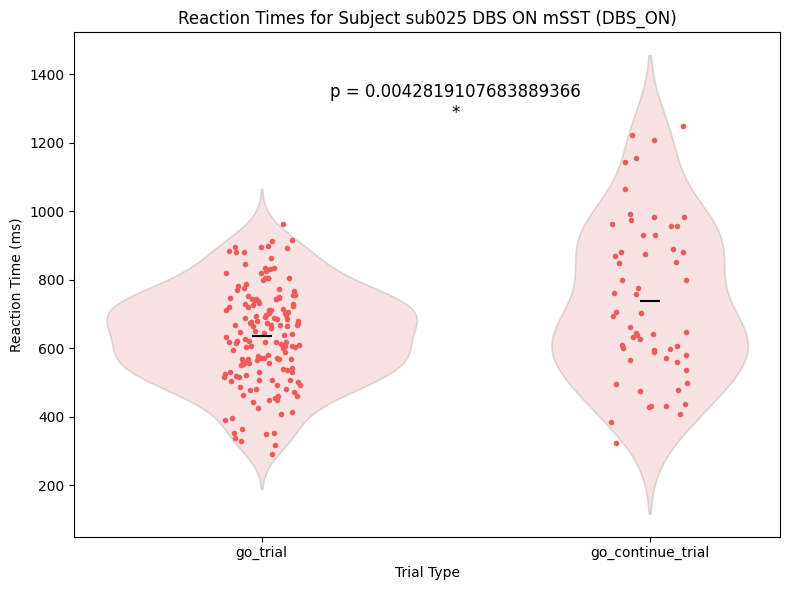

Data appears normally distributed (p = 0.6107603311538696 )
Data does NOT appear normal (p = 0.0013624723069369793 )


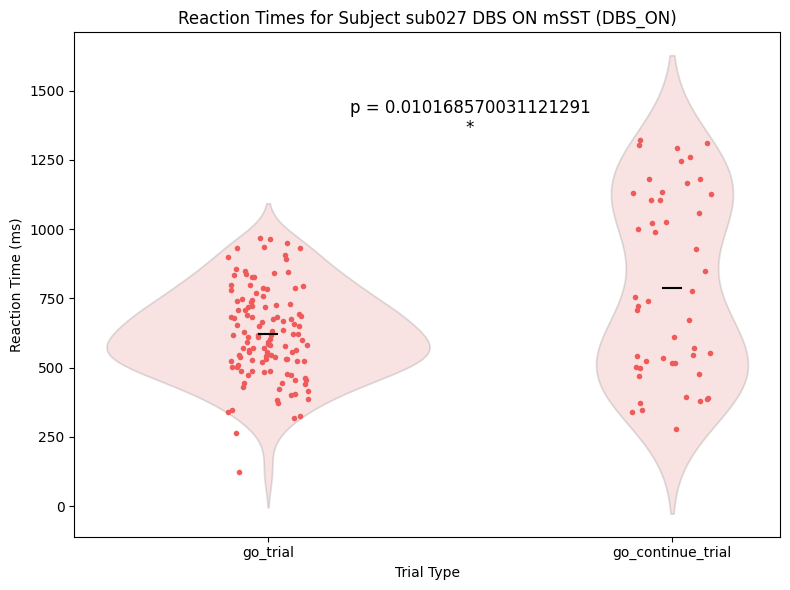

Data does NOT appear normal (p = 0.00044360646279528737 )
Data does NOT appear normal (p = 0.04623769596219063 )


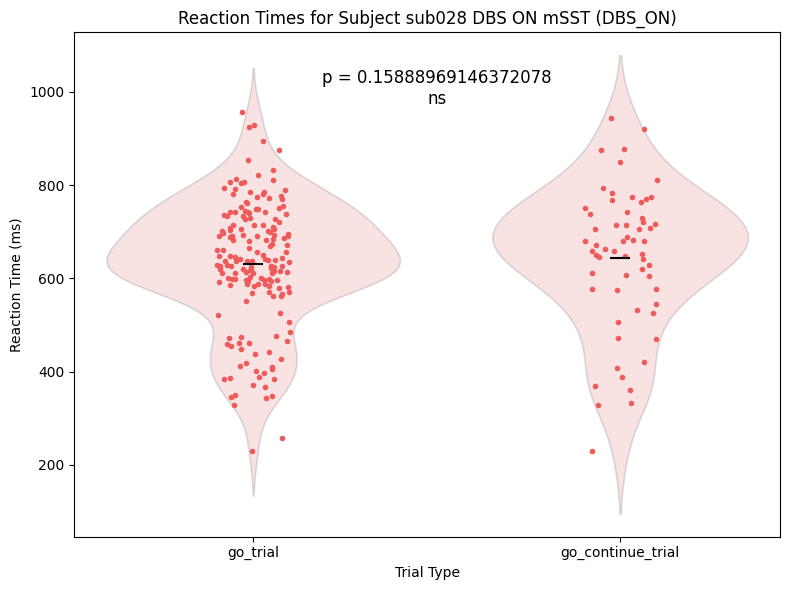

Data does NOT appear normal (p = 1.6387693904107437e-05 )
Data does NOT appear normal (p = 0.016383865848183632 )


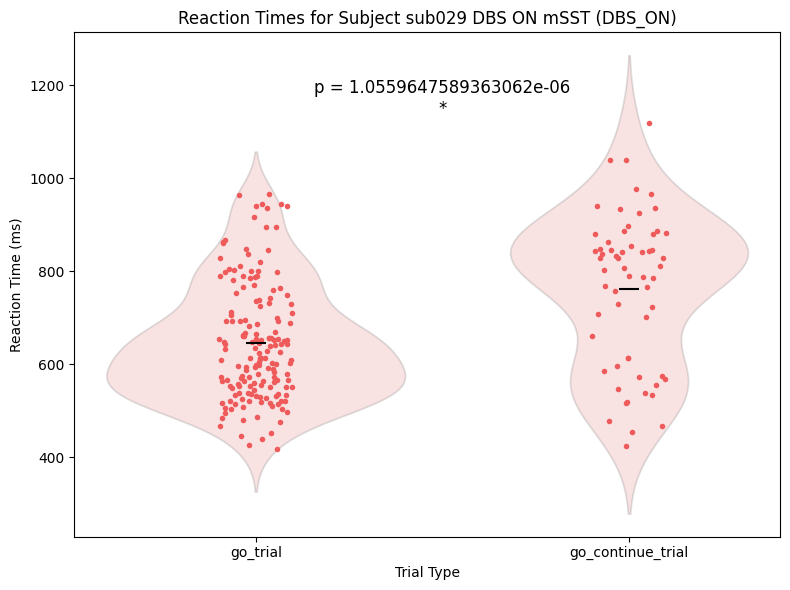

Data does NOT appear normal (p = 5.502665317180799e-06 )
Data does NOT appear normal (p = 0.0006471732049249113 )


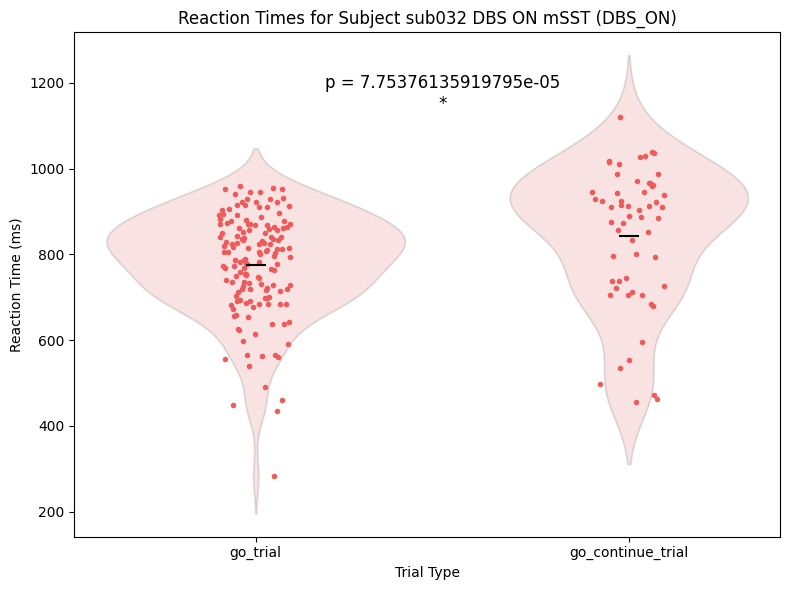

Data does NOT appear normal (p = 9.864510985835295e-08 )
Data does NOT appear normal (p = 0.005892832763493061 )


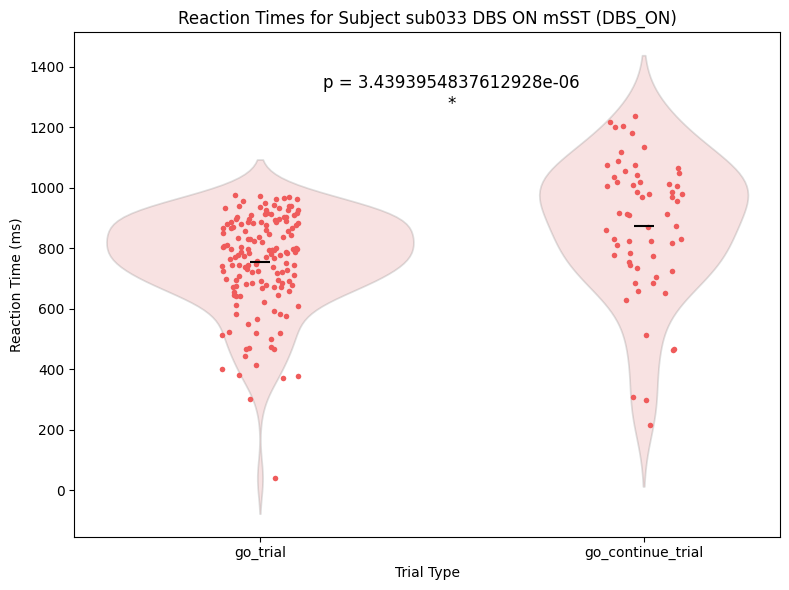

Data does NOT appear normal (p = 4.0529806710765115e-07 )
Data appears normally distributed (p = 0.396363765001297 )


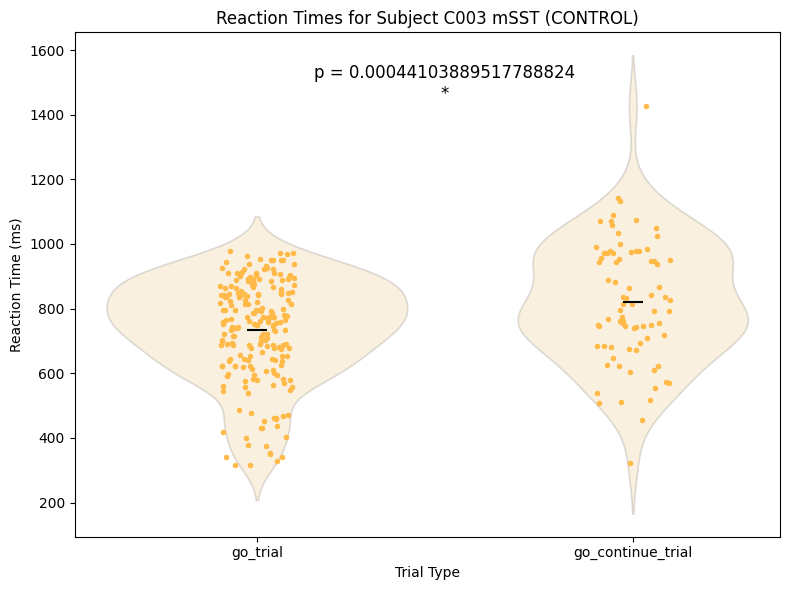

Data does NOT appear normal (p = 8.226389036281034e-05 )
Data does NOT appear normal (p = 0.0015703138196840882 )


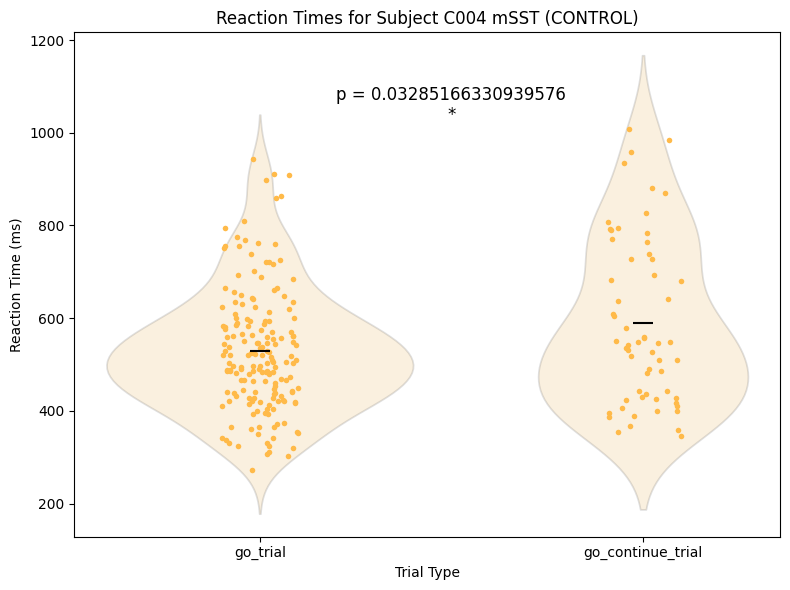

Data does NOT appear normal (p = 0.0007841320475563407 )
Data does NOT appear normal (p = 0.00029861481743864715 )


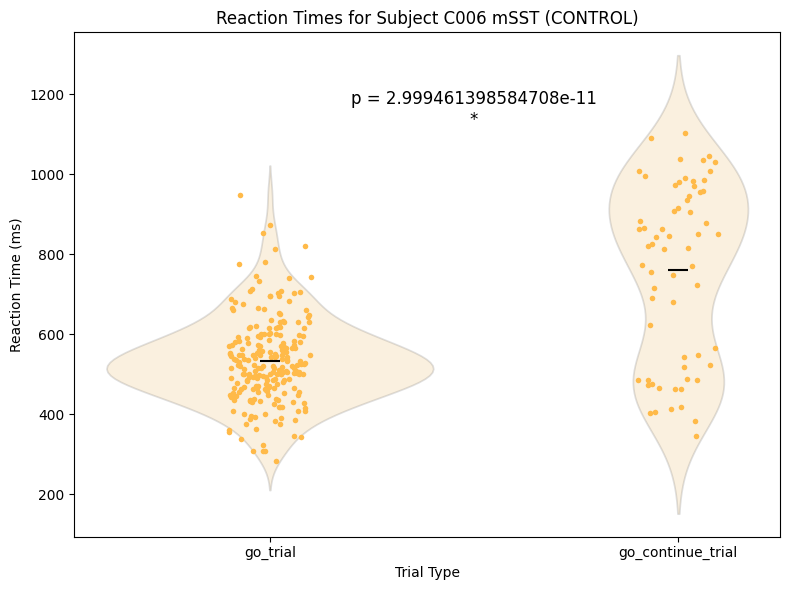

Data does NOT appear normal (p = 0.00012148881796747446 )
Data appears normally distributed (p = 0.13397693634033203 )


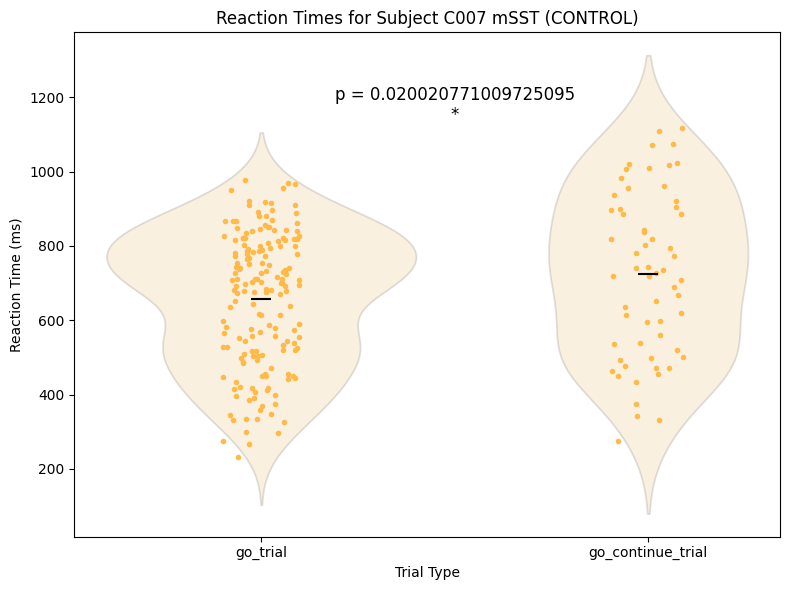

Data does NOT appear normal (p = 1.0135134971278603e-06 )
Data does NOT appear normal (p = 0.030134281143546104 )


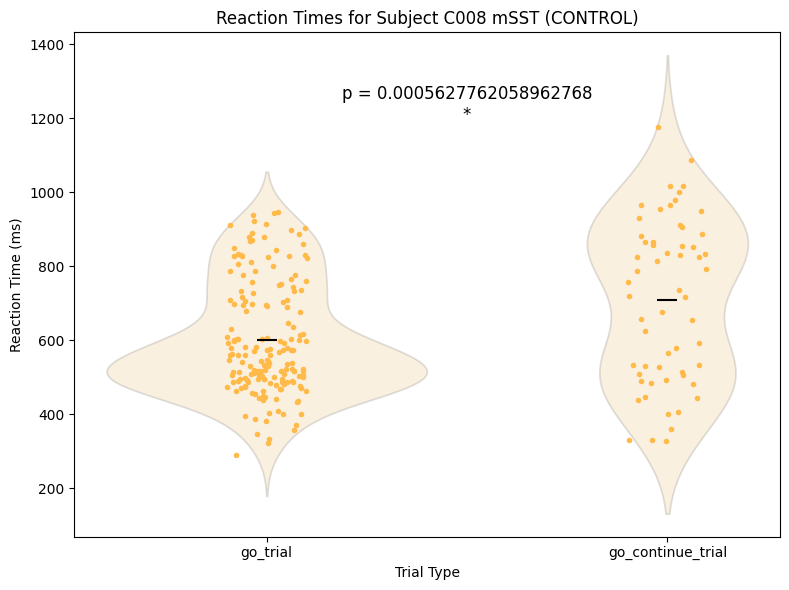

Data does NOT appear normal (p = 1.2295548913243692e-05 )
Data does NOT appear normal (p = 0.00019892954151146114 )


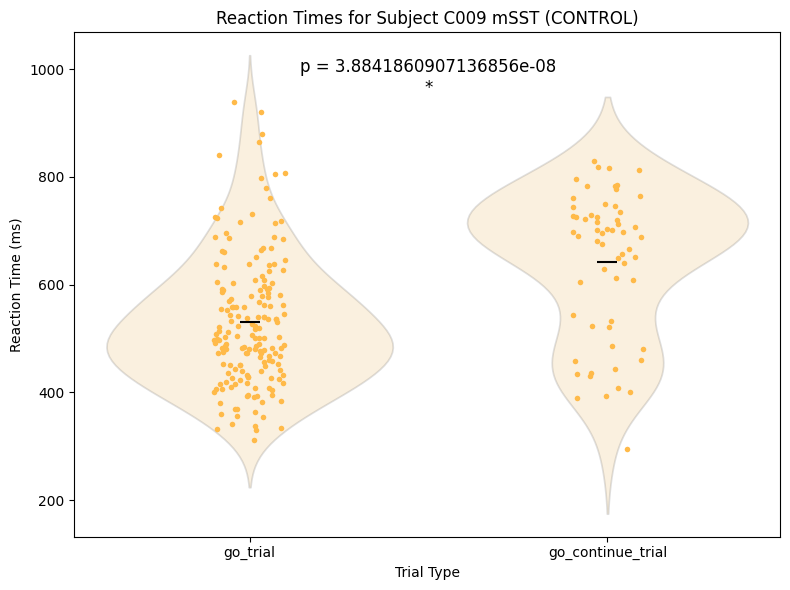

Data appears normally distributed (p = 0.07616440206766129 )
Data does NOT appear normal (p = 0.00023386762768495828 )


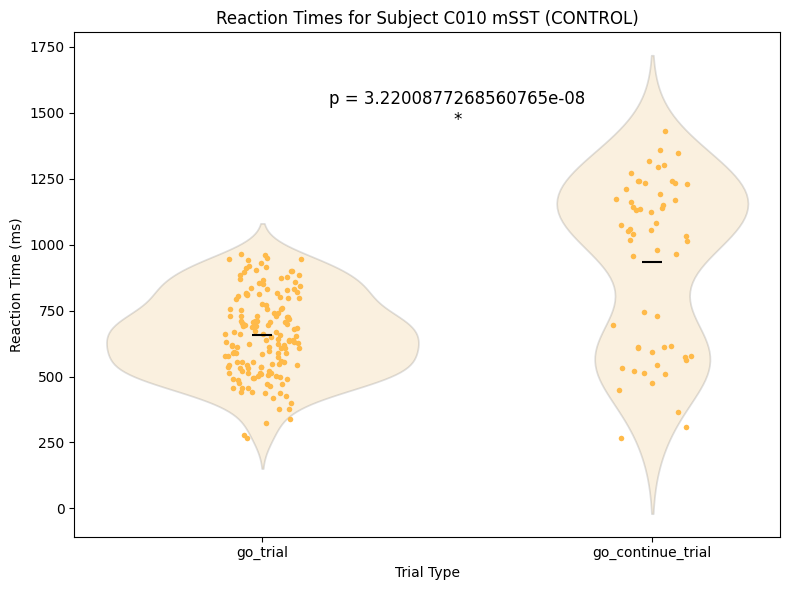

Data does NOT appear normal (p = 0.0016999179497361183 )
Data does NOT appear normal (p = 0.0013709081104025245 )


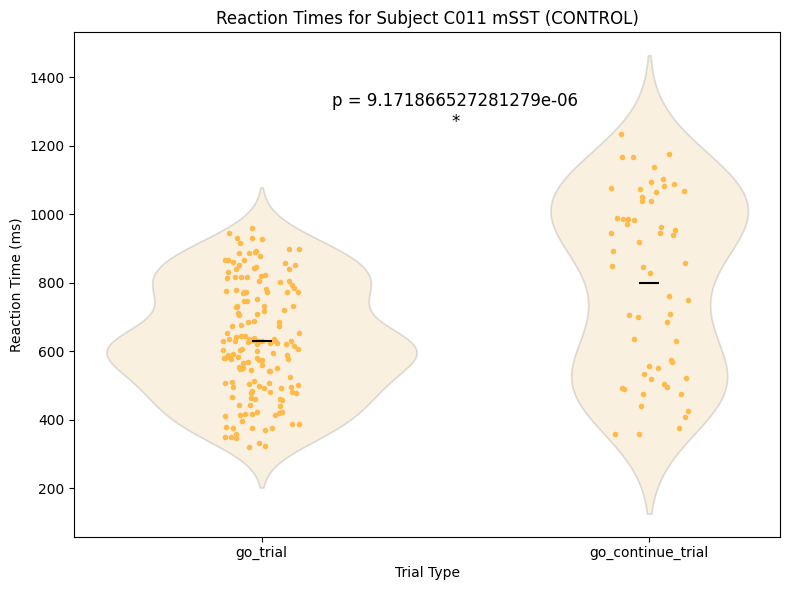

Data does NOT appear normal (p = 0.0009507587528787553 )
Data appears normally distributed (p = 0.5049077272415161 )


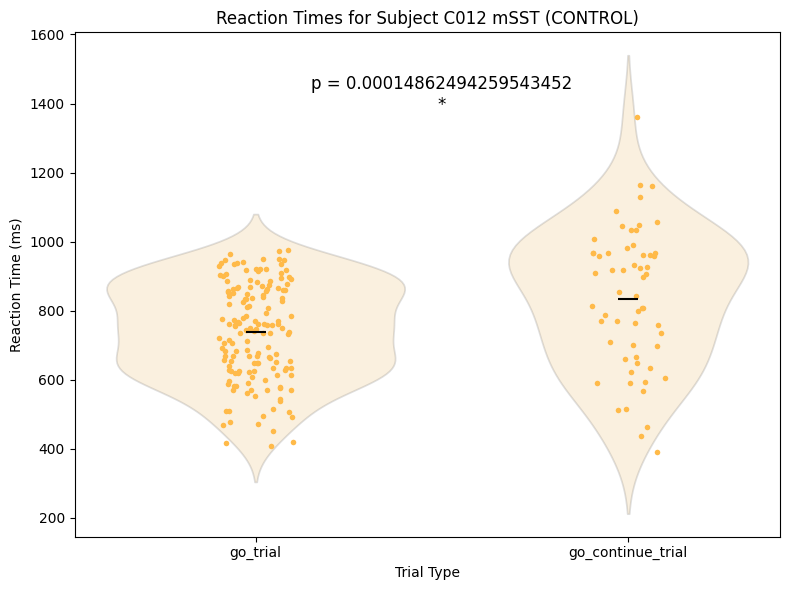

In [35]:
# Define trial types to include only go trials and stop_trials
trial_types = ['go_trial', 'go_continue_trial']


# Loop through the filtered dictionaries (e.g., stats_OFF, stats_ON, etc.)
for condition, condition_stats in [('dbs_off', stats_OFF), 
                                   ('dbs_on', stats_ON), 
                                   ('control', stats_CONTROL), 
                                   ('preop', stats_PREOP)]:
    for subject_id, subject_data in condition_stats.items():
        if subject_id not in final_included_subjects:
            continue
        # Gather data for the selected trial types into a DataFrame
        data = []
        for trial_type in trial_types:
            if f"{trial_type} RTs (ms)" in subject_data:  # Ensure the trial type key exists
                data.extend([(trial_type, val) for val in subject_data[f"{trial_type} RTs (ms)"]])

        df = pd.DataFrame(data, columns=['Trial Type', 'Reaction Time'])

        # Extract reaction times for statistical comparison
        go_data = df[df['Trial Type'] == 'go_trial']['Reaction Time']
        go_continue_data = df[df['Trial Type'] == 'go_continue_trial']['Reaction Time']

        # Test for normality:
        stat, p = scipy.stats.shapiro(go_data)
        if p > 0.05:
            print("Data appears normally distributed (p =", p, ")")
        else:
            print("Data does NOT appear normal (p =", p, ")")

        stat, p = scipy.stats.shapiro(go_continue_data)
        if p > 0.05:
            print("Data appears normally distributed (p =", p, ")")
        else:
            print("Data does NOT appear normal (p =", p, ")")    

        # Data is not normal, use non-parametric test (mann whitney)

        # Perform Mann-Whitney U test if both trial types have sufficient data
        if len(go_data) >= 2 and len(go_continue_data) >= 2:  # Minimum data size for test
            stat, p_value = scipy.stats.mannwhitneyu(go_continue_data, go_data, alternative='greater')
        else:
            p_value = None  # Not enough data to perform test

        # Initialize the plot
        plt.figure(figsize=(8, 6))

        # Plot violins for the single condition using the custom palette
        sns.violinplot(data=df, x='Trial Type', y='Reaction Time', 
                       inner=None, color=color_dict[condition], alpha=0.2)  # Use condition color

        # Overlay data points with a strip plot
        sns.stripplot(data=df, x='Trial Type', y='Reaction Time', 
                      jitter=True, color=color_dict[condition], marker='o', size=4)

        # Calculate and plot means manually for each trial type
        for i, trial_type in enumerate(trial_types):
            condition_data = df[df['Trial Type'] == trial_type]
            mean_value = condition_data['Reaction Time'].mean()
            plt.scatter(x=i, y=mean_value, color='black', marker="_", s=200, label='Mean' if i == 0 else "", zorder=5)

        # Annotate statistical results
        if p_value is not None:
            annotation = "ns" if p_value >= 0.05 else "*"
            max_val = df['Reaction Time'].max()
            plt.text(0.5, max_val + 10, f"p = {p_value}\n{annotation}", 
                     ha='center', va='bottom', color='black', fontsize=12)

        # Customize plot
        plt.xlabel('Trial Type')
        plt.ylabel('Reaction Time (ms)')
        plt.title(f'Reaction Times for Subject {subject_id} ({condition.upper()})')
        plt.tight_layout()

        plt.savefig(join(behav_results_saving_path, f"Go continue triggered inhibition {subject_id}.png"))
        plt.show()